# Setup

Install in R:
```
install.packages("BiocManager")
BiocManager::install(c("edgeR", "BiocParallel", "RhpcBLASctl"))
```

Install

```pip install toytree ete4 pybiomart```

## Options & Data

In [105]:
%load_ext autoreload
%autoreload 2

import os
import re
import pickle
import matplotlib.pyplot as plt
import warnings
import logging
import seaborn as sns
from scipy.sparse import issparse
from pymer4.models import lmer, lm, glmer, compare
from pymer4 import config
import polars
import statsmodels.api as sm
import senepy
import gseapy as gp
import pertpy as pt
import scanpy as sc
import pandas as pd
import numpy as np
import scflow
from scflow.ax import find_senescence_genes, run_senepy

# Display/Environment Settings
os.environ["KMP_DUPLICATE_LIB_OK"] = "True"
warnings.filterwarnings("ignore", message=".*ast.Ellipsis is deprecated.*")
config.PANDAS_BACKEND = True
warnings.filterwarnings("ignore", message=".*vert.*will be deprecated.*")
pd.set_option("display.max_rows", 500)  # or None for unlimited rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 100)
pd.set_option("display.width", 300)
warnings.filterwarnings(
    "ignore", message="Bitwise inversion '~' on bool is deprecated",
    category=DeprecationWarning)

# Process Options
ncpus = os.cpu_count() - 1
overwrite = True

# If You Want Results Emailed (Will Overwrite HTML Regardless of `overwite`)
cur_file = os.path.join(os.path.abspath(""), "analyze_senescence_celltype"
                        "_specific_threshold.ipynb")
html_out = os.path.splitext(cur_file)[0] + ".html"
email = "elizabeth.aslinger@aya.yale.edu"
# set email to None to skip

# Cell Type Label Column
col_celltype = "annotation_scanvi"
# col_celltype = "annotation_by_overlap"
# col_celltype = "Annotation_ToppGene"
# col_celltype = "cellmap_class_name"
# col_celltype = "cellmap_class_name_collapsed"
# use_hierarchy = False
collapse_neurons = True  # collapse neuron categories?

# Metadata Information
species = "Mouse"
col_sample, col_batch = "sample", "Group"
# col_age = "Characteristics[Age at Euthanasia]"
# col_condition = "Factor Value[Spaceflight]"
col_age = "Age_End"
col_condition = "Condition"
# group_order = ["Ground Control | 12 Weeks", "Ground Control | 29 Weeks",
#                "Space Flight | 12 Weeks", "Space Flight | 29 Weeks"]
group_order = ["Ground Control | 20 Weeks", "Ground Control | 37 Weeks",
               "Space Flight | 20 Weeks", "Space Flight | 37 Weeks"]
keys = {col_condition: dict(key_control="Ground Control",
                            key_treatment="Space Flight"),
        col_age: dict(key_control="20 Weeks",
                      key_treatment="37 Weeks"),
        # col_age: dict(key_control="12 Weeks",
        #               key_treatment="29 Weeks"),
        col_batch: dict(key_control=group_order[0],
                        key_treatment=group_order[1:])}
palette = {col_condition: {keys[col_condition]["key_control"]: "b",
                           keys[col_condition]["key_treatment"]: "r"},
           col_age: {keys[col_age]["key_control"]: "g",
                     keys[col_age]["key_treatment"]: "y"},
           col_batch: dict(zip(group_order, ["c", "b", "tab:pink", "r"]))}

# Scoring Metrics
sen_metrics = ["senmayo"]
# sen_metrics = ["senepy", "senmayo"]
use_metric = "senmayo"
percentile = 1

# File Input & Output
file_path = "data/OSD-613_integrated.h5ad"
file_path_new = os.path.splitext(file_path)[0] + "_analyzed.h5ad"

# Load Data
self = scflow.Rna(file_path, col_sample=col_sample, col_batch=col_batch,
                  col_celltype=col_celltype)  # data
self.rna.obs.loc[:, col_batch] = self.rna.obs[col_batch].astype(
    pd.CategoricalDtype(categories=group_order, ordered=True))
self.rna = self.rna[:, self.rna.var.mt == False]  # snRNA-seq so remove MT-
self.rna = self.rna[:, self.rna.var.ribo == False]  # snRNA-seq so remove RB-
self.rna.obs.loc[:, "Spaceflight"] = (self.rna.obs[col_condition] == keys[
    col_condition]["key_treatment"]).astype(int)  # 1 vs. 0 spaceflight
self.rna.obs.loc[:, "Aged"] = (self.rna.obs[col_age] == keys[
    col_age]["key_treatment"]).astype(int)  # 1 vs. 0 older
self.rna.X = self.rna.layers["log1p"].copy()
self.rna.raw = None

# Hierarchical
keys_cts = {"Neurons": ["Excitatory", "Inhibitory",
                        "Excitatory-Inhibitory", "Neuron"],
            "Macroglia": ["Oligodendrocyte", "OPC", "Astrocyte"],
            "Microglia": ["Microglial"],
            "Endothelial Cell": ["Endothelial"]}
key_cts = dict(pd.concat([pd.Series(dict(([(i, x) for i in keys_cts[
    x]]))) for x in keys_cts]))
if collapse_neurons is True:
    self.rna.obs.loc[:, f"{col_celltype}_collapsed"] = self.rna.obs[
        col_celltype].replace(dict(zip(keys_cts["Neurons"], ["Neurons"] * 3)))
    col_celltype = f"{col_celltype}_collapsed"
    self.col_celltype = col_celltype
self.rna.obs.loc[:, f"{col_celltype}_hierarchy"] = self.rna.obs[
    col_celltype].replace(key_cts)

# Display Object
print(self.rna)
print(self.rna.obs.groupby(col_sample).describe())
self.rna.obs

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
AnnData object with n_obs × n_vars = 103274 × 12097
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Param

,Group,sample,Sample Number,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Strain],Term Source REF.1,Term Accession Number.1,Characteristics[Genotype],Term Source REF.2,Term Accession Number.2,Characteristics[Animal Source],Characteristics[Sex],Term Source REF.3,Term Accession Number.3,Factor Value[Spaceflight],Term Source REF.4,Term Accession Number.4,Factor Value[Age],Unit,Term Source REF.5,Term Accession Number.5,Characteristics[Material Type],Term Source REF.6,Term Accession Number.6,Characteristics[diet],Characteristics[Feeding Schedule],Characteristics[Age at Euthanasia],Unit.1,Term Source REF.7,Term Accession Number.7,Protocol REF,Parameter Value[habitat],Parameter Value[Enrichment material],Parameter Value[duration],Unit.2,Term Source REF.8,Term Accession Number.8,Parameter Value[light cycle],Protocol REF.1,Parameter Value[Euthanasia Method],Parameter Value[Sample Preservation Method],Term Source REF.9,Term Accession Number.9,Parameter Value[Sample Storage Temperature],Unit.3,Term Source REF.10,Term Accession Number.10,Comment[RFID],Comment[Euthanasia Date],Time,n_cells_original_sample,kws_pp_sample,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt,total_counts_ribo,pct_counts_ribo,log1p_total_counts_ribo,total_counts_hb,pct_counts_hb,log1p_total_counts_hb,n_counts,n_genes,doublet_score,predicted_doublet,leiden_individual_res0.2dist1.5,annotation_by_markers_individual_res0.2dist1.5,annotation_by_markers_individual_heterogeneous_collapsed,leiden_individual,annotation_by_markers_individual,kws_cluster_individual,annotation_scanvi,kws_integrate,leiden,leiden_resolution,leiden_n_neighbors,leiden_min_dist,leiden_subcluster,resolution_leiden_subcluster,annotation_by_overlap,majority_voting_short,Age_Start,Age_End,Condition,annotation_toppgene,predicted_labels,majority_voting,majority_voting_probabilities,annotation_majority_voting,Spaceflight,Aged,annotation_scanvi_collapsed,annotation_scanvi_collapsed_hierarchy
AAACAGCCAATCGCAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 20 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,HGC-ISS-04,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON/10090,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Left cerebral hemisphere,FMA,http://purl.org/sig/ont/fma/fma61819,Nutrient Upgraded Rodent Food Bar (NuRFB),ad libitum,20,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Animal Husbandry,Rodent Flight Hardware (Transporter and Habitat),Hut,53,day,UO,http://purl.obolibrary.org/obo/UO_0000033,12 h light/dark cycle,sample collection,"Bilateral thoracotomy with sedation, Cardiac puncture with sedation, Ketamine/xylazine injection",Liquid Nitrogen,NCIT,http://purl.obolibrary.org/obo/NCIT_C68796,-80,degree Celsius,UO,http://purl.obolibrary.org/obo/UO_0000027,6E2A671967,18-Sep-2019,1149.0,8542,"{'min_max_genes': [321.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [4...",2074,2981.067871,7.637716,8.000372,13.387463,0.449083,2.666357,10.547901,0.353830,2.446504,1.628919,0.054642,0.966573,4962.0,2152,0.030852,False,1,Neuron,Neuron,1,Neuron,"{'resolution': 0.2, 'min_dist': 1.5, 'n_comps': 50}",Neuron,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",0,0.0075,15,1.8,"0,0",0.005,Neuron,L4/5 IT CTX Glut,12 Weeks,20 Weeks,Ground Control,Excitatory,006 L4/5 IT CTX Glut,006 L4/5 IT CTX Glut,0.842869,Glutamatergic,0,0,Neuron,Neurons
AAACAGCCAGCACCAT-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 20 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,HGC-ISS-04,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON/10090,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http

## Data Descriptives

In [106]:
%matplotlib inline

# Detect Metadata Columns in AnnData Object
metadata_cols = self.rna.obs.groupby(col_sample).apply(
    lambda x: list(x.columns[np.where(
        x.apply(lambda y: len(y.unique()) ==  1))[0]]))
metadata_cols = [x for x in metadata_cols.explode().unique() if all((
    x in metadata_cols.loc[i] for i in metadata_cols.index.values))]

# Value Counts for Categorical Variables
metadata_cols_category = self.rna.obs[metadata_cols].dtypes[((
    self.rna.obs[metadata_cols].dtypes == "category") | (self.rna.obs[
        metadata_cols].apply(lambda x: len(x.unique()) < 6))) & (self.rna.obs[
            metadata_cols].apply(lambda x: len(x.unique()) > 1))].index
for x in metadata_cols_category:
    print(x, "\n\n", self.rna.obs[x].value_counts(), "\n\n")
    if col_batch is not None:  # by batch
        if x != col_batch:
            print(x, "\n\n", self.rna.obs[[x, col_batch]].groupby(
                col_batch).value_counts(), "\n\n")

# Descriptives for Continuous Variables
print(self.rna.obs[self.rna.obs.columns.difference(
    metadata_cols_category)].describe())
if col_batch is not None:  # by batch
    print(self.rna.obs[list(self.rna.obs.columns.difference(
        metadata_cols_category)) + [col_batch]].groupby(col_batch).describe())

# Cells per Cluster
perc_clusters = round(100 * self.rna.obs.groupby(col_sample).value_counts(
    [col_celltype], normalize=True).unstack(1), 2)
print(f"\n\n*** Cell Composition (%) ***\n\n{perc_clusters}")

# Number of Cells
n_cells = self.rna.obs.groupby(col_sample).apply(
    lambda x: x.n_cells_original_sample.unique()[0],
    include_groups=False).to_frame("Original Cell N").join(
        self.rna.obs.groupby(col_sample).apply(
            lambda x: x.shape[0], include_groups=False).to_frame("N Cells"))
n_cells.loc[:, "Percent_Filtered"] = round(100 * (1 - n_cells[
    "N Cells"] / n_cells["Original Cell N"]), 2)
print("\n\n", n_cells.sort_values("Percent_Filtered"))

/tmp/ipykernel_2795448/1416146960.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metadata_cols = self.rna.obs.groupby(col_sample).apply(


Group 

 Group
Ground Control | 37 Weeks    35362
Ground Control | 20 Weeks    31600
Space Flight | 37 Weeks      19904
Space Flight | 20 Weeks      16408
Name: count, dtype: int64 


sample 

 sample
RRRM2_BRN_GC_ISS-T_OLD_GO16     18386
RRRM2_BRN_GC_ISS-T_YNG_GY2       9651
RRRM2_BRN_GC_ISS-T_YNG_GY4       7547
RRRM2_BRN_GC_ISS-T_OLD_GO19      7539
RRRM2_BRN_GC_ISS-T_OLD_GO18      5842
RRRM2_BRN_FLT_ISS-T_OLD_FO19     5747
RRRM2_BRN_GC_ISS-T_YNG_GY9       5465
RRRM2_BRN_GC_ISS-T_YNG_GY7       5265
RRRM2_BRN_FLT_ISS-T_YNG_FY8      5095
RRRM2_BRN_FLT_ISS-T_OLD_FO20     4922
RRRM2_BRN_FLT_ISS-T_OLD_FO16     4050
RRRM2_BRN_FLT_ISS-T_YNG_FY5      3914
RRRM2_BRN_FLT_ISS-T_OLD_FO14     3864
RRRM2_BRN_FLT_ISS-T_YNG_FY2      3730
RRRM2_BRN_GC_ISS-T_YNG_GY1       3672
RRRM2_BRN_FLT_ISS-T_YNG_FY7      3669
RRRM2_BRN_GC_ISS-T_OLD_GO13      3595
RRRM2_BRN_FLT_ISS-T_OLD_FO17     1321
Name: count, dtype: int64 


sample 

 Group                      sample                      
Ground Control | 20 

## Get Marker Gene Sets

From Google Drive, except senmayo derived from file downloaded from
https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/SAUL_SEN_MAYO.html
then created using:

```
from pybiomart import Server

senmayo = pd.read_csv("resources/SAUL_SEN_MAYO.v2025.1.Hs.tsv",
                      sep="\t", header=0)
senmayo = senmayo[senmayo.STANDARD_NAME == "GENE_SYMBOLS"]
senmayo = pd.Series({"Senmayo": senmayo.iloc[0, 1].split(
    ",")}, name="symbol").rename_axis("Gene_Set").explode().str.strip(
        ).replace("", np.nan).dropna().to_frame()
server = Server(host="http://www.ensembl.org")
mart = server.marts["ENSEMBL_MART_ENSEMBL"] # Access the Ensembl mart
human_dataset = mart.datasets["hsapiens_gene_ensembl"]
orthologs = human_dataset.query(attributes=[
    "external_gene_name", "mmusculus_homolog_associated_gene_name"])
orthologs = orthologs.dropna().set_index(orthologs.columns[0])
orthologs = orthologs.loc[orthologs.index.intersection(
    senmayo.symbol.to_list())].iloc[:, 0]
print(f"{orthologs.shape[0]} orthologs found out of"
      f" {len(senmayo.symbol.unique())} senmayo genes")
senmayo = senmayo.assign(symbol=senmayo.replace({"symbol": dict(zip(
    orthologs.index, orthologs.values))}))
senmayo.to_csv("gene_sets/senmayo.csv")
```

(Also could use `scflow.tl.convert_gene_species(senmayo.symbol.to_list())`)

Certain gene sets created from Google Drive ADBR AWG > Projects > White Matter > Gene Sets files (with the suffix = "_adjusted") were modified for consistency, e.g.,

```
pd.read_csv("gene_sets/_iron_genes_gmt_out.csv", index_col=[
    0, 1]).rename_axis(["row_id", "pathway"]).stack().to_frame(
        "symbol").reset_index(-1, drop=True).reset_index().to_csv(
            "gene_sets/_iron_genes_gmt_out_adjusted.csv")
```


### *A Priori*

In [107]:
mks = [pd.read_csv(os.path.join("gene_sets", i)).dropna(
    how="all", axis=1).assign(Source_File=i) for i in os.listdir("gene_sets")]
mks = [x.assign(Gene_Set=x["Source_File"].iloc[0].split("_2025")[0]) if (
    "pathway" in x) else x for x in mks]
mks = pd.concat(mks).drop("Unnamed: 0", axis=1).drop("row_id", axis=1)
mks = mks[mks.symbol.isin(self.rna.var_names)]
mks = mks[["Gene_Set", "symbol"]].set_index("Gene_Set").groupby(
    "Gene_Set").apply(lambda x: x["symbol"].to_list())
marker_genes_dict = dict(mks)
marker_gene_sets = mks.copy()
print(marker_gene_sets)

Gene_Set
GOBP_CELLULAR_RESPONSE_TO_IRON_ION                                                                                                                                                                                                                          [B2m, Bmp6, Gpld1, Ireb2, Tfrc, Trf]
GOBP_CENTRAL_NERVOUS_SYSTEM_MYELIN_FORMATION                                                                                                                                                                                                      [Abca2, Ckap5, Cntn1, Ercc2, Mag, Mios, Tenm4]
GOBP_INTRACELLULAR_IRON_ION_HOMEOSTASIS                                                                                                                                                      [Abcb7, Aco1, Atp13a2, Atp6ap1, Atp6v0a2, Atp6v0d1, Atp6v1a, Atp6v1g1, B2m, Bmp6, Bmyc, Bola2, C...
GOBP_IRON_COORDINATION_ENTITY_TRANSPORT                                                                                     

### Clusters in Data

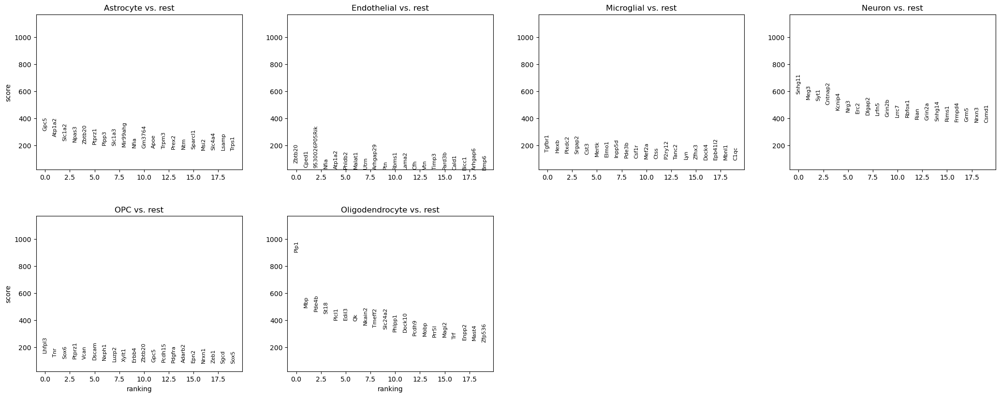

scores  logfoldchanges          pvals      pvals_adj
annotation_scanvi_collapsed annotation_scanvi_collapsed names                                                                  
Astrocyte                   Astrocyte                   Bcl2            48.966312        2.244818   0.000000e+00   0.000000e+00
                                                        Abhd3           47.107872        3.003248   0.000000e+00   0.000000e+00
                                                        Ugp2            47.243469        2.251395   0.000000e+00   0.000000e+00
Endothelial                 Endothelial                 Zbtb20          71.523643        3.209239   0.000000e+00   0.000000e+00
                                                        Cped1           37.842743        7.205899  3.891507e-186  6.621035e-185
                                                        9530026P05Rik   34.913925        5.121674  7.849119e-168  1.249353e-166
Microglial                  Microglial                  Tgfbr1         151.537048        7.483766   0.000000e+00   0.000000e+00
                                                        Hexb           150.142044        5.966863   0.000000e+00   0.000000e+00
                                                        Plxdc2         145.446838        4.734621   0.000000e+00   0.000000e+00
Neuron                      Neuron                      Pde7a           56.121979        1.154942   0.000000e+00   0.000000e+00
                                                        Chic1           55.948746        1.314887   0.000000e+00   0.000000e+00
                                                        Pkig            55.969212        1.236063   0.000000e+00   0.000000e+00
OPC                         OPC                         Lhfpl3         161.057190        5.147624   0.000000e+00   0.000000e+00
                                                        Tnr            131.139984        4.126481   0.000000e+00   0.000000e+00
                                                        Sox6           118.223061        5.241720   0.000000e+00   0.000000e+00
Oligodendrocyte             Oligodendrocyte             Map4k5          52.164612        1.264680   0.000000e+00   0.000000e+00
                                                        Dleu2           54.534840        1.288954   0.000000e+00   0.000000e+00
                                                        E130308A19Rik   54.438168        1.582712   0.000000e+00   0.000000e+00

In [108]:
self.find_markers(col_celltype=col_celltype)
df_celltype_markers = self.get_markers_df(
    n_genes=50, col_celltype=col_celltype,
    log2fc_threshold=1, p_threshold=1e-10)
df_celltype_markers.groupby(col_celltype).apply(lambda x: x.head(3))

# Regress Out?

In [109]:
# if vars_regress_out is not None:
#     self.rna.X = self.rna.layers["log1p"].copy()
#     sc.pp.regress_out(self.rna, vars_regress_out)
#     self.rna.layers["log1p"] = self.rna.X.copy()
#     pkg.pp.scale(self.rna, zero_center=True, max_value=10)
#     self.rna.layers["scaled"] = self.rna.X.copy()
#     self.rna.X = self.rna.layers["log1p"].copy()

# Score Senescence

## Run Scoring

If you want just to find the senescence-related genes, run:

```
tissue = "Brain"  # or whatever you want here
celltype = None  # or whatever you want here
genes_senepy, hubs, figs = find_senescence_genes(
    self.rna, species=species, tissue=tissue, celltype=celltype,
    overlap_threshold=0, literature_sources=None,
    sengpt_sources=True, plot=True, col_celltype=col_celltype
)  # find tissue- and/or cell type-specific genes
```

To see available hubs:

```
hubs = senepy.load_hubs(species=species)
hubs.metadata.set_index(["tissue", "cell"]).sort_index()
```

Other examples of arguments you could use:

```
# tissue = ["Brain", "Myeloid"]
# tissue = None

# celltype = "GABA interneuron"  # only human I think
# celltype = ["microglia", "t cell", "monocyte"]
# celltype = "microglia"
# celltype = "microglial cell"`

### Senepy

In [110]:
%%time

tissue = "Brain"
celltype = None  # use all cell types

if "senepy" in sen_metrics:
    self.rna.X = self.rna.layers["log1p"].copy()
    self.rna, genes_senepy, figs = run_senepy(
        self.rna, species=species, tissue=tissue, celltype=celltype,
        overlap_threshold=0, literature_sources=None,
        sengpt_sources=True, col_celltype=col_celltype,
        col_senscore="score_senepy", identifiers=[col_celltype],
        use_translator=True, plot=True, figsize=(20, 20),
        swap_axes=False, standard_scale="group", plot_layer="log1p"
    )  # find tissue- and/or cell type-specific genes
    self.rna.obs.loc[
        :, "score_senepy_original_scale"] = self.rna.obs.score_senepy
    self.rna.obs.loc[:, "score_senepy"] = np.log(
        self.rna.obs.score_senepy)  # log-transform senescence score
    self.rna.obs[["score_senepy"]]

CPU times: user 4 μs, sys: 0 ns, total: 4 μs
Wall time: 7.63 μs


### Senmayo

In [111]:
if "senmayo" in sen_metrics:
    sc.tl.score_genes(self.rna, marker_gene_sets.loc["Senmayo"],
                      ctrl_as_ref=True, ctrl_size=50, gene_pool=None,
                      n_bins=25, score_name="score_senmayo", random_state=0,
                      copy=False, layer="log1p", use_raw=False)

## Label SnCs

### Define Snc Threshold & Label Cells

Based on percentile threshold derived from control group

In [112]:
# Determine Threshold
perc_s, perc = str(100 - percentile) + "%", 1 - (percentile / 100)
p_h = 3
perc_s_h, perc_h = str(100 - p_h) + "%", 1 - (p_h / 100)
print("Percentile for Threshold:", perc_s)
for u in sen_metrics:
    self.rna.obs = self.rna.obs.join(self.rna.obs[self.rna.obs[
        col_batch] == keys[col_batch]["key_control"]].groupby(
            col_celltype).apply(lambda x: x[f"score_{u}"].describe(
                percentiles=[perc])[perc_s], include_groups=False).to_frame(
                    f"Senescence_Threshold_{u}"), on=col_celltype).loc[
                        self.rna.obs.index]
    self.rna.obs = self.rna.obs.join(self.rna.obs[self.rna.obs[
        col_batch] == keys[col_batch]["key_control"]].groupby(
            col_celltype).apply(lambda x: x[f"score_{u}"].describe(
                percentiles=[perc_h])[perc_s_h],
                                include_groups=False).to_frame(
                                    f"Senescence_Threshold_{u}_{p_h}"),
                                on=col_celltype).loc[self.rna.obs.index]

# Binary CLassification
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_{x}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}"])
    self.rna.obs.loc[:, f"Senescent_Cell_{x}_{p_h}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}_{p_h}"])

# String Labels (for Plotting/Categorical Analysis)
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}"] = self.rna.obs[
        f"Senescent_Cell_{x}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_hierarchy_{x}"] = self.rna.obs[
        f"Senescent_Cell_{x}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}_{p_h}"] = self.rna.obs[
        f"Senescent_Cell_{x}_{p_h}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_by_Type_{x}"] = self.rna.obs[
        f"Senescent_Cell_Label_{x}"].replace({
            "Senescent": "SnC ", "Non-Senescent": ""}) + self.rna.obs[
                col_celltype].astype(str)
    self.rna.obs.loc[:, f"SnC_hierarchy_{x}"] = self.rna.obs[
        f"Senescent_Cell_Label_{x}"].replace({
            "Senescent": "SnC ", "Non-Senescent": ""}) + self.rna.obs[
                col_celltype + "_hierarchy"].astype(str)

# Descriptives
for x in sen_metrics:
    print(x, round(self.rna.obs[[
        f"Senescent_Cell_Label_{x}", col_celltype]].value_counts(
            normalize=True).sort_index() * 100, 1).unstack(0))

# Choose Metrics for Main Analysis
for x in ["Senescent_Cell_Label", "Senescent_Cell", "SnC_hierarchy",
            "Senescence_Threshold", "Senescent_Cell_Label_by_Type"]:
    self.rna.obs.loc[:, x] = self.rna.obs[f"{x}_{use_metric}"]
self.rna.obs.loc[:, "senscore"] = self.rna.obs[f"score_{use_metric}"]
self.rna.obs.loc[
    :, f"Senescent_Cell_Label_by_Type_{use_metric}_{p_h}"] = self.rna.obs[
        f"Senescent_Cell_Label_{use_metric}_{p_h}"].replace({
            "Non-Senescent": "", "Senescent": "SnC "}).astype(
                str) + self.rna.obs[
                    col_celltype].astype(str)  # lower threshold SnC by type
genes = marker_gene_sets.loc["Senmayo"] if (
    use_metric == "senmayo") else genes_senepy  # main senescence gene list

# Avoid Nesting Duplication Issues
self.rna.obs.loc[:, "SnC_hierarchy"] = self.rna.obs[
    "SnC_hierarchy"].replace({
        "Neuron": "Neurons", "SnC Neuron": "SnC Neurons"})

Percentile for Threshold: 99%
senmayo Senescent_Cell_Label_senmayo  Non-Senescent  Senescent
annotation_scanvi_collapsed                           
Astrocyte                               6.8        0.1
Endothelial                             0.8        0.0
Microglial                              3.2        0.1
Neuron                                 65.9        1.5
OPC                                     3.4        0.0
Oligodendrocyte                        17.9        0.2


### Label Batch/Cell-Specific Senescence Percentiles

In [113]:
# for x in ["Senescence_Label", "Senescence_CellType"]:
#     if x in self.rna.obs:
#         self.rna.obs = self.rna.obs.drop(x, axis=1)

# # %ile Thresholds (Overall)
# thresh = self.rna.obs["score_senepy"].describe(
#     percentiles=[0.90, 0.95, 0.99])
# thres_ct =  self.rna.obs[["score_senepy", col_celltype]].groupby(
#     col_celltype).describe(percentiles=[0.90, 0.95, 0.99])["score_senepy"]

# sen = self.rna.obs["score_senepy"].apply(
#     lambda x: "Top 1%" if x >= float(thresh.loc["99%"]) else "Top 5%" if (
#         x >= float(thresh.loc["95%"])) else "Top 10%" if x >= float(
#             thresh.loc["90%"]) else "Bottom 90%").to_frame(
#                 "Senescence_Label").loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sen).loc[self.rna.obs.index]

# # %ile Thresholds (by Cell Type)
# sct = self.rna.obs.groupby(
#     col_celltype).apply(lambda g: g["score_senepy"].apply(
#         lambda x: f"Top 1% {g.name}" if x >= float(thres_ct.loc[g.name][
#             "99%"]) else f"Top 5% {g.name}" if (x >= float(thres_ct.loc[
#                 g.name]["95%"])) else f"Top 10% {g.name}" if x >= float(
#                     thres_ct.loc[g.name]["90%"]) else g.name),
#                         include_groups=False)

# sct = sct.to_frame("Senescence_CellType").reset_index(0, drop=True)
# sct = sct.loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sct).loc[self.rna.obs.index]

# for x in ["Senescence_Label", "Senescence_CellType"]:
#     self.rna.obs = self.rna.obs.assign(**{
#         x: self.rna.obs[x].astype("category")})

# high_sen_cts = [i for i in self.rna.obs["Senescence_CellType"].unique(
#     ) if " 1% " in i]

### Descriptives of SnCs

Percent Senescent: 

 annotation_scanvi_collapsed               Astrocyte  Endothelial  Microglial  Neuron    OPC  Oligodendrocyte
Group                     Senescent_Cell                                                                    
Ground Control | 20 Weeks 0                   98.96        98.82       98.96   98.99  98.97            99.00
                          1                    1.04         1.18        1.04    1.01   1.03             1.00
Ground Control | 37 Weeks 0                   98.41        96.59       97.73   97.23  98.92            99.01
                          1                    1.59         3.41        2.27    2.77   1.08             0.99
Space Flight | 20 Weeks   0                   98.22       100.00       97.90   98.18  98.59            98.33
                          1                    1.78          NaN        2.10    1.82   1.41             1.67
Space Flight | 37 Weeks   0                   96.87        97.78       97.60   96.63  97.71            98.

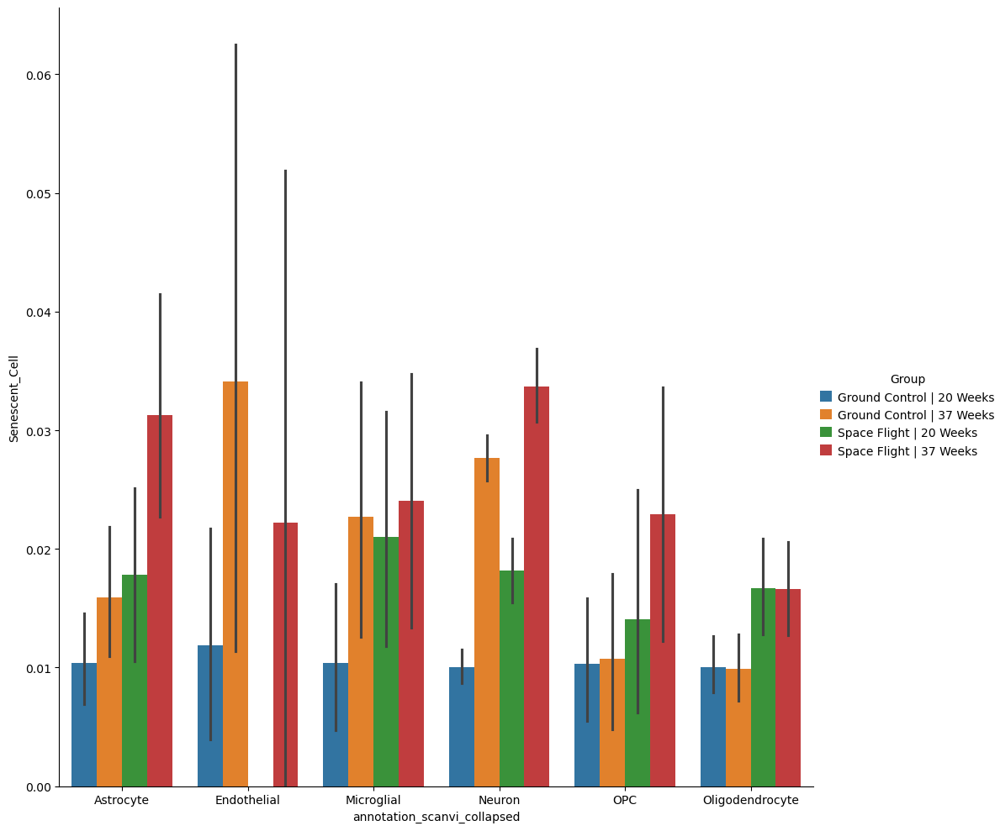

In [114]:
print("Percent Senescent: \n\n", round(self.rna.obs.groupby([
    col_celltype, col_batch]).apply(lambda x: x["Senescent_Cell"].astype(
        int).value_counts(normalize=True), include_groups=False) * 100,
    2).unstack(col_celltype))
sns.catplot(self.rna.obs, y="Senescent_Cell", x=col_celltype,
            hue=col_batch, kind="bar", height=10)

# SnC DEGs

## Overall

... storing 'Senescent_Cell_Label_senmayo' as categorical
... storing 'Senescent_Cell_Label_hierarchy_senmayo' as categorical
... storing 'Senescent_Cell_Label_senmayo_3' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo' as categorical
... storing 'SnC_hierarchy_senmayo' as categorical
... storing 'Senescent_Cell_Label' as categorical
... storing 'SnC_hierarchy' as categorical
... storing 'Senescent_Cell_Label_by_Type' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo_3' as categorical


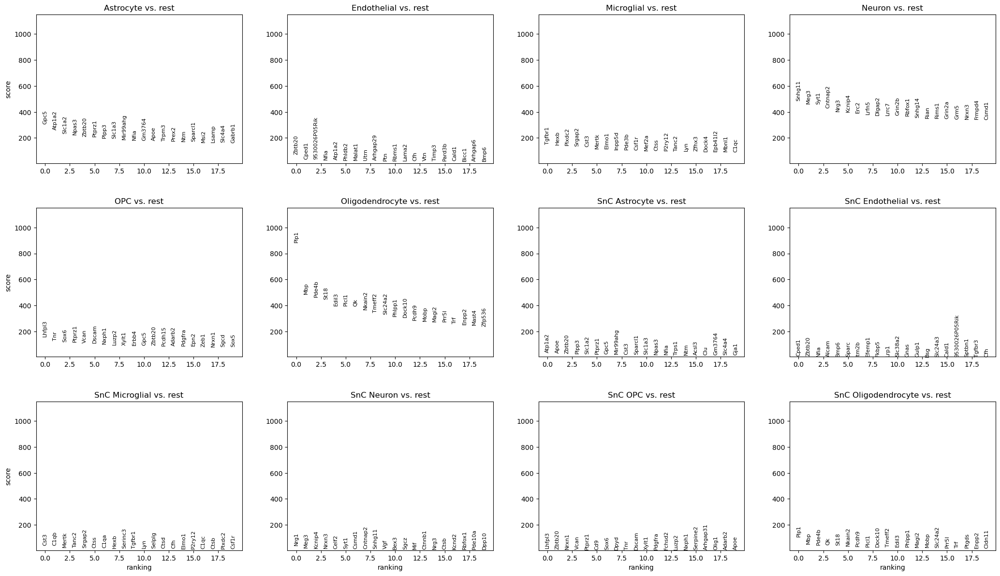

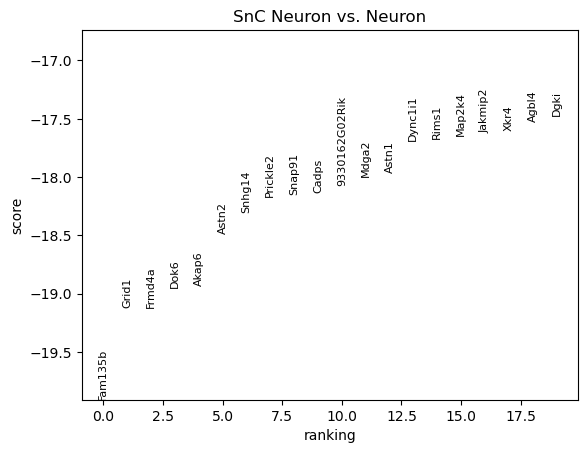

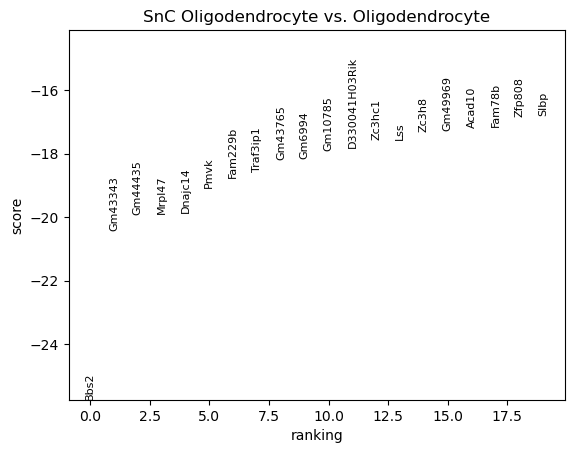

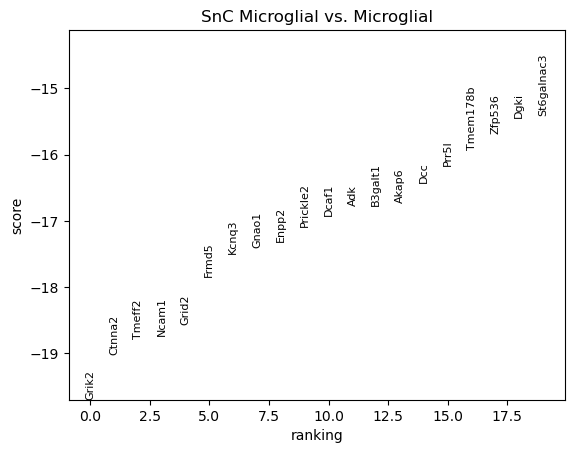

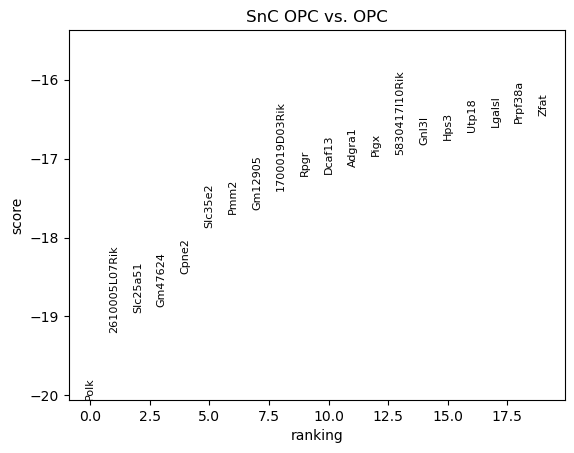

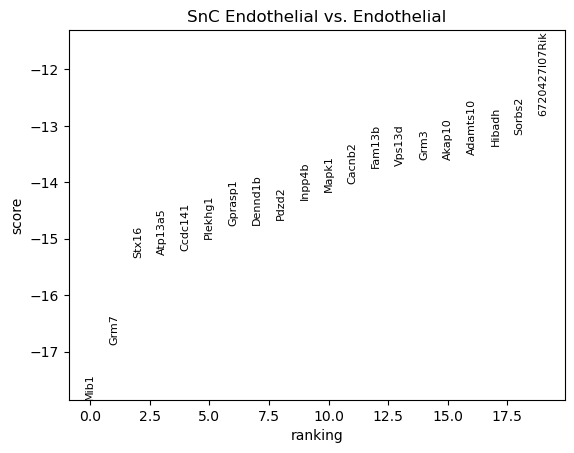

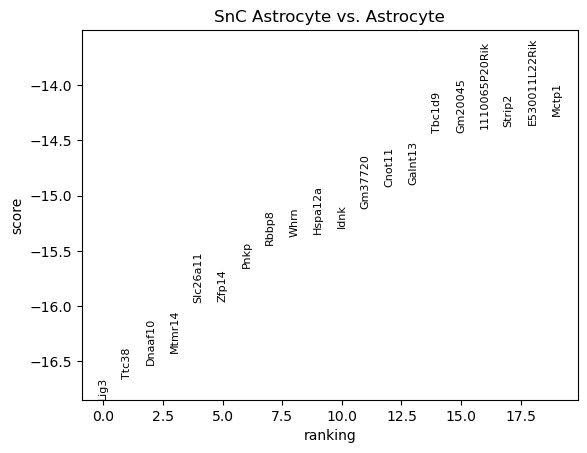

In [115]:
p_threshold = 1e-10
lfc_threshold = 1
self.find_markers(col_celltype="Senescent_Cell_Label_by_Type")
df_snc_markers = {}
df_snc_markers["All"] = self.get_markers_df(
    n_genes=50, col_celltype="Senescent_Cell_Label_by_Type",
    log2fc_threshold=1, p_threshold=1e-10)
# print(df_snc_markers["All"].loc[pd.unique([
#     i[0] for i in df_snc_markers["All"].index.values if (
#         "SnC" in i[0])])].groupby("Senescent_Cell_Label_by_Type").apply(
#             lambda x: x.head(3)))
for x in self.rna.obs[col_celltype].unique():
    df_snc_markers[x] = self.find_markers(
        col_celltype="Senescent_Cell_Label_by_Type",
        reference=x, groups=[x, f"SnC {x}"], rankby_abs=True,
        inplace=False).reset_index(0, drop=True).assign(**{
            col_celltype: f"SnC {x}"}).reset_index().set_index([
                col_celltype, "names"])
df_snc_markers = pd.concat(df_snc_markers, names=["Comparison"])
df_snc_markers = df_snc_markers.rename_axis([
    "Comparison", col_celltype, "names"]).rename({
        "logfoldchanges": "log_fc"}, axis=1).assign(
            log_fc_abs=df_snc_markers["logfoldchanges"].abs())
df_snc_markers_top = df_snc_markers[df_snc_markers.pvals_adj < p_threshold]
df_snc_markers_top = df_snc_markers_top[
    df_snc_markers.log_fc_abs >= lfc_threshold]
df_snc_markers_top = df_snc_markers_top.groupby([
    "Comparison", col_celltype]).apply(
        lambda x: x.assign(scores_abs=x.scores.abs()).sort_values(
            "scores_abs", ascending=False).head(20),
        include_groups=False).reset_index([0, 1], drop=True)

## By Group

### Find Snc versus Non-SnC DEGs by Group

In [116]:
res_rank_genes, p_threshold = {}, 1e-10

for x in self.rna.obs[col_condition].unique():
    res_rank_genes[x] = {}
    for c in self.rna.obs[self.rna.obs[col_condition] == x][
            col_celltype].unique():
        s_iter = (self.rna.obs[col_condition] == x) & (self.rna.obs[
            "Senescent_Cell_Label_by_Type"].isin([c, f"SnC {c}"]))
        all_pres = all([i in self.rna[s_iter].obs[
            "Senescent_Cell_Label_by_Type"].to_list()
                        for i in [c, f"SnC {c}"]])
        if all_pres is False:
            print(f"SnC not in {c} for {x}")
            continue
        tmp = sc.tl.rank_genes_groups(
            self.rna[s_iter], "Senescent_Cell_Label_by_Type", rankby_abs=True,
            layer="log1p", groups=[c, f"SnC {c}"], reference=c, copy=True)
        res_rank_genes[x][c] = sc.get.rank_genes_groups_df(
            tmp, f"SnC {c}", pval_cutoff=p_threshold)
    tmp = sc.tl.rank_genes_groups(
            self.rna[self.rna.obs[col_condition] == x],
            "Senescent_Cell_Label", rankby_abs=True,
            layer="log1p", reference="Non-Senescent", copy=True)
    res_rank_genes[x]["Overall"] = sc.get.rank_genes_groups_df(
            tmp, f"Senescent", pval_cutoff=p_threshold)
    res_rank_genes[x] = pd.concat(res_rank_genes[x], names=[col_celltype])
res_rank_genes = pd.concat(res_rank_genes, names=[col_condition])
res_rank_genes = res_rank_genes.assign(
    logfoldchanges_abs=res_rank_genes.logfoldchanges.abs())
res_rank_genes_top = res_rank_genes.reset_index().groupby([
    col_condition, col_celltype]).apply(
        lambda x: x.sort_values("logfoldchanges_abs").iloc[:20],
        include_groups=False).reset_index(2, drop=True).set_index(
            "names", append=True).rename_axis([
                col_condition, col_celltype, "variable"])
res_rank_genes_top

level_2     scores  logfoldchanges         pvals     pvals_adj  logfoldchanges_abs
Condition      annotation_scanvi_collapsed variable                                                                                              
Ground Control Astrocyte                   Fkbp5                   748  -7.991351       -3.415325  6.873683e-12  8.382152e-11            3.415325
                                           Snph                    552  -8.984821       -3.596056  1.598170e-13  2.217095e-12            3.596056
                                           Pvalb                   979  -6.919781      -24.001575  5.152000e-12  6.366062e-11           24.001575
                                           Ntpcr                   990  -6.883865      -24.064699  6.617118e-12  8.085583e-11           24.064699
                                           Rsl24d1                 994  -6.865911      -24.079687  7.495574e-12  9.112961e-11           24.079687
                                           Actn2                   928  -7.141886      -24.083574  1.066605e-12  1.390380e-11           24.083574
                                           Gm19265                 966  -6.961804      -24.085423  3.838209e-12  4.806503e-11           24.085423
                                           Gm42822                 930  -7.131566      -24.089016  1.148778e-12  1.494277e-11           24.089016
                                           Slitrk3                 992  -6.878207      -24.099020  6.882467e-12  8.384411e-11           24.099020
                                           Spdya                   983  -6.912596      -24.100521  5.417051e-12  6.666335e-11           24.100521
                                           Arl4c                   970  -6.944101      -24.101583  4.345845e-12  5.419762e-11           24.101583
                                           Dcaf12l1                967  -6.956543      -24.113735  3.982652e-12  4.982227e-11           24.113735
                                           Ninj1                   985  -6.907474      -24.121084  5.614125e-12  6.894829e-11           24.121084
                                           Stk11ip                 977  -6.923405      -24.122002  5.023198e-12  6.219614e-11           24.122002
                                           Lrrc73                  955  -7.023078      -24.126263  2.491166e-12  3.155564e-11           24.126263
                                           Pcdhb20                 995  -6.855328      -24.135624  8.065887e-12  9.796489e-11           24.135624
                                           Cdkl2                   949  -7.056170      -24.138172  1.969597e-12  2.510666e-11           24.138172
                                           Klf10                   978  -6.922809      -24.144497  5.044167e-12  6.239191e-11           24.144497
                                           Gm48602                 975  -6.927886      -24.151310  4.868259e-12  6.040136e-11           24.151310
                                           Nol6                    916  -7.188804      -24.166845  7.601842e-13  1.003924e-11           24.166845
               Endothelial                 Tmem33                  449  -7.173967      -27.138493  1.935661e-12  5.203488e-11           27.138493
                                           Cdk16                   448  -7.175985      -27.145483  1.909334e-12  5.144144e-11           27.145483
                                           Arl5a                   464  -7.109700      -27.155397  2.989195e-12  7.776406e-11           27.155397
                                           Atp5g3                  468  -7.101978      -27.156256  3.148742e-12  8.121607e-11           27.156256
                                           Rnft1                   457  -7.136885      -27.162230  2.488262e-12  6.572162e-11           27.162230
                                           Me2                     472  -7.077839      -27.165224  3.703378e-12  9.471409

### Figures by Batch (Cell Types in Same Figure)

In [117]:
for k in res_rank_genes_top.reset_index()[col_batch].unique():
    g_top_snc_sfold = dict(res_rank_genes_top.loc[k].groupby(
        col_celltype).apply(lambda x: x.loc[x.name].index.values))
    fig = self.plot(subset=self.rna.obs[col_batch] == k,
                    genes=g_top_snc_sfold, col_celltype=col_celltype,
                    kind=["heat"], figsize=(20, 20),
                    standard_scale="var", title=k, fontsize=20)

KeyError: 'Group'

#### Genes Grouped by Batch

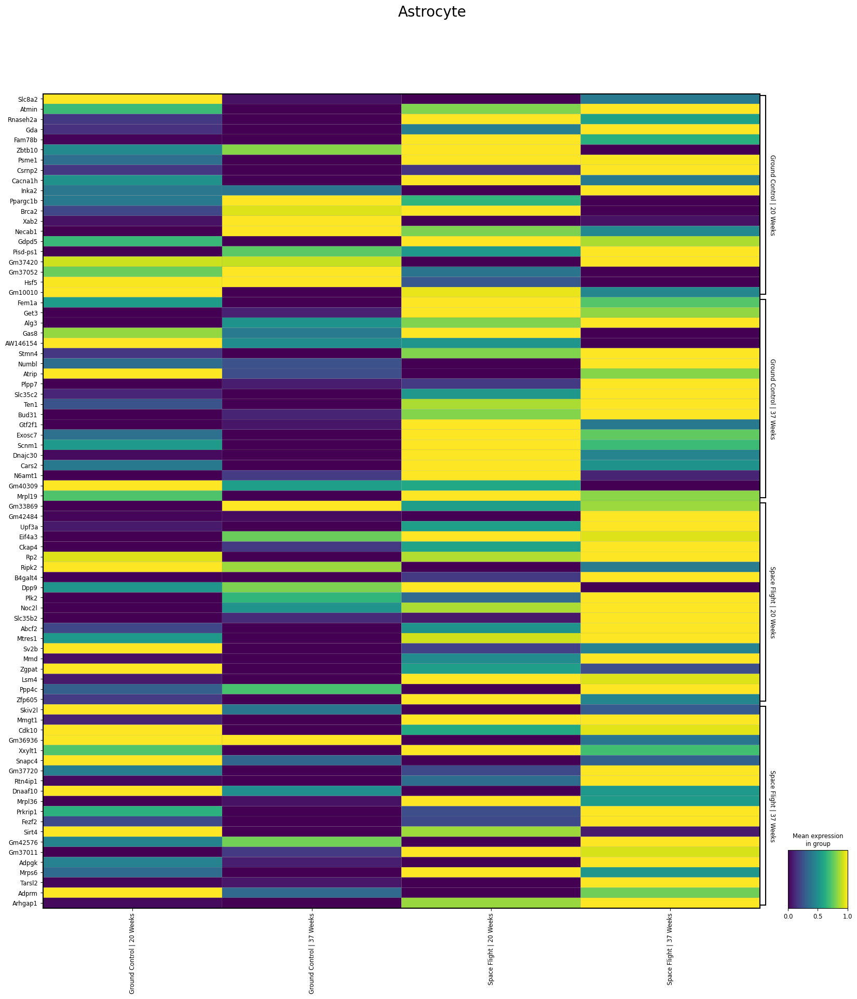

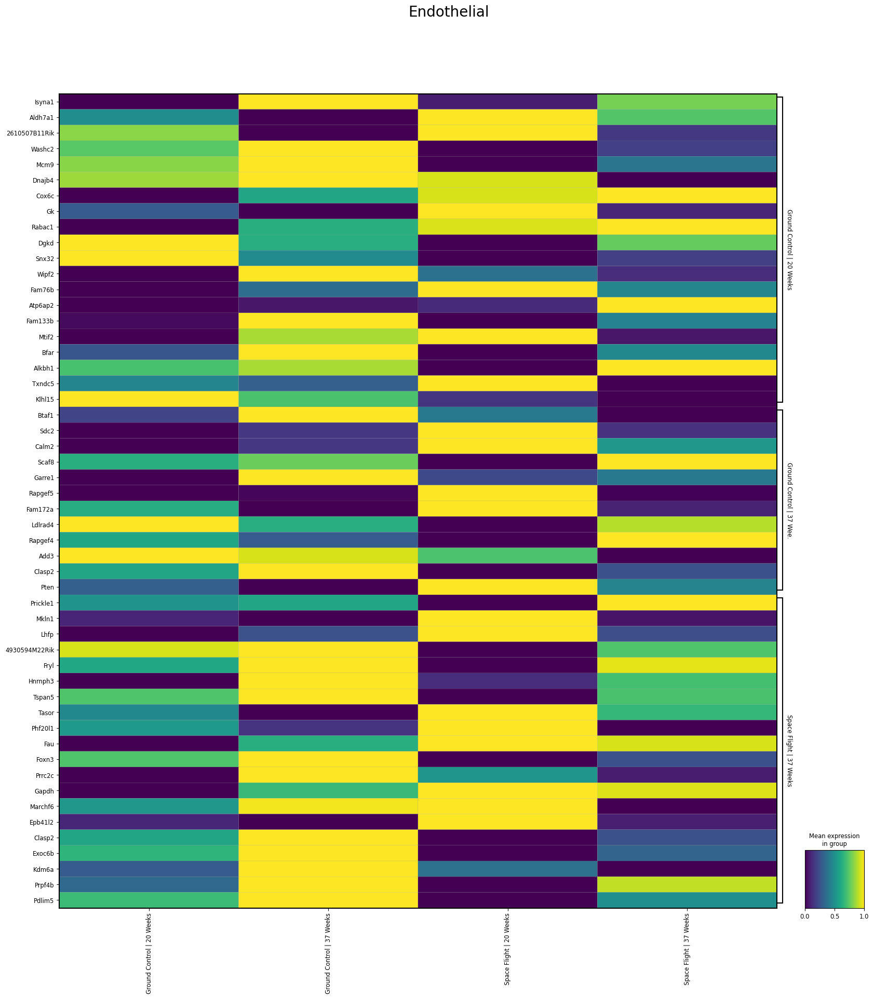

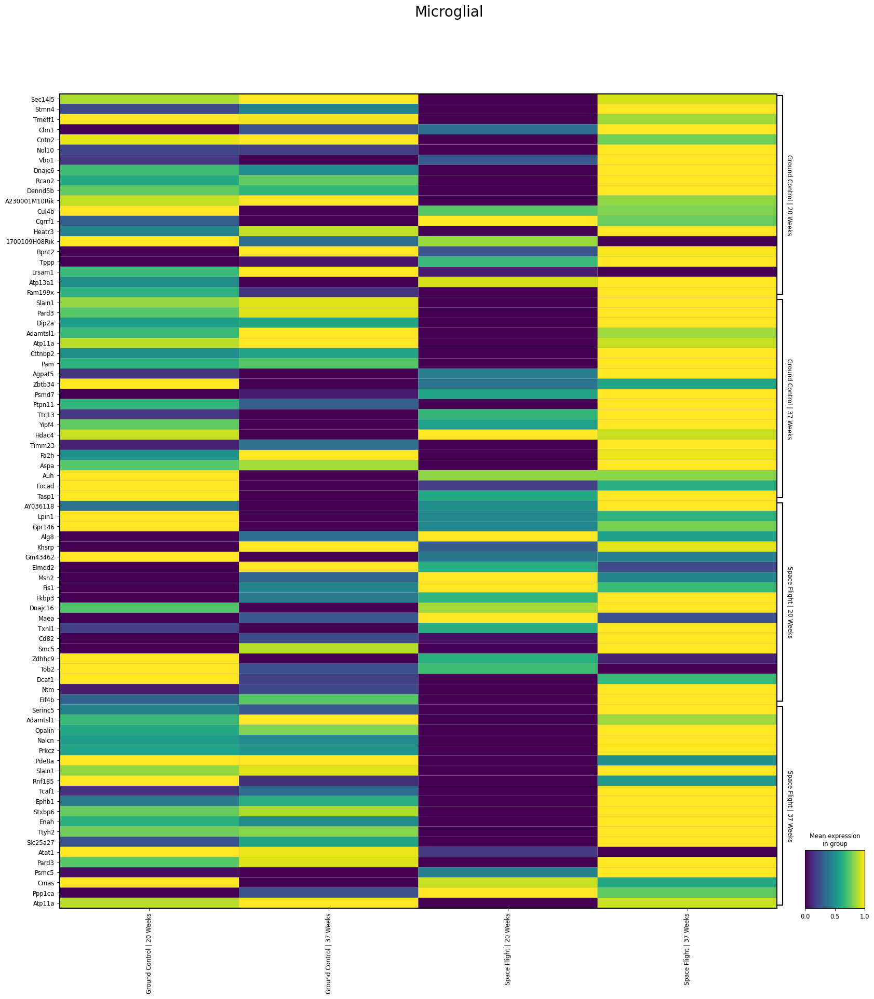

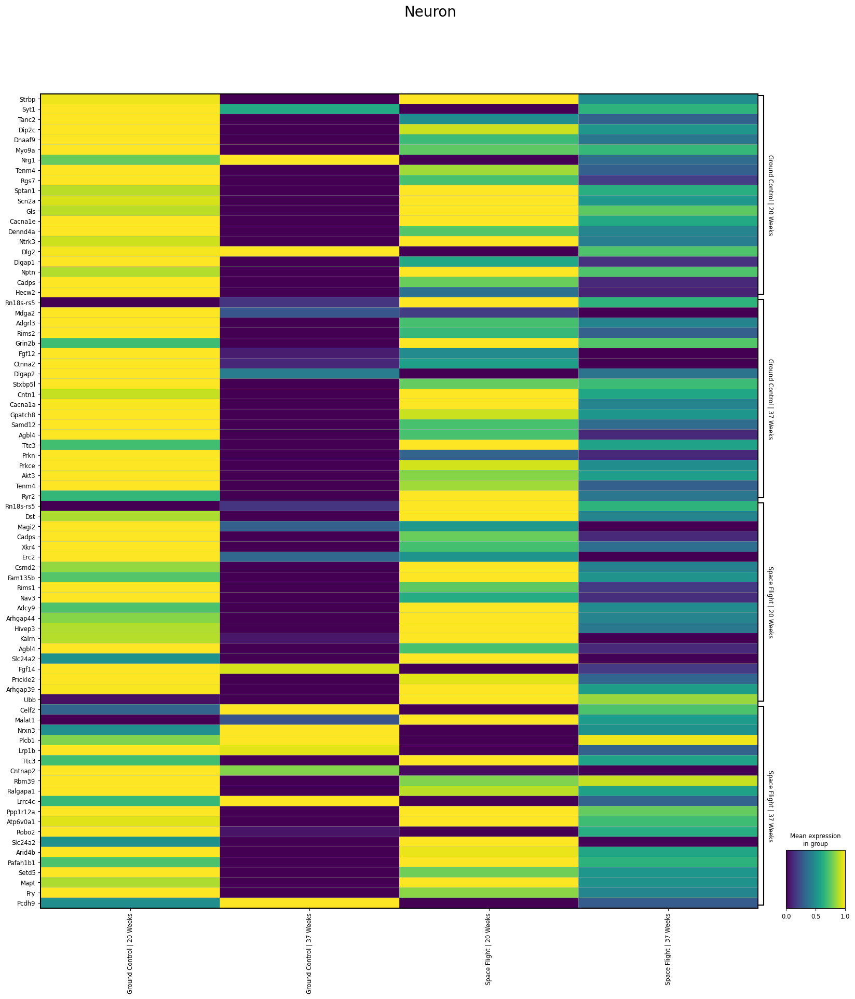

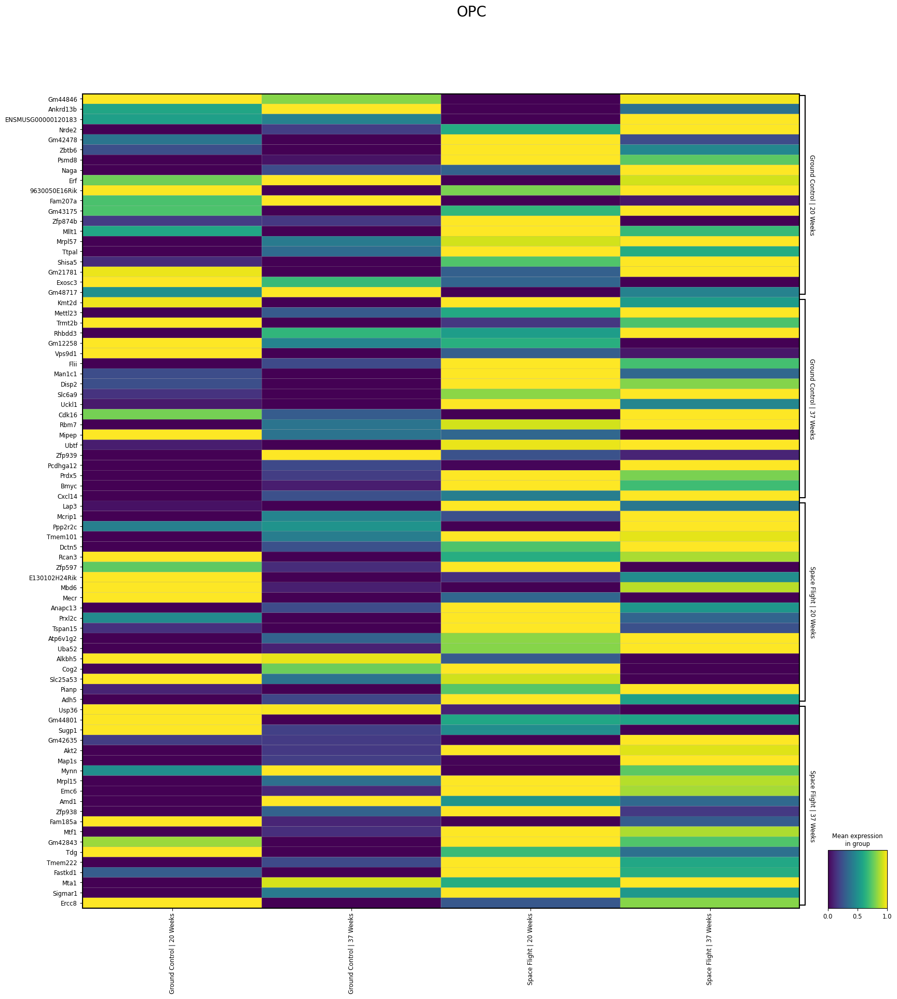

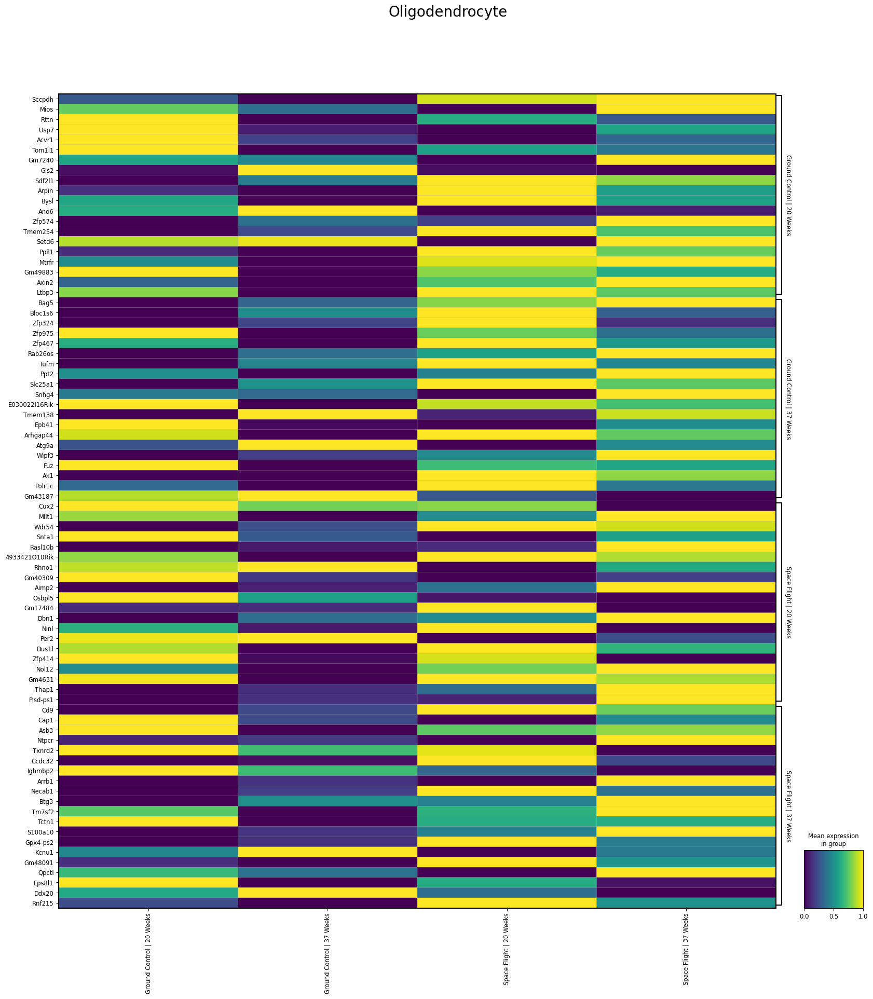

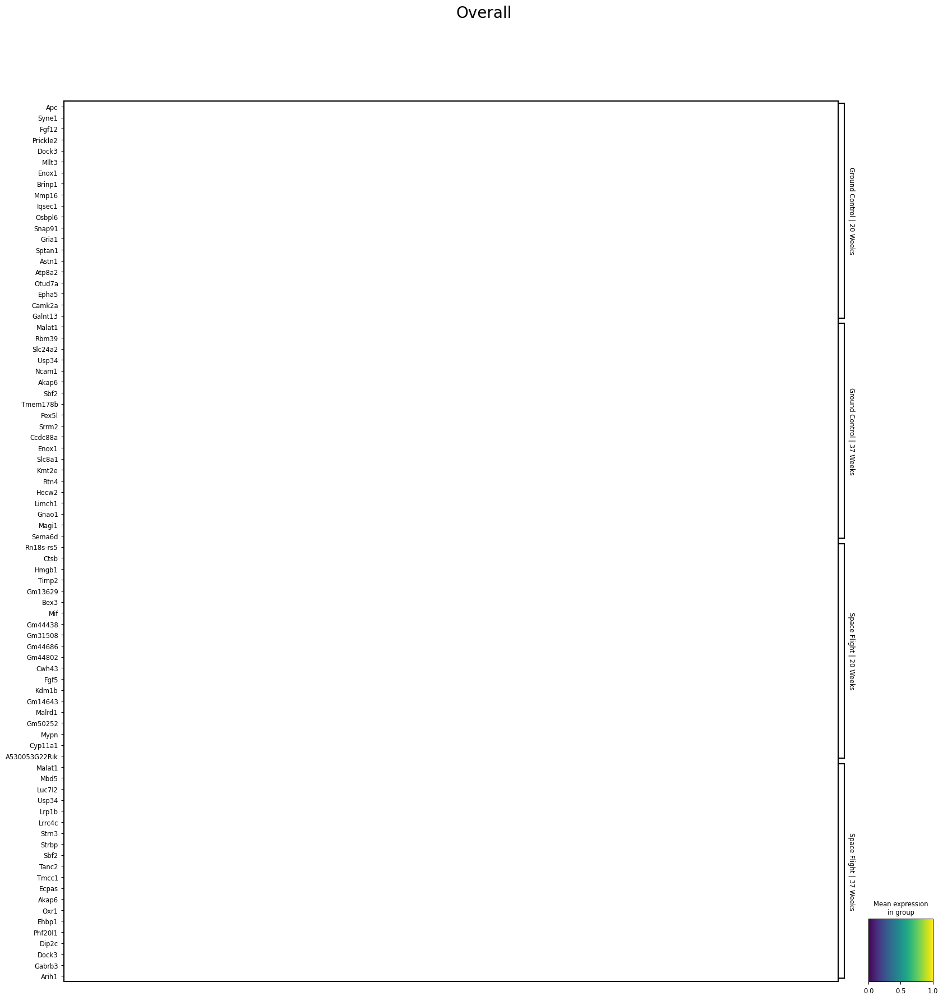

In [ ]:
for k in res_rank_genes_top.reset_index()[col_celltype].unique():
    g_top_snc_sfold = dict(res_rank_genes_top.loc[:, k, :].groupby(
        col_batch).apply(lambda x: x.loc[x.name].index.values))
    fig = self.plot(subset=self.rna.obs[col_celltype] == k,
                    genes=g_top_snc_sfold, col_celltype=col_batch,
                    kind="matrix", figsize=(20, 20),
                    swap_axes=True, title=k,
                    standard_scale="var", fontsize=20)

#### Not Grouped

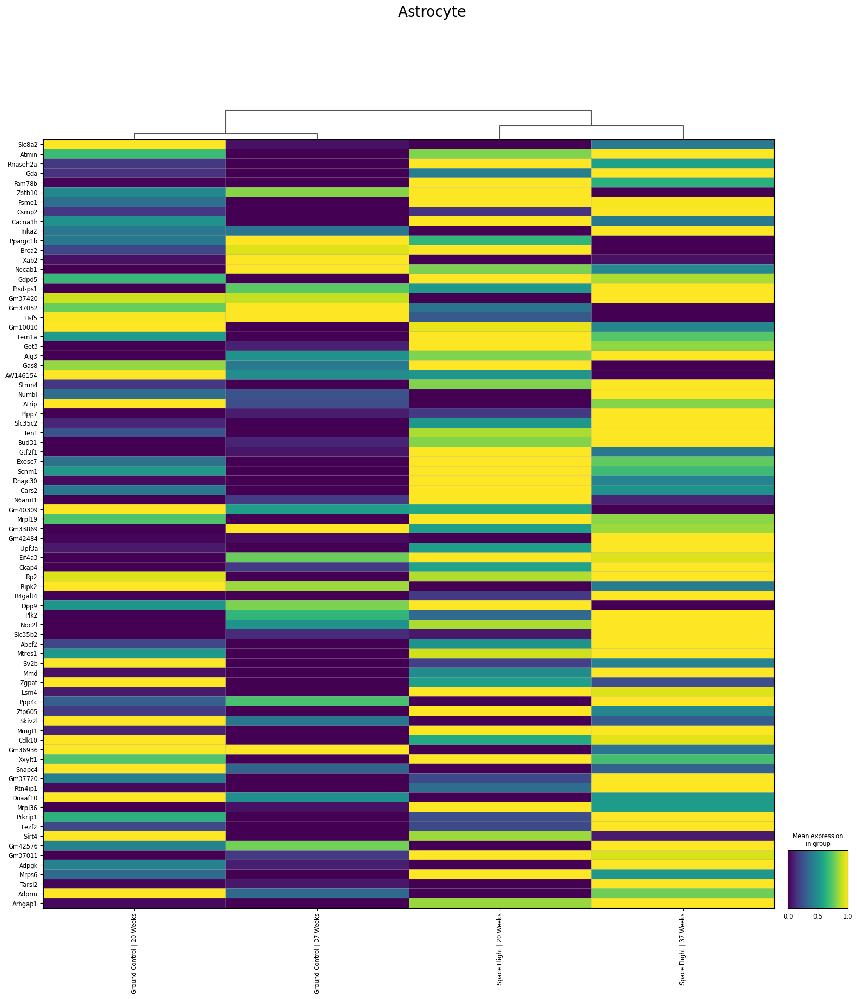

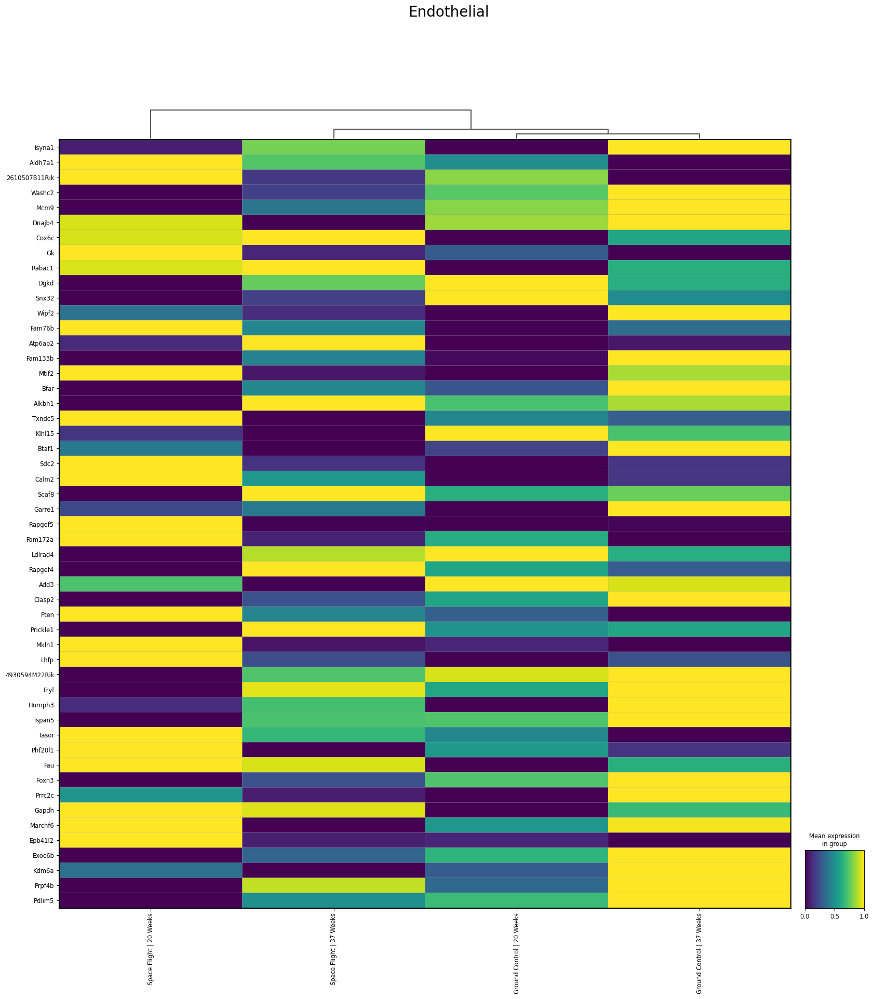

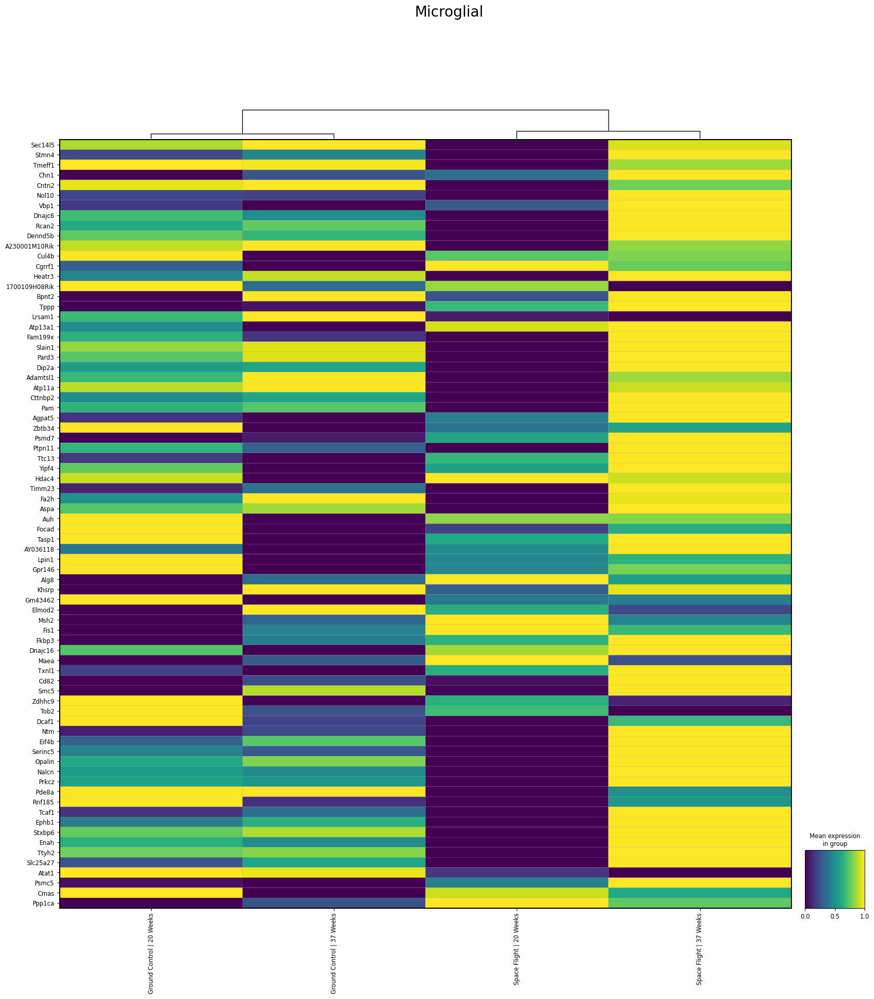

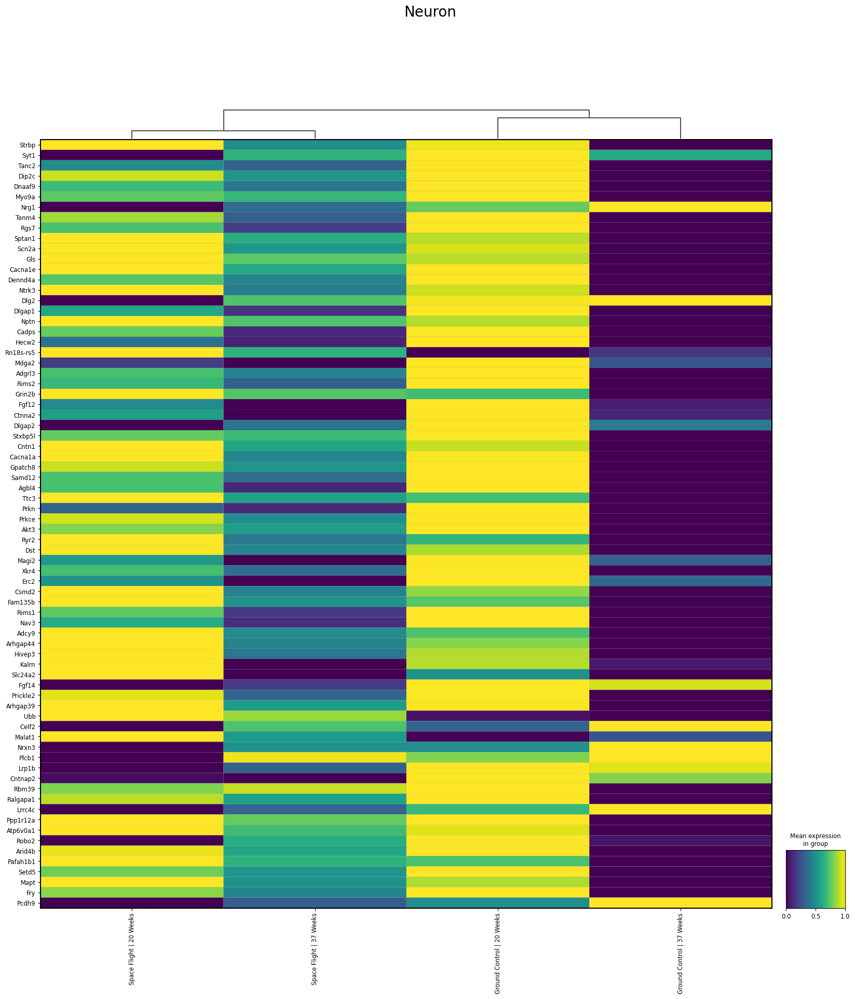

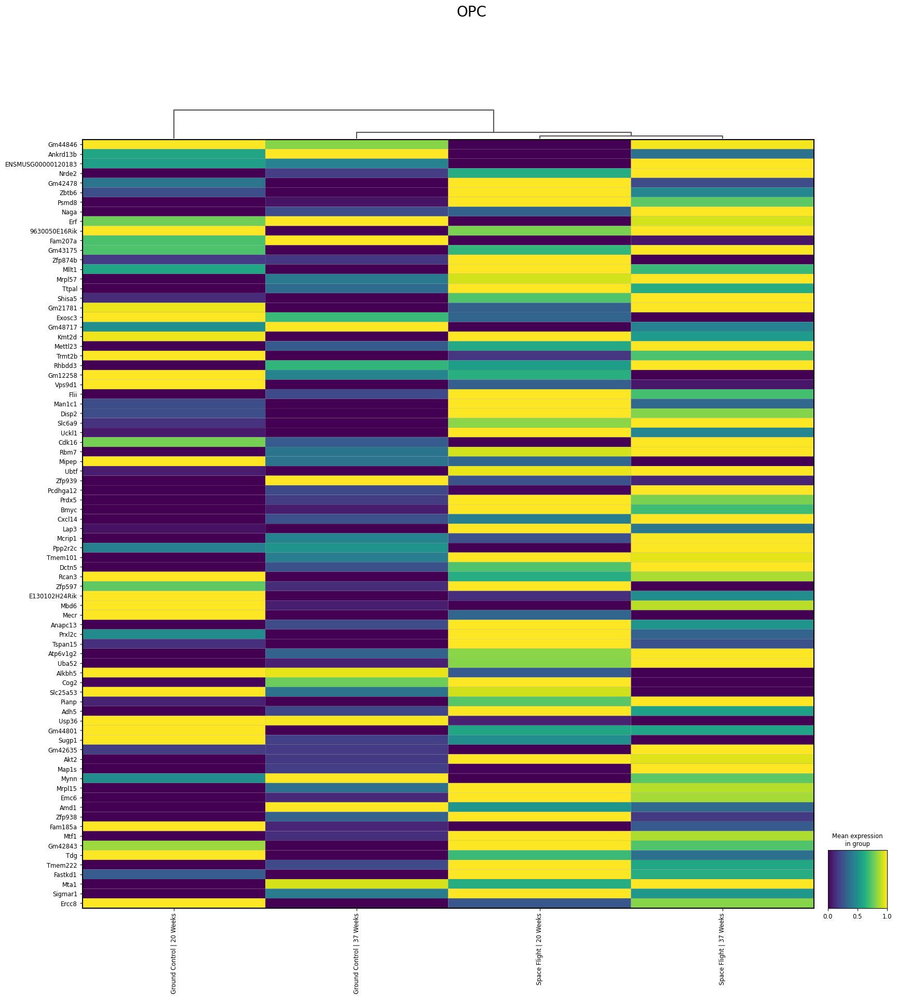

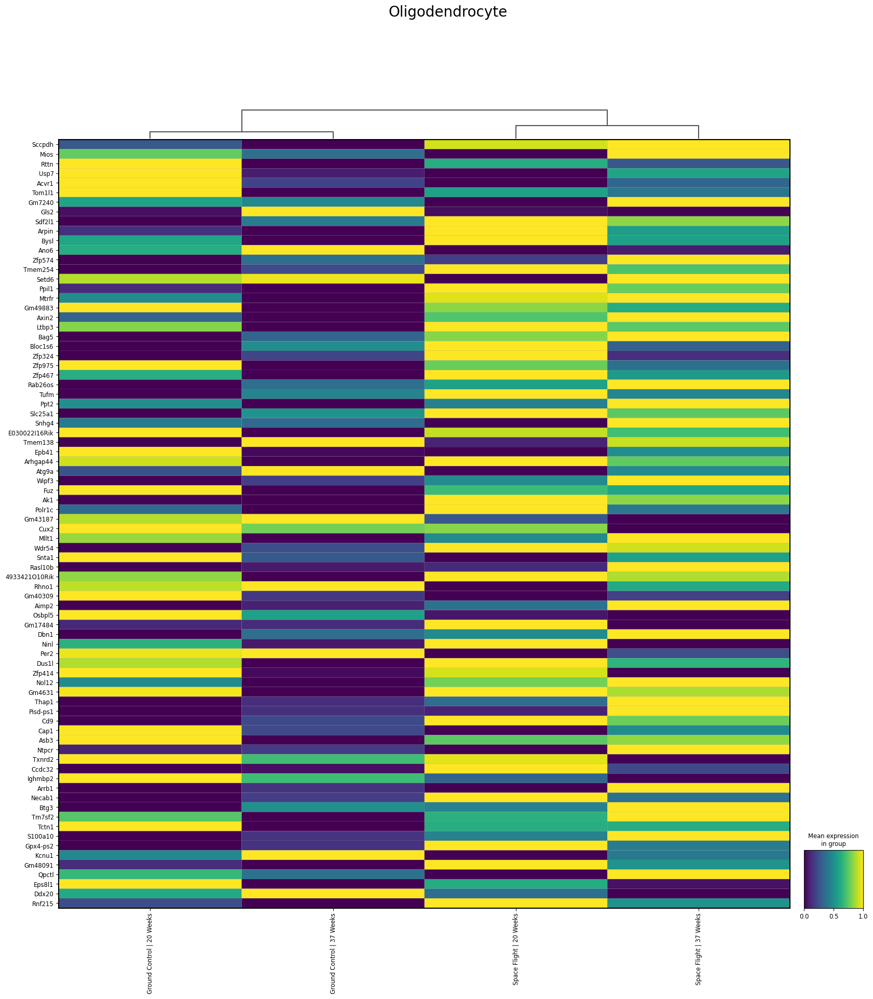

In [ ]:
for k in [i for i in res_rank_genes_top.reset_index()[col_celltype].unique(
        ) if i in self.rna.obs[col_celltype].unique()]:
    g_top_snc_sfold = list(res_rank_genes_top.loc[:, k, :].reset_index(
        ).variable.unique())
    fig = self.plot(subset=self.rna.obs[col_celltype] == k,
                    genes=g_top_snc_sfold, col_celltype=col_batch,
                    kind="matrix", figsize=(20, 20), swap_axes=True, title=k,
                    dendrogram=True, standard_scale="var", fontsize=20)

# Plot

## Comparison

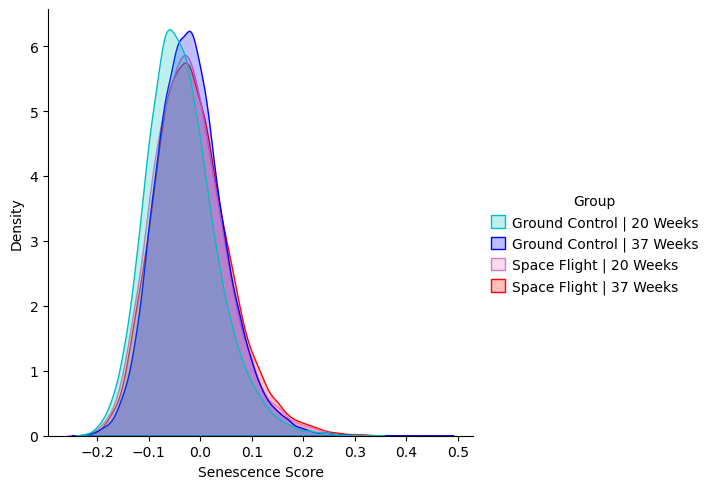

In [118]:
scores = self.rna.obs[[col_batch] + [
    f"score_{x}" for x in sen_metrics]].set_index(
        col_batch, append=True)
scores = scores.rename_axis("Metric", axis=1).stack().to_frame(
    "Senescence Score").reset_index()
sns.displot(scores, kind="kde", cut=0, fill=True, common_norm=False,
            x="Senescence Score", hue=col_batch, palette=palette[col_batch])

## Scores

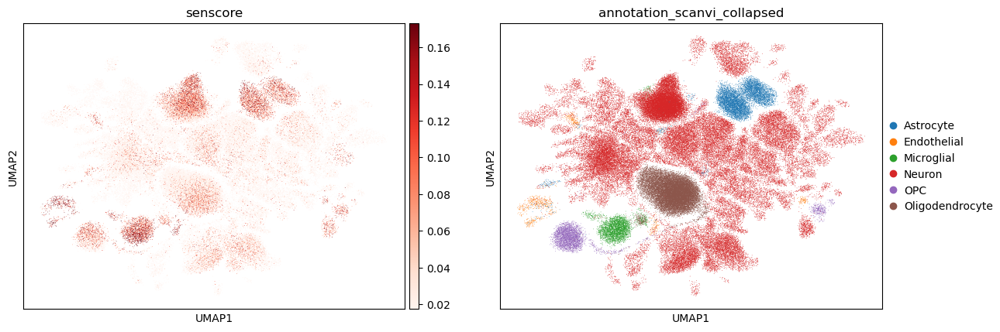

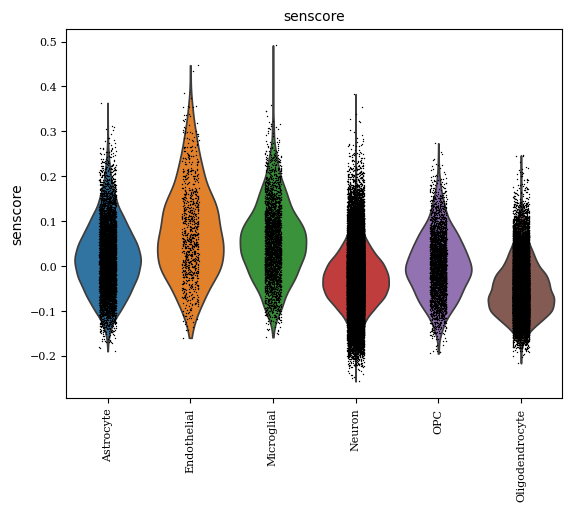

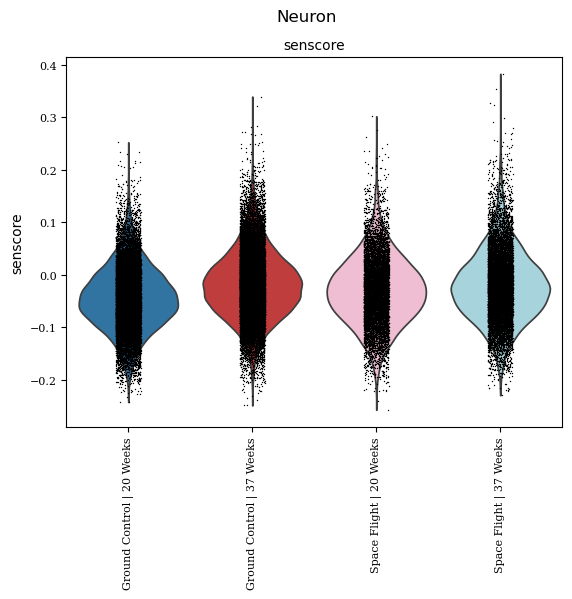

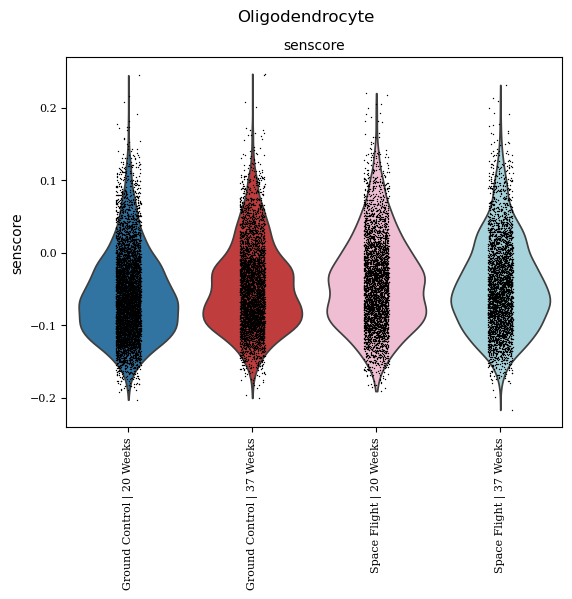

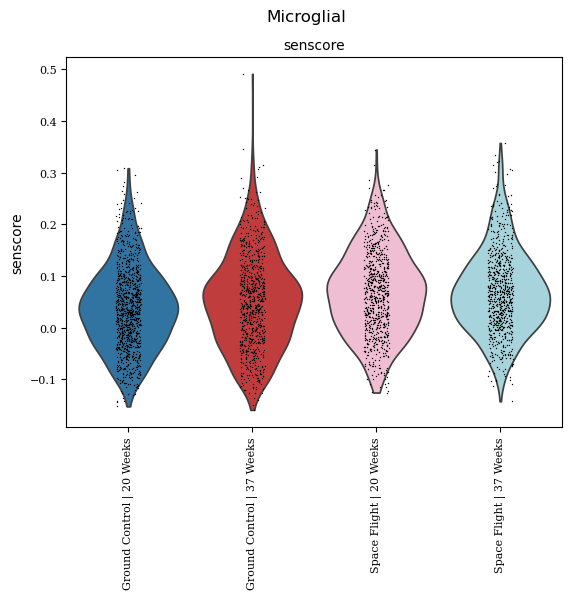

...

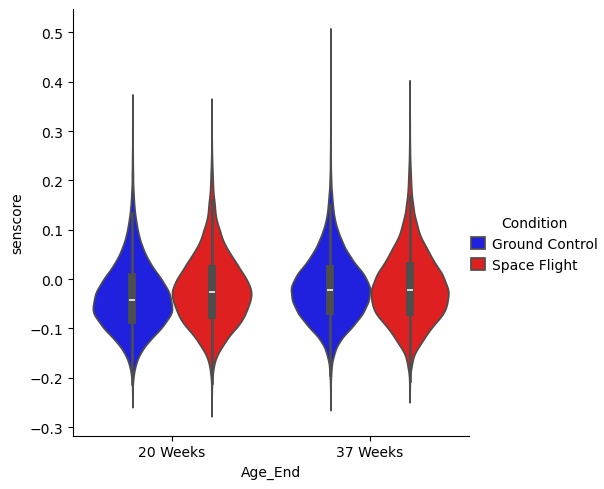

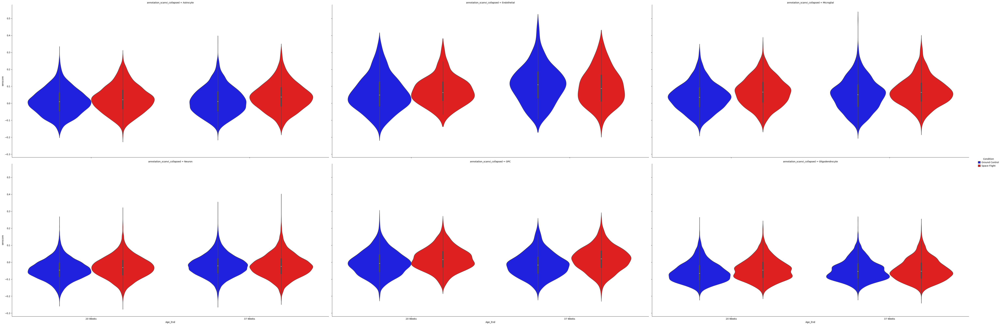

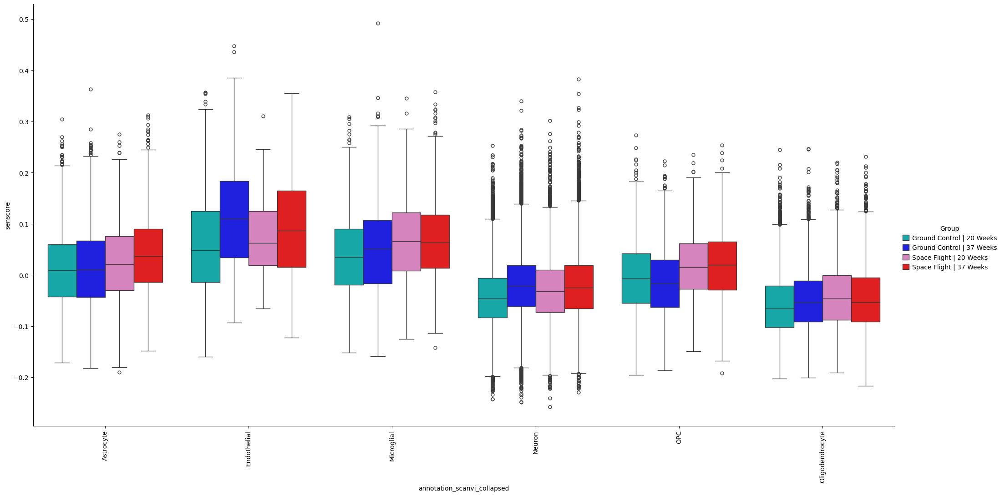

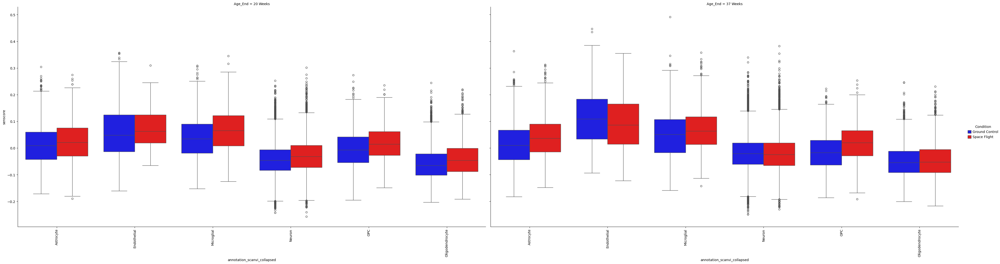

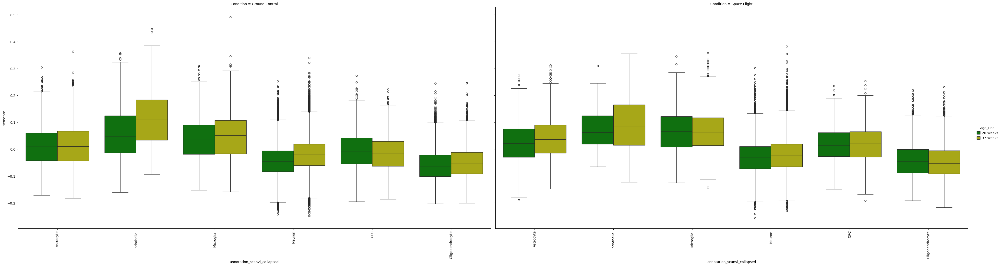

In [131]:
# UMAP with Senescence Scores
bnds = self.rna.obs["senscore"].describe(percentiles=[0.75, 0.99])
_ = self.plot(kind="umap", color=["senscore", col_celltype], umap=dict(
    palette=None, color_map="Reds", vmin=bnds["75%"], vmax=bnds["99%"]))

# Violin Plot of Senescence Scores
_ = self.plot(kind="violin", genes=["senscore"], common_norm=False,
              col_celltype=col_celltype, rotation=90)
_ = self.plot(kind="violin", genes=["senscore"], common_norm=False,
              by_group=col_celltype, col_wrap=1,
              col_celltype=col_batch, rotation=90)

# KDEs
fig_sen_kde = {}
for x in [col_age, col_condition, col_batch]:
    fig_sen_kde[x] = sns.displot(self.rna.obs, hue=x, x="senscore",
                                 palette=palette[x], kind="kde",
                                 cut=0, common_norm=False, fill=True)

# Overall (All Cell Types)
fig_sen_overall = sns.catplot(self.rna.obs, x=col_condition,
                              hue=col_age, y="senscore",
                              palette=palette[col_age],
                              kind="violin")
fig_sen_overall_2 = sns.catplot(self.rna.obs, x=col_age, hue=col_condition,
                                palette=palette[col_condition],
                                y="senscore", kind="violin")

# By Cell Type
fig_sen_rc = sns.catplot(self.rna.obs, col=col_celltype, y="senscore",
                         palette=palette[col_condition],
                         hue=col_condition, x=col_age, kind="violin",
                         height=10, aspect=2, col_wrap=3)
fig_sen = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                      palette=palette[col_batch],
                      hue=col_batch, kind="box", height=10, aspect=2)
for a in fig_sen.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)
fig_sen_2 = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                        col=col_age, hue=col_condition,
                        palette=palette[col_condition],
                        kind="box", height=10, aspect=2)
for a in fig_sen_2.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)
fig_sen_3 = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                        col=col_condition, hue=col_age,
                        palette=palette[col_age],
                        kind="box", height=10, aspect=2)
for a in fig_sen_3.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)

## Burden 

Group by sample and cell type and get percentage of senescent cells



                 min  25%  50%  75%   max
Condition                               
Ground Control  0.0  0.4  1.0  2.0   6.2
Space Flight    0.0  0.9  1.8  2.3  11.1


           min  25%  50%  75%   max
Age_End                           
20 Weeks  0.0  0.5  1.2  2.0   5.0
37 Weeks  0.0  0.5  1.6  3.2  11.1


                          min  25%  50%  75%   max
Condition      Age_End                           
Ground Control 20 Weeks  0.0  0.4  0.8  1.7   5.0
               37 Weeks  0.0  0.4  1.5  3.2   6.2
Space Flight   20 Weeks  0.0  0.8  1.6  2.1   3.3
               37 Weeks  0.0  0.9  1.9  2.9  11.1


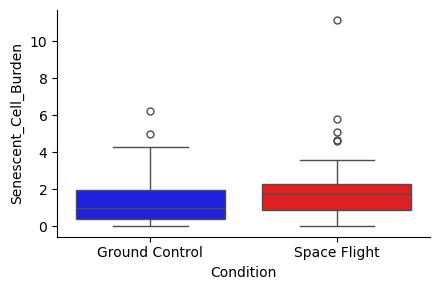

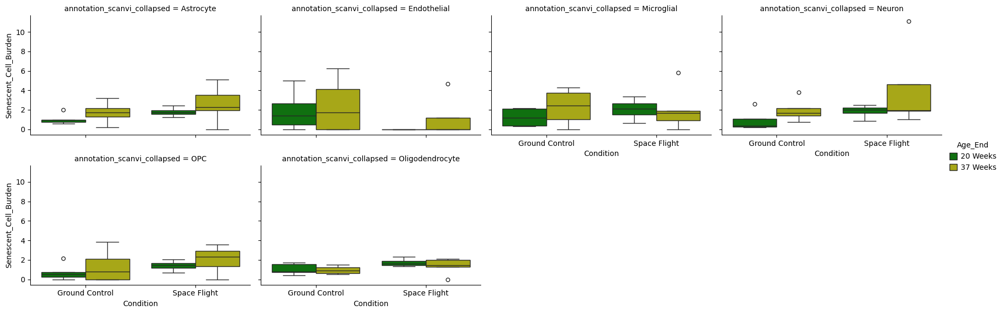

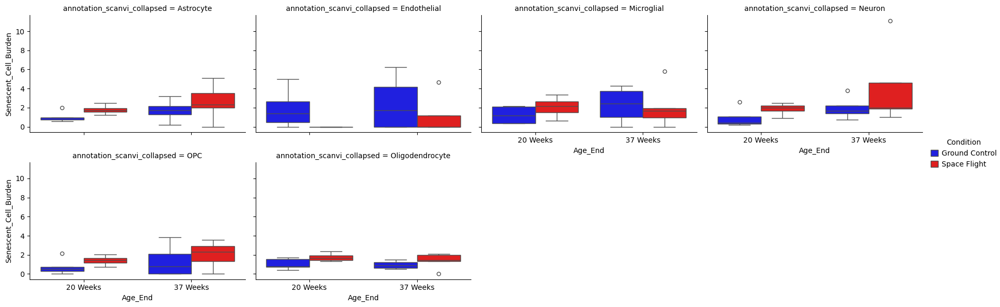

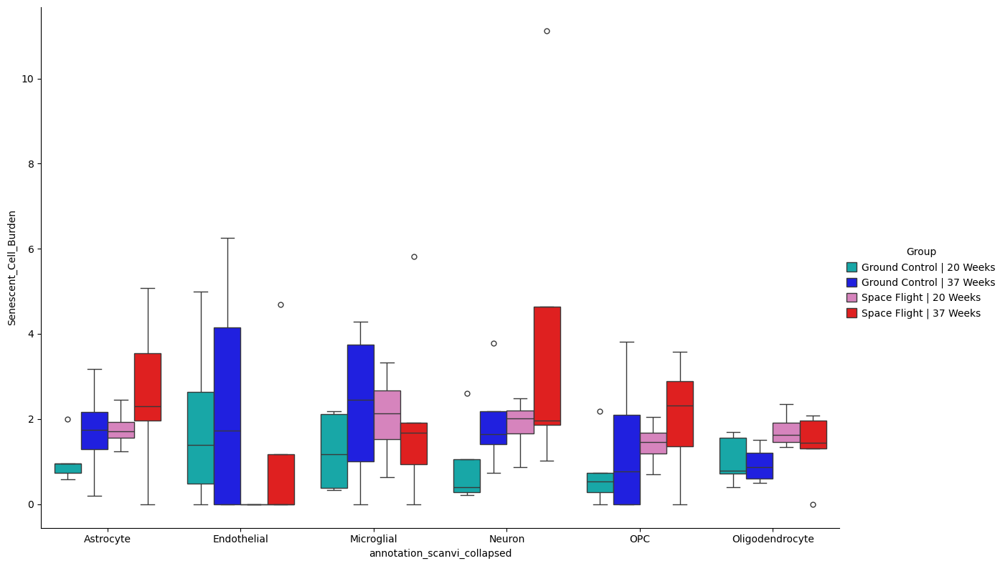

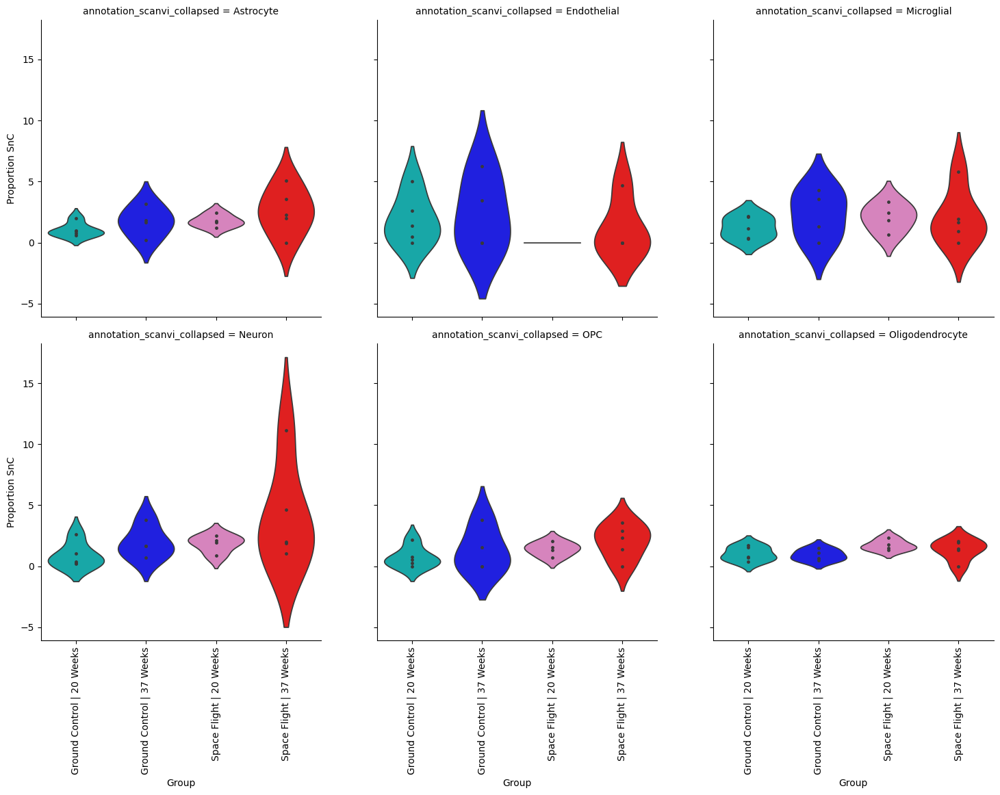

In [207]:
grps = [col_sample, col_celltype, col_age, col_condition, col_batch]
dff = self.rna.obs[grps + ["Senescent_Cell"]].groupby(grps).apply(
    lambda x: x["Senescent_Cell"].mean(), include_groups=False
    ).to_frame("Senescent_Cell_Burden") * 100
# kws_plot = dict(kind="violin", split=False, , common_norm=True)
kws_plot = dict(kind="box", errorbar=("ci", 95))

sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            palette=palette[col_condition],
            hue=col_condition, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            col=col_celltype, col_wrap=4,
            palette=palette[col_age],
            hue=col_age, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", hue=col_condition, **kws_plot,
            col=col_celltype, col_wrap=4,
            palette=palette[col_condition],
            x=col_age, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", x=col_celltype, **kws_plot,
            palette=palette[col_batch],
            hue=col_batch, data=dff, height=8, aspect=1.5)

props_snc = self.rna.obs.groupby([col_celltype, col_batch, col_sample]).apply(
    lambda x: 100 * np.mean(x["Senescent_Cell"]), include_groups=False)
fig = sns.catplot(data=props_snc.to_frame("Proportion SnC"),
                  y="Proportion SnC", hue=col_batch, x=col_batch,
                  col=col_celltype, col_wrap=3, kind="violin",
                  palette=palette[col_batch], inner="point",
                  common_norm=False)
for a in fig.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)

# props_snc = self.rna.obs.groupby([
#     col_celltype, col_batch, col_sample]).apply(
#         lambda x: 100 * np.mean(x[f"Senescent_Cell_{use_metric}_{p_h}"]),
#         include_groups=False)
# fig = sns.catplot(data=props_snc.to_frame("Proportion SnC"),
#                   y="Proportion SnC", hue=col_batch, x=col_batch,
#                   col=col_celltype, col_wrap=3, kind="violin",
#                   palette=palette[col_batch], inner="point",
#                   common_norm=False)
# for a in fig.axes.flatten():
#     a.tick_params(axis="x", labelrotation=90)

for x in [col_condition, col_age, [col_condition, col_age]]:
    print("\n\n", round(dff["Senescent_Cell_Burden"].groupby(x).describe()[[
        "min", "25%", "50%", "75%", "max"]], 1))

# Analyze

## Regressions & ANOVAs & MEMs

In [125]:
r_dff = polars.DataFrame(dff.reset_index())  # pymer-compatible aggregated df
r_rna = polars.DataFrame(self.rna.obs.rename({
    col_celltype: "CT_"}, axis=1).copy())  # pymer-compatible cell-level df
lvls = ["key_control", "key_treatment"]
factors = {col_condition: [keys[col_condition][i] for i in lvls],
           col_age: [keys[col_age][i] for i in lvls]}

### Scores

##### Cell Type Random Effects

In [126]:
# # Age + Condition
# model_ca_mlm = lmer(f"senscore ~ {col_condition} + {col_age} +"
#                     f"(1 | {col_sample})", data=r_rna)  # set up model
# model_ca_mlm.set_factors(factors)
# model_ca_mlm.set_transforms({"senscore": "zscore"})
# model_ca_mlm.anova(summary=True).show()

# # Age * Condition
# model_ca_mlm_i = lmer(
#     f"senscore ~ {col_condition} * {col_age} + "
#     f"(1 | {col_sample})", data=r_rna)  # set up model
# model_ca_mlm_i.set_factors(factors)
# model_ca_mlm_i.set_transforms({"senscore": "zscore"})
# model_ca_mlm_i.anova(summary=True).show()

# # Age * Condition (Condition as Random Effect)
# model_ca_mlm_ii = lmer(
#     f"senscore ~ {col_condition} * {col_age} + "
#     f"(1 | {col_sample}) + (1 + {col_condition} | CT_)",
#     data=r_rna)  # set up model
# model_ca_mlm_ii.set_factors(factors)
# model_ca_mlm_ii.set_transforms({"senscore": "zscore"})
# model_ca_mlm_ii.anova(summary=True).show()

# Age * Condition (Age and Condition as Random Effect)
model_ca_mlm_iii = lmer(
    f"senscore ~ {col_condition} * {col_age} + (1 | {col_sample})"
    f" + (1 + {col_condition} + {col_age} | CT_)",
    data=r_rna)  # set up model
model_ca_mlm_iii.set_factors(factors)
model_ca_mlm_iii.set_transforms({"senscore": "zscore"})
model_ca_mlm_iii.anova(summary=True).show()

# Model Comparison
# compare(model_ca_mlm, model_ca_mlm_i, model_ca_mlm_i,
#         model_ca_mlm_ii, model_ca_mlm_iii).show()

# GLM Version of Results
# model_ca_mlm.summary().show()
# model_ca_mlm_i.summary().show()
# model_ca_mlm_ii.summary().show()
model_ca_mlm_iii.summary().show()

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Condition 
 1.000 
 inf 
 5.960 
 5.960 
 0.01463 
 * 
 
 
 Age_End 
 1.000 
 inf 
 2.150 
 2.150 
 0.1426 
 
 
 
 Condition:Age_End 
 1.000 
 inf 
 0.349 
 0.349 
 0.5549 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Condition*Age_End+(1|sample)+(1+Condition+Age_End|CT_)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -137950 
AIC: 275925 | BIC: 276040 
Residual error: 0.919 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.159 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 (Intercept) 
 0.636 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 ConditionSpace Flight 
 0.148 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 Age_End37 Weeks 
 0.256 
 
 
 
 
 
 
 
 
 
 CT_-cor 
 (Intercept) 
 0.042 
 
 
 
 
 
 
 
 
 
 CT_-cor 
 (Intercept) 
 0.564 
 
 
 
 
 
 
 
 
 
 CT_-cor 
 ConditionSpace Flight 
 −0.793 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.919 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.330 
 0.269 
 −0.336 
 0.995 
 1.224 
 5.769 
 0.2687 
 
 
 
 
 ConditionSpace Flight 
 0.283 
 0.123 
 0.023 
 0.542 
 2.290 
 17.931 
 0.03436 
 * 
 
 
 
 Age_End37 Weeks 
 0.235 
 0.150 
 −0.087 
 0.557 
 1.565 
 14.053 
 0.1399 
 
 
 
 
 ConditionSpace Flight:Age_End37 Weeks 
 −0.089 
 0.152 
 −0.415 
 0.236 
 −0.590 
 13.918 
 0.5644 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

#### Cell Type as Moderator

In [127]:
# Age + Condition * Cell Type
model_cac_mlm_i2 = lmer(
    f"senscore ~  Aged + Spaceflight * CT_ + "
    f"(1 | {col_sample})", data=r_rna)  # set up model
model_cac_mlm_i2.set_transforms({"senscore": "zscore"})
model_cac_mlm_i2.anova(summary=True).show()

# Age * Condition * Cell Type
model_cac_mlm_i2b = lmer(
    f"senscore ~  Aged * Spaceflight + Spaceflight * CT_ + "
    f"(1 | {col_sample})", data=r_rna)  # set up model
model_cac_mlm_i2b.set_transforms({"senscore": "zscore"})
model_cac_mlm_i2b.anova(summary=True).show()

# Age * Condition * Cell Type
model_cac_mlm_i3 = lmer(
    f"senscore ~  Aged * Spaceflight * CT_ + "
    f"(1 | {col_sample})", data=r_rna)  # set up model
model_cac_mlm_i3.set_transforms({"senscore": "zscore"})
model_cac_mlm_i3.anova(summary=True).show()

# GLM Version of Results
model_cac_mlm_i2.summary().show()
model_cac_mlm_i2b.summary().show()
model_cac_mlm_i3.summary().show()

# Model Comparison
compare(model_cac_mlm_i2, model_cac_mlm_i2b, model_cac_mlm_i3).show()

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 5.640 
 5.640 
 0.01755 
 * 
 
 
 Spaceflight 
 1.000 
 inf 
 11.454 
 11.454 
 <.001 
 *** 
 
 
 CT_ 
 5.000 
 inf 
 2,746.320 
 13,731.600 
 
 *** 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 29.008 
 145.040 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 5.415 
 5.415 
 0.01996 
 * 
 
 
 Spaceflight 
 1.000 
 inf 
 11.021 
 11.021 
 <.001 
 *** 
 
 
 CT_ 
 5.000 
 inf 
 2,746.334 
 13,731.670 
 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.408 
 0.408 
 0.5228 
 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 28.996 
 144.980 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 5.981 
 5.981 
 0.01446 
 * 
 
 
 Spaceflight 
 1.000 
 inf 
 9.339 
 9.339 
 0.002243 
 ** 
 
 
 CT_ 
 5.000 
 inf 
 2,669.438 
 13,347.190 
 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.130 
 0.130 
 0.7185 
 
 
 
 Aged:CT_ 
 5.000 
 inf 
 37.304 
 186.520 
 <.001 
 *** 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 34.950 
 174.750 
 <.001 
 *** 
 
 
 Aged:Spaceflight:CT_ 
 5.000 
 inf 
 18.125 
 90.625 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Aged+Spaceflight*CT_+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138067 
AIC: 276164 | BIC: 276307 
Residual error: 0.921 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.157 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.921 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.439 
 0.064 
 0.304 
 0.574 
 6.898 
 16.211 
 <.001 
 *** 
 
 
 
 Aged 
 0.178 
 0.075 
 0.018 
 0.338 
 2.375 
 14.933 
 0.03139 
 * 
 
 
 
 Spaceflight 
 0.309 
 0.078 
 0.145 
 0.473 
 3.954 
 17.619 
 <.001 
 *** 
 
 
 
 CT_Endothelial 
 0.886 
 0.038 
 0.812 
 0.960 
 23.426 
 103,248.906 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 0.450 
 0.025 
 0.400 
 0.499 
 17.750 
 103,246.539 
 <.001 
 *** 
 
 
 
 CT_Neuron 
 −0.675 
 0.014 
 −0.703 
 −0.647 
 −47.191 
 103,253.259 
 
 *** 
 
 
 
 CT_OPC 
 −0.292 
 0.024 
 −0.338 
 −0.245 
 −12.372 
 103,249.458 
 <.001 
 *** 
 
 
 
 CT_Oligodendrocyte 
 −0.921 
 0.016 
 −0.952 
 −0.889 
 −56.980 
 103,248.648 
 
 *** 
 
 
 
 Spaceflight:CT_Endothelial 
 −0.105 
 0.079 
 −0.260 
 0.050 
 −1.326 
 103,251.597 
 0.185 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.054 
 0.039 
 −0.023 
 0.131 
 1.382 
 103,246.538 
 0.1669 
 
 
 
 
 Spaceflight:CT_Neuron 
 −0.177 
 0.024 
 −0.224 
 −0.130 
 −7.342 
 103,255.169 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_OPC 
 0.078 
 0.039 
 0.000 
 0.155 
 1.971 
 103,249.550 
 0.04874 
 * 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 −0.154 
 0.027 
 −0.206 
 −0.102 
 −5.786 
 103,248.885 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Aged*Spaceflight+Spaceflight*CT_+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138068 
AIC: 276168 | BIC: 276320 
Residual error: 0.921 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.161 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.921 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.417 
 0.073 
 0.261 
 0.573 
 5.700 
 14.781 
 <.001 
 *** 
 
 
 
 Aged 
 0.227 
 0.108 
 −0.005 
 0.459 
 2.099 
 13.868 
 0.05458 
 . 
 
 
 
 Spaceflight 
 0.358 
 0.110 
 0.123 
 0.593 
 3.243 
 15.072 
 0.00543 
 ** 
 
 
 
 CT_Endothelial 
 0.886 
 0.038 
 0.812 
 0.960 
 23.427 
 103,248.573 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 0.450 
 0.025 
 0.400 
 0.499 
 17.750 
 103,246.502 
 <.001 
 *** 
 
 
 
 CT_Neuron 
 −0.675 
 0.014 
 −0.703 
 −0.647 
 −47.192 
 103,252.374 
 
 *** 
 
 
 
 CT_OPC 
 −0.292 
 0.024 
 −0.338 
 −0.245 
 −12.372 
 103,249.147 
 <.001 
 *** 
 
 
 
 CT_Oligodendrocyte 
 −0.921 
 0.016 
 −0.952 
 −0.889 
 −56.979 
 103,248.519 
 
 *** 
 
 
 
 Aged:Spaceflight 
 −0.098 
 0.153 
 −0.426 
 0.230 
 −0.639 
 13.920 
 0.5331 
 
 
 
 
 Spaceflight:CT_Endothelial 
 −0.105 
 0.079 
 −0.260 
 0.050 
 −1.325 
 103,251.272 
 0.1851 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.054 
 0.039 
 −0.023 
 0.131 
 1.382 
 103,246.493 
 0.167 
 
 
 
 
 Spaceflight:CT_Neuron 
 −0.177 
 0.024 
 −0.224 
 −0.130 
 −7.340 
 103,253.333 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_OPC 
 0.078 
 0.039 
 0.000 
 0.155 
 1.971 
 103,249.395 
 0.04876 
 * 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 −0.154 
 0.027 
 −0.206 
 −0.102 
 −5.787 
 103,248.734 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Aged*Spaceflight*CT_+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -137917 
AIC: 275887 | BIC: 276135 
Residual error: 0.919 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.160 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.919 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.501 
 0.074 
 0.345 
 0.658 
 6.807 
 15.524 
 <.001 
 *** 
 
 
 
 Aged 
 0.037 
 0.111 
 −0.198 
 0.271 
 0.332 
 15.559 
 0.7445 
 
 
 
 
 Spaceflight 
 0.183 
 0.112 
 −0.054 
 0.419 
 1.636 
 16.243 
 0.1211 
 
 
 
 
 CT_Endothelial 
 0.651 
 0.045 
 0.564 
 0.739 
 14.573 
 103,239.106 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 0.385 
 0.034 
 0.320 
 0.451 
 11.492 
 103,236.384 
 <.001 
 *** 
 
 
 
 CT_Neuron 
 −0.794 
 0.019 
 −0.831 
 −0.756 
 −41.346 
 103,237.111 
 
 *** 
 
 
 
 CT_OPC 
 −0.248 
 0.030 
 −0.307 
 −0.189 
 −8.212 
 103,240.534 
 <.001 
 *** 
 
 
 
 CT_Oligodendrocyte 
 −0.957 
 0.021 
 −0.999 
 −0.915 
 −44.915 
 103,237.945 
 
 *** 
 
 
 
 Aged:Spaceflight 
 0.270 
 0.158 
 −0.064 
 0.605 
 1.709 
 16.359 
 0.1064 
 
 
 
 
 Aged:CT_Endothelial 
 0.768 
 0.085 
 0.602 
 0.935 
 9.035 
 103,239.001 
 <.001 
 *** 
 
 
 
 Aged:CT_Microglial 
 0.146 
 0.051 
 0.046 
 0.246 
 2.859 
 103,236.545 
 0.004246 
 ** 
 
 
 
 Aged:CT_Neuron 
 0.257 
 0.029 
 0.200 
 0.313 
 8.925 
 103,242.983 
 <.001 
 *** 
 
 
 
 Aged:CT_OPC 
 −0.158 
 0.048 
 −0.253 
 −0.063 
 −3.270 
 103,238.157 
 0.001078 
 ** 
 
 
 
 Aged:CT_Oligodendrocyte 
 0.073 
 0.033 
 0.009 
 0.137 
 2.235 
 103,238.959 
 0.02542 
 * 
 
 
 
 Spaceflight:CT_Endothelial 
 0.037 
 0.135 
 −0.229 
 0.302 
 0.272 
 103,238.411 
 0.7855 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.239 
 0.054 
 0.133 
 0.345 
 4.419 
 103,236.398 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_Neuron 
 0.016 
 0.034 
 −0.051 
 0.082 
 0.463 
 103,237.130 
 0.6436 
 
 
 
 
 Spaceflight:CT_OPC 
 0.167 
 0.054 
 0.061 
 0.273 
 3.098 
 103,237.478 
 0.001951 
 ** 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.035 
 0.037 
 −0.037 
 0.107 
 0.946 
 103,239.194 
 0.3443 
 
 
 
 
 Aged:Spaceflight:CT_Endothelial 
 −0.690 
 0.175 
 −1.032 
 −0.347 
 −3.946 
 103,239.781 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight:CT_Microglial 
 −0.383 
 0.079 
 −0.537 
 −0.229 
 −4.868 
 103,236.505 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight:CT_Neuron 
 −0.406 
 0.048 
 −0.500 
 −0.311 
 −8.407 
 103,243.233 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight:CT_OPC 
 −0.105 
 0.079 
 −0.260 
 0.051 
 −1.319 
 103,239.000 
 0.1871 
 
 
 
 
 Aged:Spaceflight:CT_Oligodendrocyte 
 −0.375 
 0.053 
 −0.480 
 −0.270 
 −7.022 
 103,238.919 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Analysis of Deviance Table 
 
 
 Model 1: lmer(senscore~Aged+Spaceflight CT_+(1|sample)) 
Model 2: lmer(senscore~Aged Spaceflight+Spaceflight CT_+(1|sample)) 
Model 3: lmer(senscore~Aged Spaceflight*CT_+(1|sample)) 
 
 
 
 AIC 
 BIC 
 logLik 
 npar 
 -2*log(L) 
 Chisq 
 Df 
 Pr(>Chisq) 
 
 
 
 
 
 1.00 
 276164.7 
 276307.9 
 −138067.4 
 15.00 
 276.06K 
 
 
 
 
 
 
 2.00 
 276168.3 
 276321 
 −138068.1 
 16.00 
 276.06K 
 0.52 
 1.00 
 0.47 
 
 
 
 3.00 
 275887.1 
 276135.3 
 −137917.5 
 26.00 
 275.72K 
 345.22 
 10.00 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

### Binary Snc/Not

Multilevel Logistic Regression

#### Cell Type Random Effects

In [38]:
glmmod = {}
# for x in ["1", f"1 + {col_condition}", f"1 + {col_condition} + {col_age}"]:
#     fff = str(f"Senescent_Cell ~ {col_age} * {col_condition}"
#               f" + (1 | {col_sample}) + ({x} | CT_)")
for x in ["1", f"1 + Spaceflight", f"1 + Spaceflight + Aged"]:
    sep = "|" if x == "1" else "||"
    fff = str(f"Senescent_Cell ~ Aged * Spaceflight"
              f" + (1 | {col_sample}) + ({x} {sep} CT_)")
    glmmod[x] = glmer(fff, data=r_rna, family="binomial")
    # glmmod[x].set_factors(factors)
    glmmod[x].fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
    # print(glmmod[x].emmeans(col_condition))
    # print(glmmod[x].emmeans(col_age))
    glmmod[x].summary().show()
    # print(glmmod[x].ranef["CT_"])
compare(*[glmmod[x] for x in glmmod])

# Plot
# grid = sns.FacetGrid(self.rna.obs, col=col_age, hue=col_condition)
# grid.map(sns.countplot, "Senescent_Cell", order=[False, True])
# grid.add_legend()
# grid.set_xlabels("")
# grid.set_xticklabels(["Not SnC", "Snc"])
# sns.despine()
# fig = plt.figure(figsize=(10, 2))
# g_s = fig.add_gridspec(1, 2, width_ratios=[1, 3])
# left, right = fig.add_subplot(g_s[0]), fig.add_subplot(g_s[1])
# left = sns.kdeplot(x="resid", data=glmmod.data, ax=left)
# left.set(xlabel="Residuals", title="Error Distribution")
# right.stem(glmmod.data["cooksd"], basefmt=" ", label="Cook's Distance")
# right.set(xlabel="Row Number", ylabel="Cook's Distance",
#           title="Influential Observations",
#           xticks=range(glmmod.data.height))
# sns.despine()

Formula: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1|CT_)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -9686 
AIC: 19384 | BIC: 19441 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.567 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 (Intercept) 
 0.159 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.004 
 0.015 
 0.003 
 −14.011 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 2.015 
 0.688 
 5.895 
 1.104 
 1.279 
 inf 
 0.201 
 
 
 
 
 Spaceflight 
 2.211 
 0.818 
 5.976 
 1.122 
 1.564 
 inf 
 0.1177 
 
 
 
 
 Aged:Spaceflight 
 0.839 
 0.179 
 3.925 
 0.660 
 −0.223 
 inf 
 0.8232 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')



Formula: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight||CT_)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -9686 
AIC: 19386 | BIC: 19453 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.567 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 (Intercept) 
 0.159 
 
 
 
 
 
 
 
 
 
 CT_.1-sd 
 Spaceflight 
 0.000 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.012 
 0.002 
 −19.452 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 2.015 
 1.085 
 3.742 
 0.636 
 2.218 
 inf 
 0.02658 
 * 
 
 
 
 Spaceflight 
 2.211 
 1.116 
 4.381 
 0.771 
 2.275 
 inf 
 0.02291 
 * 
 
 
 
 Aged:Spaceflight 
 0.839 
 0.371 
 1.898 
 0.349 
 −0.422 
 inf 
 0.6728 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')



Formula: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight+Aged||CT_)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -9675 
AIC: 19367 | BIC: 19443 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.565 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 (Intercept) 
 0.000 
 
 
 
 
 
 
 
 
 
 CT_.1-sd 
 Spaceflight 
 0.000 
 
 
 
 
 
 
 
 
 
 CT_.2-sd 
 Aged 
 0.275 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.013 
 0.002 
 −20.199 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.787 
 0.869 
 3.675 
 0.657 
 1.578 
 inf 
 0.1145 
 
 
 
 
 Spaceflight 
 2.196 
 1.117 
 4.319 
 0.758 
 2.281 
 inf 
 0.02256 
 * 
 
 
 
 Aged:Spaceflight 
 0.848 
 0.343 
 2.099 
 0.392 
 −0.357 
 inf 
 0.7215 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

GT(_tbl_data=shape: (3, 10)
┌──────────────┬──────────────┬──────────────┬──────┬───┬─────┬────────────┬───────┬─────┐
│ AIC          ┆ BIC          ┆ logLik       ┆ npar ┆ … ┆ Df  ┆ Pr(>Chisq) ┆ stars ┆ ids │
│ ---          ┆ ---          ┆ ---          ┆ ---  ┆   ┆ --- ┆ ---        ┆ ---   ┆ --- │
│ f64          ┆ f64          ┆ f64          ┆ i64  ┆   ┆ f64 ┆ str        ┆ str   ┆ i64 │
╞══════════════╪══════════════╪══════════════╪══════╪═══╪═════╪════════════╪═══════╪═════╡
│ 19384.189288 ┆ 19441.460134 ┆ -9686.094644 ┆ 6    ┆ … ┆ 0.0 ┆            ┆       ┆ 1   │
│ 19386.18929  ┆ 19453.005276 ┆ -9686.094645 ┆ 7    ┆ … ┆ 1.0 ┆ 1.0        ┆       ┆ 2   │
│ 19367.569623 ┆ 19443.93075  ┆ -9675.784811 ┆ 8    ┆ … ┆ 1.0 ┆ <.001      ┆ ***   ┆ 3   │
└──────────────┴──────────────┴──────────────┴──────┴───┴─────┴────────────┴───────┴─────┘, _body=<great_tables._gt_data.Body object at 0x7f32047912c0>, _boxhead=Boxhead([ColInfo(var='ids', type=<ColInfoTypeEnum.stub: 2>, column_label='', column_align='right', column_width=None), ColInfo(var='AIC', type=<ColInfoTypeEnum.default: 1>, column_label='AIC', column_align='right', column_width=None), ColInfo(var='BIC', type=<ColInfoTypeEnum.default: 1>, column_label='BIC', column_align='right', column_width=None), ColInfo(var='logLik', type=<ColInfoTypeEnum.default: 1>, column_label='logLik', column_align='right', column_width=None), ColInfo(var='npar', type=<ColInfoTypeEnum.default: 1>, column_label='npar', column_align='right', column_width=None), ColInfo(var='-2*log(L)', type=<ColInfoTypeEnum.default: 1>, column_label='-2*log(L)', column_align='right', column_width=None), ColInfo(var='Chisq', type=<ColInfoTypeEnum.default: 1>, column_label='Chisq', column_align='right', column_width=None), ColInfo(var='Df', type=<ColInfoTypeEnum.default: 1>, column_label='Df', column_align='right', column_width=None), ColInfo(var='Pr(>Chisq)', type=<ColInfoTypeEnum.default: 1>, column_label='Pr(>Chisq)', column_align='left', column_width=None), ColInfo(var='stars', type=<ColInfoTypeEnum.default: 1>, column_label='', column_align='left', column_width=None)]), _stub=<great_tables._gt_data.Stub object at 0x7f320c0d25d0>, _spanners=Spanners([]), _heading=Heading(title='Analysis of Deviance Table', subtitle=Md(text='Model 1: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1|CT_))   \nModel 2: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight||CT_))   \nModel 3: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight+Aged||CT_))   \n'), preheader=None), _stubhead=None, _source_notes=[Md(text='Signif. codes: *0 *** 0.001 ** 0.01 * 0.05 . 0.1*')], _footnotes=[], _styles=[], _locale=<great_tables._gt_data.Locale object at 0x7f3204790eb0>, _formats=[<great_tables._gt_data.FormatInfo object at 0x7f320c0d0f50>, <great_tables._gt_data.FormatInfo object at 0x7f320c0d3290>], _substitutions=[<great_tables._gt_data.FormatInfo object at 0x7f320c0d2090>], _options=Options(table_id=OptionsInfo(scss=False, category='table', type='value', value=None), table_caption=OptionsInfo(scss=False, category='table', type='value', value=None), table_width=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_layout=OptionsInfo(scss=True, category='table', type='value', value='fixed'), table_margin_left=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_margin_right=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_background_color=OptionsInfo(scss=True, category='table', type='value', value='#FFFFFF'), table_additional_css=OptionsInfo(scss=False, category='table', type='values', value=[]), table_font_names=OptionsInfo(scss=False, category='table', type='values', value=['-apple-system', 'BlinkMacSystemFont', 'Segoe UI', 'Roboto', 'Oxygen', 'Ubuntu', 'Cantarell', 'Helvetica Neue', 'Fira Sans', 'Droid Sans', 'Arial', 'sans-serif']), table_font_size=OptionsInfo(scss=True, category='table', type='px', value='16px'), table_font_weight=OptionsInfo(scss=True, 

#### Cell Type as Moderator

In [ ]:
# 2-Way Interaction
fff = str(f"Senescent_Cell ~ Aged + Spaceflight * CT_ + "
          "(1 | sample)")
glmmod_ct2 = glmer(fff, data=r_rna, family="binomial")
glmmod_ct2.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct2.summary().show()

# 2 2-Way Interactions
fff = str(f"Senescent_Cell ~ Aged * Spaceflight + Spaceflight * CT_"
          f" + (1 | {col_sample})")
glmmod_ct2b = glmer(fff, data=r_rna, family="binomial")
glmmod_ct2b.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct2b.anova(summary=True).show()
glmmod_ct2b.summary().show()

# 3-Way Interaction
fff = str(f"Senescent_Cell ~ Aged * Spaceflight * CT_"
          f" + (1 | {col_sample})")
model_allix = glmer(fff, data=r_rna, family="binomial")
model_allix.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
model_allix.anova(summary=True).show()
model_allix.summary().show()
res_allix_fixed = pd.DataFrame(model_allix.result_fit[[
    "term", "estimate", "p_value"]], columns=[
        "Term", "OR", "P"]).set_index("Term")
res_allix_fixed.loc[:, "Log-Odds"] = np.log(
    res_allix_fixed.OR.astype(float))
res_allix_fixed.loc[:, "Significance"] = res_allix_fixed.P.apply(
    lambda x: "***" if x < 0.001 else "**" if x < 0.01 else "*" if (
        x < 0.05) else "")
print(res_allix_fixed)

# Model Comparison
compare(glmmod_ct2, glmmod_ct2b, model_allix)

Formula: glmer(Senescent_Cell~Aged+Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -9678 
AIC: 19385 | BIC: 19518 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.564 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.012 
 0.002 
 −19.911 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.844 
 1.107 
 3.070 
 0.480 
 2.352 
 inf 
 0.01867 
 * 
 
 
 
 Spaceflight 
 2.545 
 1.372 
 4.719 
 0.802 
 2.964 
 inf 
 0.003037 
 ** 
 
 
 
 CT_Endothelial 
 1.474 
 0.802 
 2.708 
 0.457 
 1.250 
 inf 
 0.2113 
 
 
 
 
 CT_Microglial 
 1.245 
 0.811 
 1.911 
 0.272 
 1.004 
 inf 
 0.3155 
 
 
 
 
 CT_Neuron 
 1.219 
 0.953 
 1.558 
 0.153 
 1.579 
 inf 
 0.1142 
 
 
 
 
 CT_OPC 
 0.773 
 0.497 
 1.202 
 0.174 
 −1.143 
 inf 
 0.253 
 
 
 
 
 CT_Oligodendrocyte 
 0.820 
 0.610 
 1.104 
 0.124 
 −1.308 
 inf 
 0.1907 
 
 
 
 
 Spaceflight:CT_Endothelial 
 0.359 
 0.091 
 1.416 
 0.251 
 −1.463 
 inf 
 0.1434 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.706 
 0.384 
 1.299 
 0.220 
 −1.118 
 inf 
 0.2637 
 
 
 
 
 Spaceflight:CT_Neuron 
 0.781 
 0.548 
 1.114 
 0.141 
 −1.364 
 inf 
 0.1725 
 
 
 
 
 Spaceflight:CT_OPC 
 0.878 
 0.466 
 1.655 
 0.284 
 −0.402 
 inf 
 0.6879 
 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.813 
 0.535 
 1.235 
 0.174 
 −0.971 
 inf 
 0.3316 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 5.378 
 5.378 
 0.02039 
 * 
 
 
 Spaceflight 
 1.000 
 inf 
 4.301 
 4.301 
 0.03808 
 * 
 
 
 CT_ 
 5.000 
 inf 
 6.731 
 33.655 
 <.001 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.110 
 0.110 
 0.7399 
 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 0.862 
 4.310 
 0.5054 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: glmer(Senescent_Cell~Aged*Spaceflight+Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -9678 
AIC: 19387 | BIC: 19530 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.563 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.007 
 0.004 
 0.012 
 0.002 
 −18.198 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 2.010 
 0.995 
 4.060 
 0.721 
 1.947 
 inf 
 0.05157 
 . 
 
 
 
 Spaceflight 
 2.773 
 1.247 
 6.169 
 1.131 
 2.500 
 inf 
 0.01241 
 * 
 
 
 
 CT_Endothelial 
 1.474 
 0.849 
 2.561 
 0.415 
 1.378 
 inf 
 0.1682 
 
 
 
 
 CT_Microglial 
 1.245 
 0.832 
 1.862 
 0.256 
 1.066 
 inf 
 0.2863 
 
 
 
 
 CT_Neuron 
 1.219 
 0.960 
 1.546 
 0.148 
 1.628 
 inf 
 0.1036 
 
 
 
 
 CT_OPC 
 0.773 
 0.505 
 1.182 
 0.168 
 −1.187 
 inf 
 0.2351 
 
 
 
 
 CT_Oligodendrocyte 
 0.820 
 0.615 
 1.095 
 0.121 
 −1.344 
 inf 
 0.1788 
 
 
 
 
 Aged:Spaceflight 
 0.843 
 0.307 
 2.314 
 0.434 
 −0.332 
 inf 
 0.7399 
 
 
 
 
 Spaceflight:CT_Endothelial 
 0.359 
 0.108 
 1.195 
 0.220 
 −1.669 
 inf 
 0.09505 
 . 
 
 
 
 Spaceflight:CT_Microglial 
 0.707 
 0.399 
 1.252 
 0.206 
 −1.190 
 inf 
 0.234 
 
 
 
 
 Spaceflight:CT_Neuron 
 0.782 
 0.553 
 1.104 
 0.138 
 −1.400 
 inf 
 0.1616 
 
 
 
 
 Spaceflight:CT_OPC 
 0.878 
 0.475 
 1.624 
 0.275 
 −0.414 
 inf 
 0.6788 
 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.813 
 0.539 
 1.226 
 0.170 
 −0.989 
 inf 
 0.3225 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 0.018 
 0.018 
 0.8941 
 
 
 
 Spaceflight 
 1.000 
 inf 
 0.000 
 0.000 
 0.9899 
 
 
 
 CT_ 
 5.000 
 inf 
 5.372 
 26.860 
 <.001 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.005 
 0.005 
 0.9463 
 
 
 
 Aged:CT_ 
 5.000 
 inf 
 4.709 
 23.545 
 <.001 
 *** 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 0.225 
 1.125 
 0.9517 
 
 
 
 Aged:Spaceflight:CT_ 
 5.000 
 inf 
 1.298 
 6.490 
 0.2616 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: glmer(Senescent_Cell~Aged*Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -9661 
AIC: 19373 | BIC: 19612 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.564 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.008 
 0.005 
 0.016 
 0.003 
 −14.872 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.558 
 0.627 
 3.867 
 0.723 
 0.955 
 inf 
 0.3394 
 
 
 
 
 Spaceflight 
 2.097 
 0.821 
 5.356 
 1.003 
 1.548 
 inf 
 0.1217 
 
 
 
 
 CT_Endothelial 
 0.886 
 0.363 
 2.164 
 0.404 
 −0.266 
 inf 
 0.79 
 
 
 
 
 CT_Microglial 
 0.959 
 0.473 
 1.944 
 0.346 
 −0.116 
 inf 
 0.9077 
 
 
 
 
 CT_Neuron 
 0.922 
 0.615 
 1.384 
 0.191 
 −0.391 
 inf 
 0.696 
 
 
 
 
 CT_OPC 
 0.808 
 0.427 
 1.528 
 0.263 
 −0.657 
 inf 
 0.5111 
 
 
 
 
 CT_Oligodendrocyte 
 1.052 
 0.670 
 1.653 
 0.242 
 0.221 
 inf 
 0.8254 
 
 
 
 
 Aged:Spaceflight 
 1.346 
 0.372 
 4.876 
 0.884 
 0.453 
 inf 
 0.6507 
 
 
 
 
 Aged:CT_Endothelial 
 3.136 
 0.887 
 11.084 
 2.020 
 1.774 
 inf 
 0.07607 
 . 
 
 
 
 Aged:CT_Microglial 
 1.561 
 0.624 
 3.908 
 0.731 
 0.952 
 inf 
 0.3413 
 
 
 
 
 Aged:CT_Neuron 
 1.553 
 0.903 
 2.671 
 0.430 
 1.591 
 inf 
 0.1116 
 
 
 
 
 Aged:CT_OPC 
 0.821 
 0.308 
 2.189 
 0.411 
 −0.394 
 inf 
 0.6936 
 
 
 
 
 Aged:CT_Oligodendrocyte 
 0.581 
 0.305 
 1.106 
 0.191 
 −1.653 
 inf 
 0.09825 
 . 
 
 
 
 Spaceflight:CT_Endothelial 
 0.000 
 0.000 
 111,405,869,631,547,604,087,818,516,773,174,609,728,473,284,365,593,369,837,211,609,575,012,794,270,753,167,976,268,750,705,917,952.000 
 0.010 
 −0.078 
 inf 
 0.9376 
 
 
 
 
 Spaceflight:CT_Microglial 
 1.219 
 0.466 
 3.185 
 0.597 
 0.403 
 inf 
 0.6867 
 
 
 
 
 Spaceflight:CT_Neuron 
 1.119 
 0.612 
 2.046 
 0.345 
 0.364 
 inf 
 0.7159 
 
 
 
 
 Spaceflight:CT_OPC 
 0.971 
 0.354 
 2.664 
 0.500 
 −0.056 
 inf 
 0.955 
 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.871 
 0.448 
 1.696 
 0.296 
 −0.406 
 inf 
 0.685 
 
 
 
 
 Aged:Spaceflight:CT_Endothelial 
 2,592.647 
 0.000 
 3,470,525,015,620,308,636,691,787,938,331,072,880,123,331,428,842,502,710,563,748,259,550,357,545,493,638,604,971,004,467,844,966,489,522,176.000 
 311,064.284 
 0.066 
 inf 
 0.9478 
 
 
 
 
 Aged:Spaceflight:CT_Microglial 
 0.394 
 0.112 
 1.389 
 0.253 
 −1.448 
 inf 
 0.1476 
 
 
 
 
 Aged:Spaceflight:CT_Neuron 
 0.561 
 0.258 
 1.221 
 0.222 
 −1.457 
 inf 
 0.1451 
 
 
 
 
 Aged:Spaceflight:CT_OPC 
 0.965 
 0.240 
 3.886 
 0.686 
 −0.050 
 inf 
 0.9604 
 
 
 
 
 Aged:Spaceflight:CT_Oligodendrocyte 
 0.985 
 0.399 
 2.431 
 0.454 
 −0.033 
 inf 
 0.9737 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

                                              OR         P  Log-Odds Significance
Term                                                                             
(Intercept)                             0.008471       0.0 -4.771158          ***
Aged                                    1.557754  0.339353  0.443245             
Spaceflight                             2.096864   0.12174  0.740443             
CT_Endothelial                          0.885702  0.790006 -0.121375             
CT_Microglial                           0.959074  0.907739 -0.041787             
CT_Neuron                               0.922298  0.696048 -0.080886             
CT_OPC                                  0.807503  0.511099 -0.213809             
CT_Oligodendrocyte                      1.052152  0.825401  0.050837             
Aged:Spaceflight                        1.346216  0.650713  0.297298             
Aged:CT_Endothelial                     3.135627  0.076072  1.142829             
Aged:CT_Microgli

GT(_tbl_data=shape: (3, 10)
┌──────────────┬──────────────┬──────────────┬──────┬───┬──────┬────────────┬───────┬─────┐
│ AIC          ┆ BIC          ┆ logLik       ┆ npar ┆ … ┆ Df   ┆ Pr(>Chisq) ┆ stars ┆ ids │
│ ---          ┆ ---          ┆ ---          ┆ ---  ┆   ┆ ---  ┆ ---        ┆ ---   ┆ --- │
│ f64          ┆ f64          ┆ f64          ┆ i64  ┆   ┆ f64  ┆ str        ┆ str   ┆ i64 │
╞══════════════╪══════════════╪══════════════╪══════╪═══╪══════╪════════════╪═══════╪═════╡
│ 19385.273773 ┆ 19518.905746 ┆ -9678.636886 ┆ 14   ┆ … ┆ 0.0  ┆            ┆       ┆ 1   │
│ 19387.175901 ┆ 19530.353015 ┆ -9678.58795  ┆ 15   ┆ … ┆ 1.0  ┆ 0.754      ┆       ┆ 2   │
│ 19373.79051  ┆ 19612.419033 ┆ -9661.895255 ┆ 25   ┆ … ┆ 10.0 ┆ <.001      ┆ ***   ┆ 3   │
└──────────────┴──────────────┴──────────────┴──────┴───┴──────┴────────────┴───────┴─────┘, _body=<great_tables._gt_data.Body object at 0x7f320c0b2ee0>, _boxhead=Boxhead([ColInfo(var='ids', type=<ColInfoTypeEnum.stub: 2>, column_label='', column_align='right', column_width=None), ColInfo(var='AIC', type=<ColInfoTypeEnum.default: 1>, column_label='AIC', column_align='right', column_width=None), ColInfo(var='BIC', type=<ColInfoTypeEnum.default: 1>, column_label='BIC', column_align='right', column_width=None), ColInfo(var='logLik', type=<ColInfoTypeEnum.default: 1>, column_label='logLik', column_align='right', column_width=None), ColInfo(var='npar', type=<ColInfoTypeEnum.default: 1>, column_label='npar', column_align='right', column_width=None), ColInfo(var='-2*log(L)', type=<ColInfoTypeEnum.default: 1>, column_label='-2*log(L)', column_align='right', column_width=None), ColInfo(var='Chisq', type=<ColInfoTypeEnum.default: 1>, column_label='Chisq', column_align='right', column_width=None), ColInfo(var='Df', type=<ColInfoTypeEnum.default: 1>, column_label='Df', column_align='right', column_width=None), ColInfo(var='Pr(>Chisq)', type=<ColInfoTypeEnum.default: 1>, column_label='Pr(>Chisq)', column_align='left', column_width=None), ColInfo(var='stars', type=<ColInfoTypeEnum.default: 1>, column_label='', column_align='left', column_width=None)]), _stub=<great_tables._gt_data.Stub object at 0x7f320c0a6cf0>, _spanners=Spanners([]), _heading=Heading(title='Analysis of Deviance Table', subtitle=Md(text='Model 1: glmer(Senescent_Cell~Aged+Spaceflight*CT_+(1|sample))   \nModel 2: glmer(Senescent_Cell~Aged*Spaceflight+Spaceflight*CT_+(1|sample))   \nModel 3: glmer(Senescent_Cell~Aged*Spaceflight*CT_+(1|sample))   \n'), preheader=None), _stubhead=None, _source_notes=[Md(text='Signif. codes: *0 *** 0.001 ** 0.01 * 0.05 . 0.1*')], _footnotes=[], _styles=[], _locale=<great_tables._gt_data.Locale object at 0x7f320c0b0190>, _formats=[<great_tables._gt_data.FormatInfo object at 0x7f320c0a6b10>, <great_tables._gt_data.FormatInfo object at 0x7f320c0a5670>], _substitutions=[<great_tables._gt_data.FormatInfo object at 0x7f320c0a4fb0>], _options=Options(table_id=OptionsInfo(scss=False, category='table', type='value', value=None), table_caption=OptionsInfo(scss=False, category='table', type='value', value=None), table_width=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_layout=OptionsInfo(scss=True, category='table', type='value', value='fixed'), table_margin_left=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_margin_right=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_background_color=OptionsInfo(scss=True, category='table', type='value', value='#FFFFFF'), table_additional_css=OptionsInfo(scss=False, category='table', type='values', value=[]), table_font_names=OptionsInfo(scss=False, category='table', type='values', value=['-apple-system', 'BlinkMacSystemFont', 'Segoe UI', 'Roboto', 'Oxygen', 'Ubuntu', 'Cantarell', 'Helvetica Neue', 'Fira Sans', 'Droid Sans', 'Arial', 'sans-serif']), table_font_size=OptionsInfo(scss=True, category='table', type='px', value='16px'), table_font_weight=OptionsInfo(scss=True, category='table', type

### Burden (Percent SnC)

ANOVA: Percent SnCs across (a) Condition x Age and (b) Condition x Age x Cell Type

In [36]:
# Age + Condition
model_1 = lm(
    f"Senescent_Cell_Burden ~ {col_condition} + {col_age}", data=r_dff)
model_1.set_factors(factors)
model_1.anova(summary=True).show()
model_1.summary().show()

# Age + Condition +  Cell Type
model_2 = lm(
    f"Senescent_Cell_Burden ~ {col_condition} + {col_age} + {col_celltype}",
    data=r_dff)
model_2.set_factors(factors)
model_2.anova(summary=True).show()
model_2.summary().show()

# Age + Condition * Cell Type
model_3 = lm(
    f"Senescent_Cell_Burden ~ {col_age} + {col_condition} * {col_celltype}",
    data=r_dff)
model_3.set_factors(factors)
model_3.anova(summary=True).show()

# # Age * Condition * Cell Type
# model_4 = lm(
#     f"Senescent_Cell_Burden ~ {col_age} * {col_condition} * {col_celltype}",
#     data=r_dff)
# model_4.set_factors(factors)
# model_4.anova(summary=True).show()
# model_4.summary().show()

# Compare
# compare(model_1, model_2, model_3, model_4).show()
for x in [model_1, model_2, model_3]:
    x.summary().show()
compare(model_1, model_2, model_3).show()

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 p_value 
 
 
 
 
 
 Condition 
 1 
 104 
 1.634 
 0.204 
 
 
 
 Age_End 
 1 
 104 
 5.018 
 0.02722 
 * 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lm(Senescent_Cell_Burden~Condition+Age_End) 
 
 
 Number of observations: 107 
Confidence intervals: parametric 
--------------------- 
R-squared: 0.0657 
R-squared-adj: 0.0478 
 F(2, 104) = 3.659, p = 0.0291 
Log-likelihood: -202 
AIC: 412 | BIC: 422 
Residual error: 1.623 
 
 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 df 
 p 
 
 
 
 
 
 (Intercept) 
 1.111 
 0.262 
 0.592 
 1.630 
 4.246 
 104 
 <.001 
 *** 
 
 
 ConditionSpace Flight 
 0.403 
 0.316 
 −0.222 
 1.029 
 1.278 
 104 
 0.204 
 
 
 
 Age_End37 Weeks 
 0.707 
 0.316 
 0.081 
 1.333 
 2.240 
 104 
 0.02722 
 * 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 p_value 
 
 
 
 
 
 Condition 
 1 
 99 
 1.598 
 0.2092 
 
 
 
 Age_End 
 1 
 99 
 4.947 
 0.0284 
 * 
 
 
 annotation_scanvi_collapsed 
 5 
 99 
 0.943 
 0.4571 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lm(Senescent_Cell_Burden~Condition+Age_End+annotation_scanvi_collapsed) 
 
 
 Number of observations: 107 
Confidence intervals: parametric 
--------------------- 
R-squared: 0.1082 
R-squared-adj: 0.0451 
 F(7, 99) = 1.716, p = 0.1139 
Log-likelihood: -199 
AIC: 417 | BIC: 441 
Residual error: 1.626 
 
 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 df 
 p 
 
 
 
 
 
 (Intercept) 
 1.230 
 0.438 
 0.362 
 2.099 
 2.810 
 99 
 0.005968 
 ** 
 
 
 ConditionSpace Flight 
 0.400 
 0.316 
 −0.228 
 1.027 
 1.264 
 99 
 0.2092 
 
 
 
 Age_End37 Weeks 
 0.703 
 0.316 
 0.076 
 1.330 
 2.224 
 99 
 0.0284 
 * 
 
 
 annotation_scanvi_collapsedEndothelial 
 −0.344 
 0.550 
 −1.435 
 0.747 
 −0.626 
 99 
 0.5331 
 
 
 
 annotation_scanvi_collapsedMicroglial 
 0.103 
 0.542 
 −0.973 
 1.178 
 0.189 
 99 
 0.8502 
 
 
 
 annotation_scanvi_collapsedNeuron 
 0.462 
 0.542 
 −0.614 
 1.537 
 0.852 
 99 
 0.3963 
 
 
 
 annotation_scanvi_collapsedOPC 
 −0.402 
 0.542 
 −1.477 
 0.674 
 −0.741 
 99 
 0.4603 
 
 
 
 annotation_scanvi_collapsedOligodendrocyte 
 −0.524 
 0.542 
 −1.599 
 0.551 
 −0.967 
 99 
 0.336 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 p_value 
 
 
 
 
 
 Age_End 
 1 
 94 
 4.934 
 0.02873 
 * 
 
 
 Condition 
 1 
 94 
 1.532 
 0.2189 
 
 
 
 annotation_scanvi_collapsed 
 5 
 94 
 1.030 
 0.4049 
 
 
 
 Condition:annotation_scanvi_collapsed 
 5 
 94 
 1.987 
 0.08766 
 . 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lm(Senescent_Cell_Burden~Condition+Age_End) 
 
 
 Number of observations: 107 
Confidence intervals: parametric 
--------------------- 
R-squared: 0.0657 
R-squared-adj: 0.0478 
 F(2, 104) = 3.659, p = 0.0291 
Log-likelihood: -202 
AIC: 412 | BIC: 422 
Residual error: 1.623 
 
 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 df 
 p 
 
 
 
 
 
 (Intercept) 
 1.111 
 0.262 
 0.592 
 1.630 
 4.246 
 104 
 <.001 
 *** 
 
 
 ConditionSpace Flight 
 0.403 
 0.316 
 −0.222 
 1.029 
 1.278 
 104 
 0.204 
 
 
 
 Age_End37 Weeks 
 0.707 
 0.316 
 0.081 
 1.333 
 2.240 
 104 
 0.02722 
 * 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lm(Senescent_Cell_Burden~Condition+Age_End+annotation_scanvi_collapsed) 
 
 
 Number of observations: 107 
Confidence intervals: parametric 
--------------------- 
R-squared: 0.1082 
R-squared-adj: 0.0451 
 F(7, 99) = 1.716, p = 0.1139 
Log-likelihood: -199 
AIC: 417 | BIC: 441 
Residual error: 1.626 
 
 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 df 
 p 
 
 
 
 
 
 (Intercept) 
 1.230 
 0.438 
 0.362 
 2.099 
 2.810 
 99 
 0.005968 
 ** 
 
 
 ConditionSpace Flight 
 0.400 
 0.316 
 −0.228 
 1.027 
 1.264 
 99 
 0.2092 
 
 
 
 Age_End37 Weeks 
 0.703 
 0.316 
 0.076 
 1.330 
 2.224 
 99 
 0.0284 
 * 
 
 
 annotation_scanvi_collapsedEndothelial 
 −0.344 
 0.550 
 −1.435 
 0.747 
 −0.626 
 99 
 0.5331 
 
 
 
 annotation_scanvi_collapsedMicroglial 
 0.103 
 0.542 
 −0.973 
 1.178 
 0.189 
 99 
 0.8502 
 
 
 
 annotation_scanvi_collapsedNeuron 
 0.462 
 0.542 
 −0.614 
 1.537 
 0.852 
 99 
 0.3963 
 
 
 
 annotation_scanvi_collapsedOPC 
 −0.402 
 0.542 
 −1.477 
 0.674 
 −0.741 
 99 
 0.4603 
 
 
 
 annotation_scanvi_collapsedOligodendrocyte 
 −0.524 
 0.542 
 −1.599 
 0.551 
 −0.967 
 99 
 0.336 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lm(Senescent_Cell_Burden~Age_End+Condition*annotation_scanvi_collapsed) 
 
 
 Number of observations: 107 
Confidence intervals: parametric 
--------------------- 
R-squared: 0.1934 
R-squared-adj: 0.0905 
 F(12, 94) = 1.879, p = 0.0468 
Log-likelihood: -194 
AIC: 416 | BIC: 453 
Residual error: 1.587 
 
 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 df 
 p 
 
 
 
 
 
 (Intercept) 
 1.036 
 0.546 
 −0.048 
 2.121 
 1.897 
 94 
 0.0609 
 . 
 
 
 Age_End37 Weeks 
 0.685 
 0.309 
 0.073 
 1.298 
 2.221 
 94 
 0.02873 
 * 
 
 
 ConditionSpace Flight 
 0.805 
 0.749 
 −0.682 
 2.291 
 1.075 
 94 
 0.2851 
 
 
 
 annotation_scanvi_collapsedEndothelial 
 0.792 
 0.748 
 −0.693 
 2.277 
 1.059 
 94 
 0.2922 
 
 
 
 annotation_scanvi_collapsedMicroglial 
 0.366 
 0.748 
 −1.120 
 1.851 
 0.489 
 94 
 0.6262 
 
 
 
 annotation_scanvi_collapsedNeuron 
 0.033 
 0.748 
 −1.452 
 1.518 
 0.044 
 94 
 0.9652 
 
 
 
 annotation_scanvi_collapsedOPC 
 −0.334 
 0.748 
 −1.819 
 1.151 
 −0.447 
 94 
 0.6562 
 
 
 
 annotation_scanvi_collapsedOligodendrocyte 
 −0.352 
 0.748 
 −1.837 
 1.133 
 −0.470 
 94 
 0.6391 
 
 
 
 ConditionSpace Flight:annotation_scanvi_collapsedEndothelial 
 −2.390 
 1.074 
 −4.523 
 −0.257 
 −2.225 
 94 
 0.02847 
 * 
 
 
 ConditionSpace Flight:annotation_scanvi_collapsedMicroglial 
 −0.526 
 1.058 
 −2.626 
 1.574 
 −0.497 
 94 
 0.6202 
 
 
 
 ConditionSpace Flight:annotation_scanvi_collapsedNeuron 
 0.858 
 1.058 
 −1.242 
 2.958 
 0.811 
 94 
 0.4194 
 
 
 
 ConditionSpace Flight:annotation_scanvi_collapsedOPC 
 −0.135 
 1.058 
 −2.236 
 1.965 
 −0.128 
 94 
 0.8984 
 
 
 
 ConditionSpace Flight:annotation_scanvi_collapsedOligodendrocyte 
 −0.344 
 1.058 
 −2.444 
 1.756 
 −0.325 
 94 
 0.7457 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Analysis of Deviance Table 
 
 
 Model 1: lm(Senescent_Cell_Burden~Condition+Age_End) 
Model 2: lm(Senescent_Cell_Burden~Condition+Age_End+annotation_scanvi_collapsed) 
Model 3: lm(Senescent_Cell_Burden~Age_End+Condition*annotation_scanvi_collapsed) 
 
 
 
 AIC 
 BIC 
 logLik 
 Res_Df 
 RSS 
 Df 
 Sum of Sq 
 F 
 Pr(>F) 
 
 
 
 
 
 1.00 
 412.3 
 423 
 −202.2 
 104.00 
 274.10 
 
 
 
 
 
 
 
 2.00 
 417.3 
 441.4 
 −199.7 
 99.00 
 261.64 
 5.00 
 12.46 
 0.99 
 0.428 
 
 
 
 3.00 
 416.6 
 454 
 −194.3 
 94.00 
 236.64 
 5.00 
 25.01 
 1.99 
 0.0877 
 . 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

### Just Age as Predictor

In [ ]:
# model_cac_mlm_i3_a = lmer(
#     f"senscore ~  {col_age} * {col_celltype} + (1 | {col_sample})",
#     data=r_rna)  # set up model
# model_cac_mlm_i3_a.set_factors(factors)
# model_cac_mlm_i3_a.set_transforms({"senscore": "zscore"})
# model_cac_mlm_i3_a.fit()
# model_cac_mlm_i3_a.summary().show()

# fff = str(f"Senescent_Cell ~ Aged * {col_celltype} + "
#           "(1 | sample)")
# glmmod_ct2a = glmer(fff, data=r_rna, family="binomial")
# glmmod_ct2a.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
# glmmod_ct2a.summary().show()

### Lower SnC Threshold

In [17]:
# Column for Lower Threshold Classification
chp = f"Senescent_Cell_{use_metric}_{p_h}"  # column name

# Cell Type Random Effects
fff = str(f"{chp} ~ Aged * Spaceflight"
          f" + (1 | {col_sample}) + (1 + Spaceflight + Aged || CT_)")
glmmod_lenient_thresh = glmer(fff, data=r_rna, family="binomial")
glmmod_lenient_thresh.fit(exponentiate=True, ncpus=ncpus)  # => odds
glmmod_lenient_thresh.summary().show()

# Cell Type as Moderator
fff = str(f"{chp} ~ Aged * Spaceflight * CT_ + (1 | {col_sample})")
glmmod_lenient_thresh_ct = glmer(fff, data=r_rna, family="binomial")
glmmod_lenient_thresh_ct.fit(exponentiate=True, ncpus=ncpus)  # => odds
glmmod_lenient_thresh_ct.summary().show()

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')



Formula: glmer(Senescent_Cell_senmayo_3~Aged*Spaceflight+(1|sample)+(1+Spaceflight+Aged||CT_)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -20377 
AIC: 40771 | BIC: 40847 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.472 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 (Intercept) 
 0.000 
 
 
 
 
 
 
 
 
 
 CT_.1-sd 
 Spaceflight 
 0.076 
 
 
 
 
 
 
 
 
 
 CT_.2-sd 
 Aged 
 0.206 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.027 
 0.019 
 0.039 
 0.005 
 −19.267 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.624 
 0.919 
 2.870 
 0.472 
 1.668 
 inf 
 0.09525 
 . 
 
 
 
 Spaceflight 
 1.966 
 1.112 
 3.474 
 0.571 
 2.326 
 inf 
 0.02003 
 * 
 
 
 
 Aged:Spaceflight 
 0.775 
 0.375 
 1.603 
 0.287 
 −0.688 
 inf 
 0.4917 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
Convergence status
: [1] FALSE
attr(,"gradient")
[1] 0.002085284

R messages: 
Convergence status
: [1] FALSE
attr(,"gradient")
[1] 0.002085284



Formula: glmer(Senescent_Cell_senmayo_3~Aged*Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -20360 
AIC: 40770 | BIC: 41008 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.472 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.027 
 0.017 
 0.044 
 0.007 
 −14.918 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.400 
 0.697 
 2.811 
 0.498 
 0.946 
 inf 
 0.344 
 
 
 
 
 Spaceflight 
 2.027 
 1.001 
 4.107 
 0.730 
 1.961 
 inf 
 0.04984 
 * 
 
 
 
 CT_Endothelial 
 0.858 
 0.496 
 1.486 
 0.240 
 −0.546 
 inf 
 0.5853 
 
 
 
 
 CT_Microglial 
 0.965 
 0.634 
 1.467 
 0.206 
 −0.168 
 inf 
 0.8664 
 
 
 
 
 CT_Neuron 
 0.953 
 0.750 
 1.211 
 0.117 
 −0.395 
 inf 
 0.693 
 
 
 
 
 CT_OPC 
 0.857 
 0.588 
 1.249 
 0.165 
 −0.804 
 inf 
 0.4217 
 
 
 
 
 CT_Oligodendrocyte 
 1.073 
 0.822 
 1.401 
 0.146 
 0.522 
 inf 
 0.602 
 
 
 
 
 Aged:Spaceflight 
 1.149 
 0.427 
 3.088 
 0.580 
 0.274 
 inf 
 0.7837 
 
 
 
 
 Aged:CT_Endothelial 
 2.331 
 1.011 
 5.375 
 0.994 
 1.986 
 inf 
 0.04708 
 * 
 
 
 
 Aged:CT_Microglial 
 1.144 
 0.638 
 2.048 
 0.340 
 0.451 
 inf 
 0.6518 
 
 
 
 
 Aged:CT_Neuron 
 1.609 
 1.157 
 2.238 
 0.271 
 2.827 
 inf 
 0.004693 
 ** 
 
 
 
 Aged:CT_OPC 
 0.925 
 0.520 
 1.649 
 0.273 
 −0.263 
 inf 
 0.7926 
 
 
 
 
 Aged:CT_Oligodendrocyte 
 0.779 
 0.532 
 1.141 
 0.151 
 −1.284 
 inf 
 0.1993 
 
 
 
 
 Spaceflight:CT_Endothelial 
 0.398 
 0.050 
 3.145 
 0.420 
 −0.874 
 inf 
 0.382 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.954 
 0.531 
 1.714 
 0.285 
 −0.158 
 inf 
 0.8747 
 
 
 
 
 Spaceflight:CT_Neuron 
 0.956 
 0.669 
 1.366 
 0.174 
 −0.248 
 inf 
 0.8045 
 
 
 
 
 Spaceflight:CT_OPC 
 1.157 
 0.655 
 2.043 
 0.336 
 0.503 
 inf 
 0.6153 
 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.839 
 0.567 
 1.242 
 0.168 
 −0.877 
 inf 
 0.3807 
 
 
 
 
 Aged:Spaceflight:CT_Endothelial 
 0.755 
 0.076 
 7.555 
 0.888 
 −0.239 
 inf 
 0.8113 
 
 
 
 
 Aged:Spaceflight:CT_Microglial 
 0.735 
 0.329 
 1.640 
 0.301 
 −0.753 
 inf 
 0.4516 
 
 
 
 
 Aged:Spaceflight:CT_Neuron 
 0.609 
 0.378 
 0.983 
 0.149 
 −2.031 
 inf 
 0.04229 
 * 
 
 
 
 Aged:Spaceflight:CT_OPC 
 0.693 
 0.304 
 1.580 
 0.291 
 −0.872 
 inf 
 0.3834 
 
 
 
 
 Aged:Spaceflight:CT_Oligodendrocyte 
 0.894 
 0.519 
 1.541 
 0.248 
 −0.403 
 inf 
 0.6872 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

## Perturbation Distance

Output()



Overall Distance




Output()

Output()

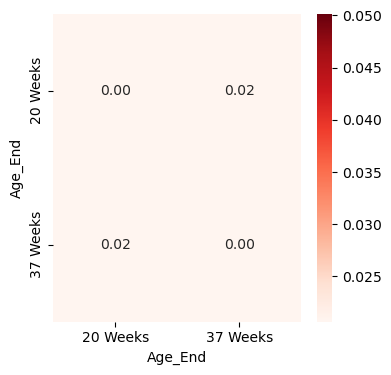

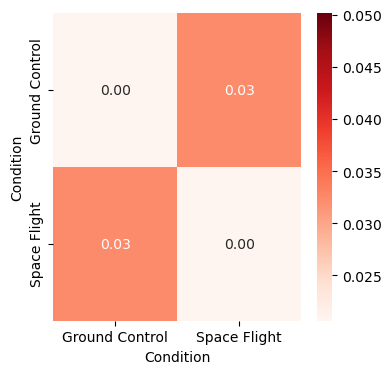

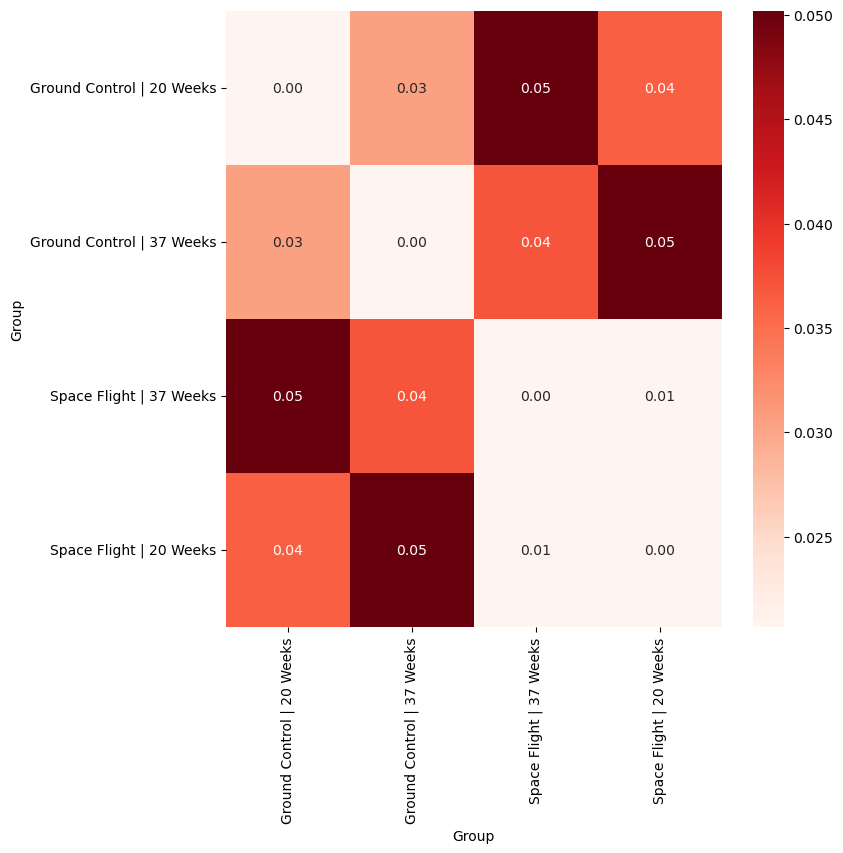



Just Senescence Genes




Output()

Output()

Output()

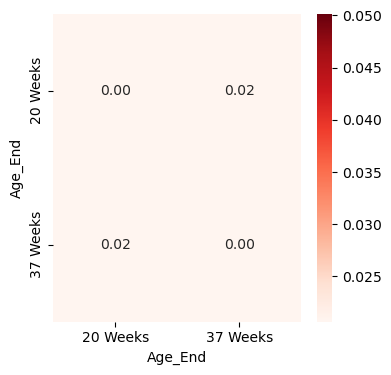

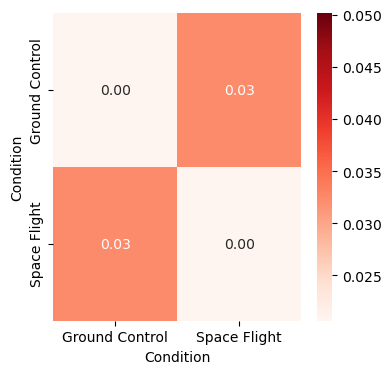

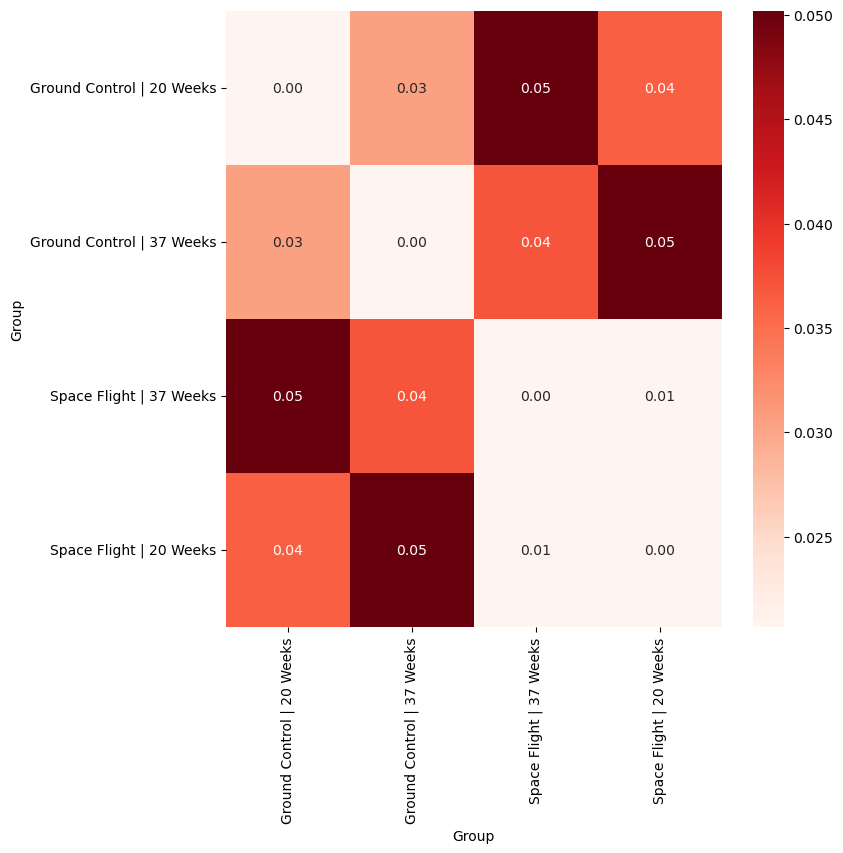

In [19]:
print(f"\n\n{'=' * 80}\nOverall Distance\n{'=' * 80}\n\n")
df_distance, figs_distance = scflow.ax.analyze_perturbation_distance(
    self.rna, col_condition=[col_age, col_condition, col_batch])

print(f"\n\n{'=' * 80}\nJust Senescence Genes\n{'=' * 80}\n\n")
df_distance_snc, figs_distance_snc = scflow.ax.analyze_perturbation_distance(
    self.rna[:, genes], col_condition=[
        col_age, col_condition, col_batch])

## Composition Analysis

### Cell Type

In [ ]:
# print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
# out_ctc = scflow.ax.analyze_composition(
#     self.rna, col_celltype, col_batch, col_sample=col_sample,
#     palette=palette[col_batch],
#     formula=None, key_modality="coda", reference_cell_type="automatic",
#     absence_threshold=0.1, est_fdr=0.1, level_order=[keys[
#         col_batch]["key_control"]] + keys[col_batch]["key_treatment"])
# plt.show()

# print(f"\n\n{'=' * 80}\nAged Subset\n{'=' * 80}\n\n")
# out_ctc_sf = scflow.ax.analyze_composition(
#     self.rna[self.rna.obs[col_age] != keys[col_age]["key_control"]],
#     col_celltype, col_condition, col_sample=col_sample,
#     formula=None, key_modality="coda", reference_cell_type="automatic",
#     absence_threshold=0.1, est_fdr=0.1, level_order=[keys[col_condition][
#         "key_control"]] + [keys[col_condition]["key_treatment"]])

### Senescent Cells

#### Tree-Aggregated

In [ ]:
# Setup
# col_celltype_hierarchy = [
#     f"{col_celltype}_hierarchical", "SnC_hierarchy"]
col_celltype_hierarchy = [
    "Senescent_Cell", f"{col_celltype}_hierarchical", "SnC_hierarchy",
    "Senescent_Cell_Label_by_Type"]
# col_celltype_hierarchy = [
#     "Senescent_Cell_Label", f"SnC_hierarchy",
#     "Senescent_Cell_Label_by_Type"]
ref_celltype = self.rna.obs[col_celltype_hierarchy[-1]].value_counts(
    ).index.values[0]
form_c = " + ".join([col_condition, col_age]) + " + " + " * ".join([
    col_condition, col_age])

# By SF vs. GC (No Age)
_ = scflow.ax.analyze_composition_tree(
    self.rna, col_celltype_hierarchy[-1], col_condition,
    col_sample=col_sample, formula=None, seed=0, est_fdr=0.2,
    reference_cell_type=ref_celltype, num_warmup=2000,
    col_celltype_hierarchy=col_celltype_hierarchy)

# By SF & Age
_ = scflow.ax.analyze_composition_tree(
    self.rna, col_celltype_hierarchy[-1], [col_condition, col_age],
    formula=form_c, col_sample=col_sample, seed=0,
    reference_cell_type=ref_celltype, est_fdr=0.2,
    col_celltype_hierarchy=col_celltype_hierarchy)

#### `scCoda`

##### Just by Condition (By Cell Type)

Seed = 0; 10000 samples; 10000 warmup


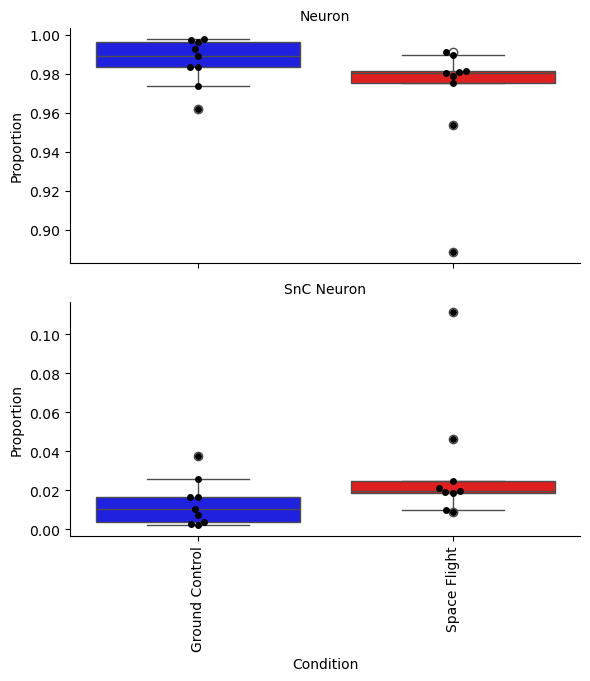

sample: 100%|█| 12000/12000 [01:56<00:00, 102.63it/s, 15 steps of size 8.96e-02


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Neuron                                                                  │
│ Formula                               │ Condition                                                               │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 81.1%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Neuron                            3.987         3.206  4.732   0.415     3789.511                               │
│ SnC Neuron                        0.105        -0.557  0.708   0.341       78.100                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                            Final Parameter  Expected Sample  log2-fold change                                   │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Neuron          0.000           3789.511           0.000                                         │
│                SnC Neuron      0.000             78.100           0.000                                         │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                            HDI 3%  HDI 97%   SD   Inclusion probability                                         │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Neuron       0.000  0.000   0.000         0.000                                                  │
│                SnC Neuron  -0.133  1.082   0.338         0.577                                                  │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate  Condition[T.Space Flight]
Cell Type                           
Neuron                              
SnC Neuron                          




Seed = 0; 10000 samples; 10000 warmup


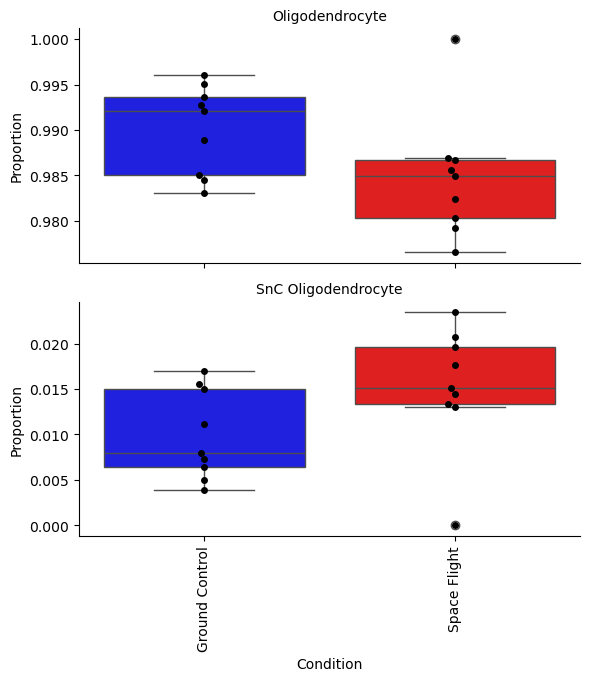

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [03:00<00:00, 66.32it/s, 31 steps of size 4.46e-02.


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Oligodendrocyte                                                         │
│ Formula                               │ Condition                                                               │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 0.891                                                                   │
│ Spike-and-slab threshold              │ 0.891                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 81.9%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Oligodendrocyte                   7.342        5.476   9.605   1.132     1028.582                               │
│ SnC Oligodendrocyte               2.799        1.027   5.006   1.099       10.946                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                     Final Parameter  Expected Sample  log2-fold change                          │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Oligodendrocyte          0.000           1022.094           -0.009                               │
│                SnC Oligodendrocyte      0.472             17.434            0.672                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                     HDI 3%  HDI 97%   SD   Inclusion probability                                │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Oligodendrocyte       0.000  0.000   0.000         0.000                                         │
│                SnC Oligodendrocyte  -0.001  0.767   0.232         0.891                                         │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate           Condition[T.Space Flight]
Cell Type                                    
Oligodendrocyte                              
SnC Oligodendrocyte                         *




Seed = 8675309; 10000 samples; 10000 warmup


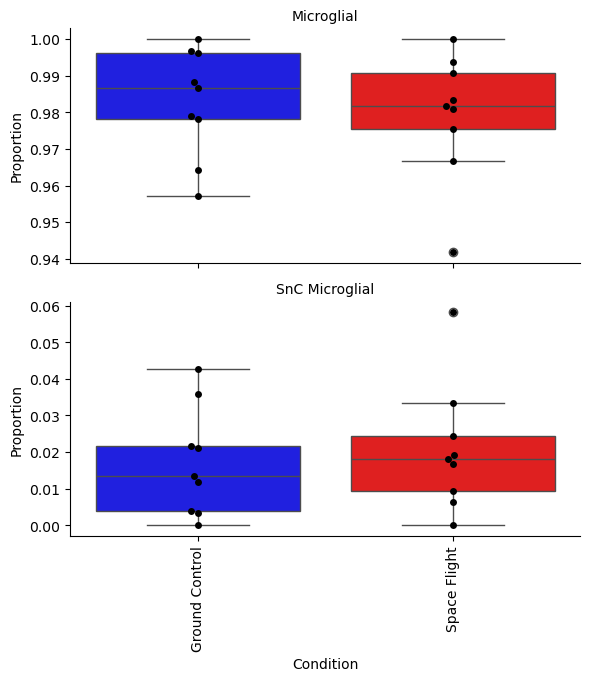

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [01:08<00:00, 174.85it/s, 3 steps of size 1.23e-01.

! Acceptance rate unusually low (0.5088825769472839 < 0.5)! Results might be incorrect! Please check feasibility of results and re-run the sampling step with a different rng_key if necessary.


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Microglial                                                              │
│ Formula                               │ Condition                                                               │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 50.9%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Microglial                        5.169         3.820  6.131   0.620     183.429                                │
│ SnC Microglial                    1.149        -0.035  2.100   0.568       3.293                                │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                Final Parameter  Expected Sample  log2-fold change                               │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Microglial          0.000           183.429            0.000                                     │
│                SnC Microglial      0.000             3.293            0.000                                     │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                HDI 3%  HDI 97%   SD    Inclusion probability                                    │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Microglial       0.000   0.000   0.000         0.000                                             │
│                SnC Microglial  -0.037  51.856  25.056         0.642                                             │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate      Condition[T.Space Flight]
Cell Type                               
Microglial                              
SnC Microglial                          




Seed = 8; 10000 samples; 10000 warmup


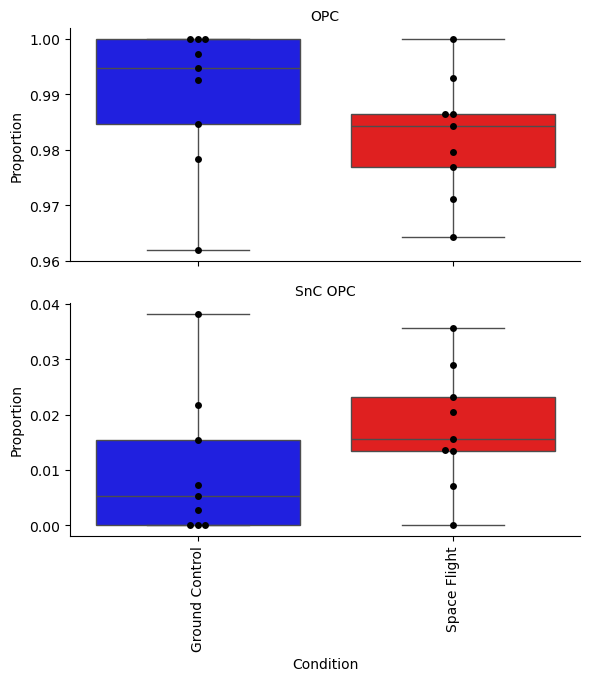

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [00:51<00:00, 234.29it/s, 1 steps of size 6.64e-02.

! Acceptance rate unusually low (0.1411290912506283 < 0.5)! Results might be incorrect! Please check feasibility of results and re-run the sampling step with a different rng_key if necessary.


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ OPC                                                                     │
│ Formula                               │ Condition                                                               │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 0.924                                                                   │
│ Spike-and-slab threshold              │ 0.924                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 14.1%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD    Expected Sample                          │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ OPC                               33.953       5.260   39.508  12.493     199.333                               │
│ SnC OPC                            3.909       0.832    4.476   1.207       0.000                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                           Final Parameter  Expected Sample  log2-fold change                                    │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight OPC             0.000            0.044           -12.154                                         │
│                SnC OPC        38.468          199.290            43.344                                         │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                           HDI 3%  HDI 97%   SD    Inclusion probability                                         │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight OPC        0.000    0.000   0.000         0.000                                                  │
│                SnC OPC    0.521   61.739  17.057         0.924                                                  │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate Condition[T.Space Flight]
Cell Type                          
OPC                                
SnC OPC                           *




Seed = 7654321; 14000 samples; 14000 warmup


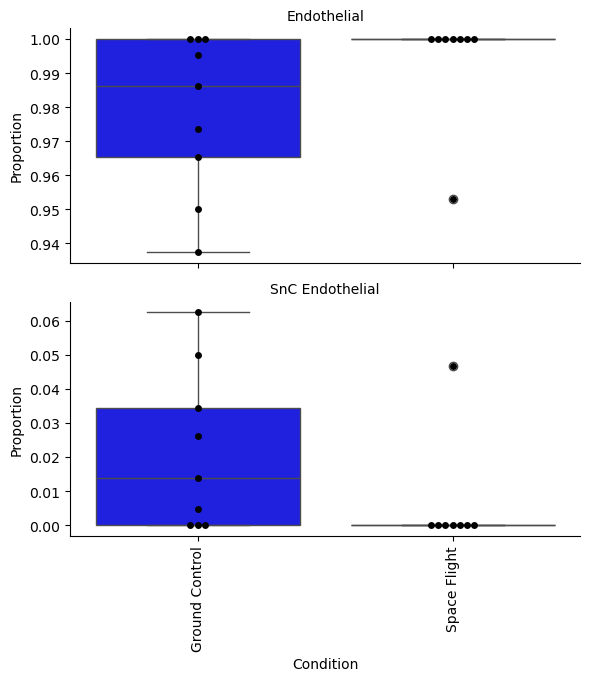

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [01:44<00:00, 115.09it/s, 1 steps of size 9.03e-02.


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 17 samples, 2 cell types                                          │
│ Reference cell type                   │ Endothelial                                                             │
│ Formula                               │ Condition                                                               │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 78.4%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD    Expected Sample                          │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Endothelial                       8.992         3.353  40.892  10.990      51.515                               │
│ SnC Endothelial                   2.439        -0.521   9.206   2.756       0.073                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                 Final Parameter  Expected Sample  log2-fold change                              │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Endothelial          0.000            51.515            0.000                                    │
│                SnC Endothelial      0.000             0.073            0.000                                    │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                 HDI 3%  HDI 97%   SD    Inclusion probability                                   │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Endothelial       0.000   0.000   0.000         0.000                                            │
│                SnC Endothelial  -0.561 186.903  52.752         0.510                                            │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate       Condition[T.Space Flight]
Cell Type                                
Endothelial                              
SnC Endothelial                          




Seed = 0; 10000 samples; 10000 warmup


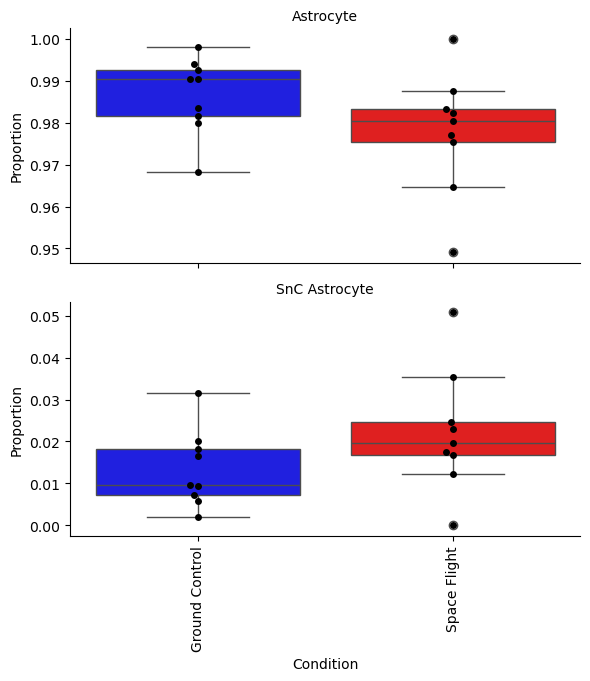

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [02:16<00:00, 87.98it/s, 1 steps of size 6.24e-02. 


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Astrocyte                                                               │
│ Formula                               │ Condition                                                               │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 83.5%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Astrocyte                         5.557        4.228   6.948   0.742     390.001                                │
│ SnC Astrocyte                     1.387        0.212   2.718   0.684       6.026                                │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  Expected Sample  log2-fold change                                │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Astrocyte          0.000           390.001            0.000                                      │
│                SnC Astrocyte      0.000             6.026            0.000                                      │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               HDI 3%  HDI 97%   SD    Inclusion probability                                     │
│ Covariate      Cell Type                                                                                        │
│ T.Space Flight Astrocyte       0.000  0.000    0.000         0.000                                              │
│                SnC Astrocyte  -0.090  1.117   10.810         0.745                                              │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate     Condition[T.Space Flight]
Cell Type                              
Astrocyte                              
SnC Astrocyte                          






In [235]:
for x in self.rna.obs[col_celltype].unique():
    r_s, num_samples, num_warmup = 0, 10000, 2000  # defaults
    if "annotation_scanvi" in col_celltype:  # avoid bad acceptance rates
        r_s = 2 if x  == "OPC" else 2323 if x in [
            "Microglial"] else r_s  # different random seed
        if x == "Endothelial":
            r_s, num_samples, num_warmups = 7654321, 14000, 2000
    print(f"Seed = {r_s}; {num_samples} samples; {num_samples} warmup")
    out = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        "Senescent_Cell_Label_by_Type", col_condition,
        col_sample=col_sample, formula=None, key_modality="coda",
        full_hmc=False, palette=palette[col_condition], seed=r_s,
        num_samples=10000, num_warmup=2000,
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.2,
        level_order=[keys[col_condition]["key_control"], keys[
            col_condition]["key_treatment"]])
    f_sccoda_out = f"outputs/sccoda_results_{col_celltype}_{x}_sfgc.pkl"
    if overwrite is True or os.path.exists(f_sccoda_out) is False:
        with open(f_sccoda_out, "wb") as f:
            pickle.dump(out[0], f)
        # out[1].write_h5mu(
        #     f"outputs/sccoda_data_{col_celltype}_{x}_sfgc.h5mu")
    plt.show()
    del out

# x = "Endothelial"
# ann = self.rna[self.rna.obs[col_celltype] == x]
# sccoda = pt.tl.Sccoda()
# mdata = sccoda.load(ann, type="cell_level", generate_sample_level=True,
#                     cell_type_identifier="Senescent_Cell_Label_by_Type",
#                     sample_identifier=col_sample, covariate_obs=[col_batch])
# fig = sccoda.plot_boxplots(mdata, feature_name=col_batch, plot_facets=True,
#                            level_order=list(palette[col_batch].keys()),
#                            palette=palette[col_batch], return_fig=True)
# for a in fig.fig.axes:
#     a.tick_params(axis="x", labelrotation=90)

##### By Condition & Age



By Cell Type (by Group)




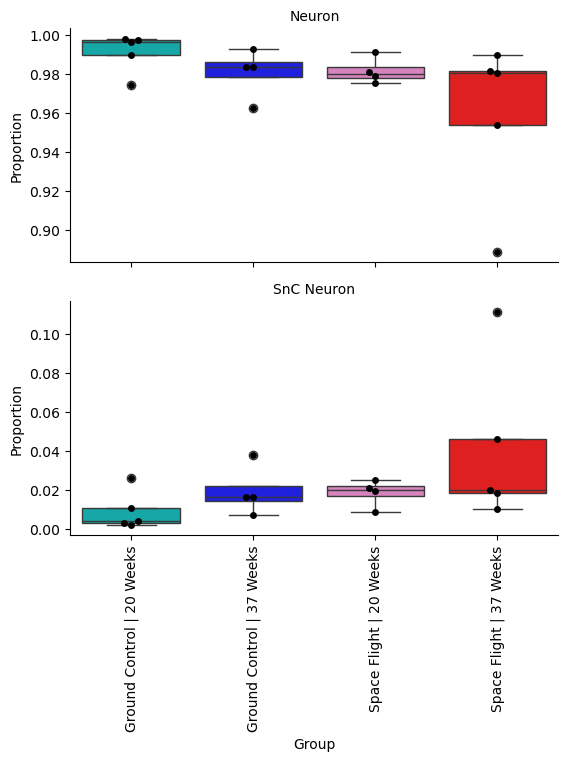

sample: 100%|█| 12000/12000 [04:23<00:00, 45.61it/s, 1 steps of size 4.16e-02. 


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Neuron                                                                  │
│ Formula                               │ Group                                                                   │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 76.0%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Neuron                            3.979         3.222  4.725   0.395     3787.418                               │
│ SnC Neuron                        0.124        -0.500  0.727   0.322       80.193                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                              Final Parameter  Expected Sample  log2-fold change                 │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Neuron          0.000           3787.418           0.000                       │
│                                  SnC Neuron      0.000             80.193           0.000                       │
│ GroupT.Space Flight | 20 Weeks   Neuron          0.000           3787.418           0.000                       │
│                                  SnC Neuron      0.000             80.193           0.000                       │
│ GroupT.Space Flight | 37 Weeks   Neuron          0.000           3787.418           0.000                       │
│                                  SnC Neuron      0.000             80.193           0.000                       │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                              HDI 3%  HDI 97%   SD    Inclusion probability                      │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Neuron       0.000   0.000   0.000         0.000                               │
│                                  SnC Neuron  -0.481   0.762   0.190         0.444                               │
│ GroupT.Space Flight | 20 Weeks   Neuron       0.000   0.000   0.000         0.000                               │
│                                  SnC Neuron  -0.525   0.737   0.198         0.358                               │
│ GroupT.Space Flight | 37 Weeks   Neuron       0.000   0.000   0.000         0.000                               │
│                                  SnC Neuron  -0.041  48.593  14.704         0.607                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate  Group[T.Ground Control | 37 Weeks] Group[T.Space Flight | 20 Weeks] Group[T.Space Flight | 37 Weeks]
Cell Type                                                                                                      
Neuron                                                                                                         
SnC Neuron                                                                                                     






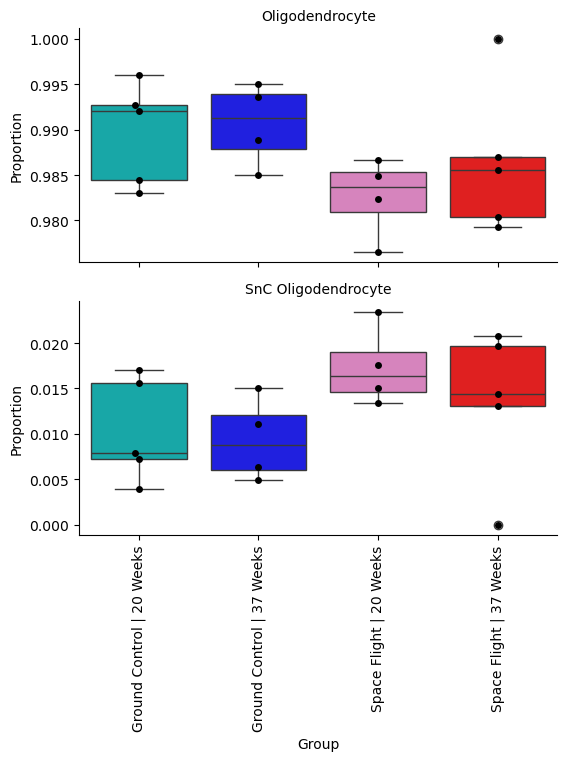

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [04:42<00:00, 42.40it/s, 63 steps of size 4.15e-02.


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Oligodendrocyte                                                         │
│ Formula                               │ Group                                                                   │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 76.2%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Oligodendrocyte                   6.802        5.160   8.430   0.976     1026.945                               │
│ SnC Oligodendrocyte               2.400        0.809   3.940   0.937       12.583                               │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                       Final Parameter  Expected Sample  log2-fold change        │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Oligodendrocyte          0.000           1026.945           0.000              │
│                                  SnC Oligodendrocyte      0.000             12.583           0.000              │
│ GroupT.Space Flight | 20 Weeks   Oligodendrocyte          0.000           1026.945           0.000              │
│                                  SnC Oligodendrocyte      0.000             12.583           0.000              │
│ GroupT.Space Flight | 37 Weeks   Oligodendrocyte          0.000           1026.945           0.000              │
│                                  SnC Oligodendrocyte      0.000             12.583           0.000              │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                       HDI 3%  HDI 97%   SD   Inclusion probability              │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Oligodendrocyte       0.000  0.000   0.000         0.000                       │
│                                  SnC Oligodendrocyte  -0.689  0.175   0.178         0.395                       │
│ GroupT.Space Flight | 20 Weeks   Oligodendrocyte       0.000  0.000   0.000         0.000                       │
│                                  SnC Oligodendrocyte  -0.073  0.776   0.249         0.591                       │
│ GroupT.Space Flight | 37 Weeks   Oligodendrocyte       0.000  0.000   0.000         0.000                       │
│                                  SnC Oligodendrocyte  -0.108  0.739   0.226         0.539                       │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate           Group[T.Ground Control | 37 Weeks] Group[T.Space Flight | 20 Weeks] Group[T.Space Flight | 37 Weeks]
Cell Type                                                                                                               
Oligodendrocyte                                                                                                         
SnC Oligodendrocyte                                                                                                     






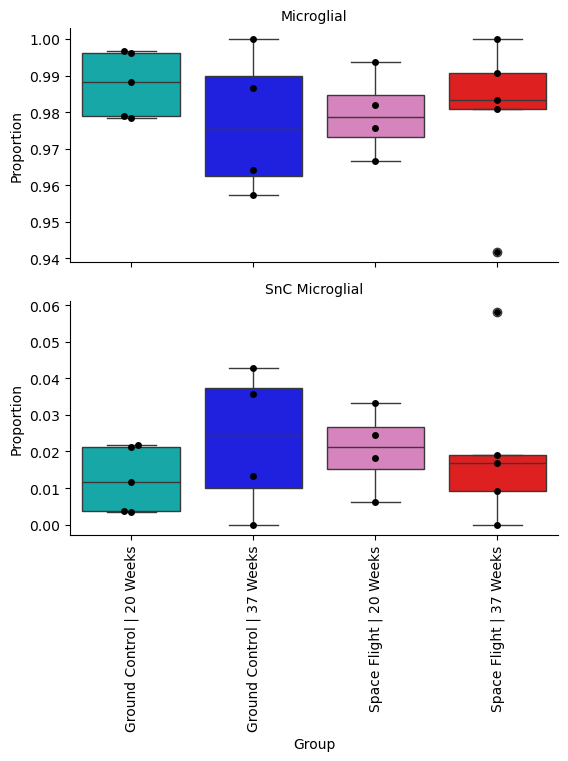

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [42:29<00:00,  4.71it/s, 1023 steps of size 1.85e-1


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Microglial                                                              │
│ Formula                               │ Group                                                                   │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 87.2%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Microglial                        35.771       35.771  35.771  0.000     186.722                                │
│ SnC Microglial                     2.377        2.377   2.377  0.000       0.000                                │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                  Final Parameter  Expected Sample  log2-fold change             │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Microglial           0.000            0.000           -67.961                  │
│                                  SnC Microglial      80.501          186.722            48.177                  │
│ GroupT.Space Flight | 20 Weeks   Microglial           0.000          186.722             0.000                  │
│                                  SnC Microglial       0.000            0.000             0.000                  │
│ GroupT.Space Flight | 37 Weeks   Microglial           0.000          186.722             0.000                  │
│                                  SnC Microglial       0.030            0.000             0.044                  │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                  HDI 3%  HDI 97%   SD   Inclusion probability                   │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Microglial       0.000   0.000  0.000         0.000                            │
│                                  SnC Microglial  80.501  80.501  0.000         1.000                            │
│ GroupT.Space Flight | 20 Weeks   Microglial       0.000   0.000  0.000         0.000                            │
│                                  SnC Microglial     NaN     NaN  0.000         0.000                            │
│ GroupT.Space Flight | 37 Weeks   Microglial       0.000   0.000  0.000         0.000                            │
│                                  SnC Microglial   0.030   0.030  0.000         1.000                            │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate      Group[T.Ground Control | 37 Weeks] Group[T.Space Flight | 20 Weeks] Group[T.Space Flight | 37 Weeks]
Cell Type                                                                                                          
Microglial                                                                                                         
SnC Microglial                                  *                                                                 *






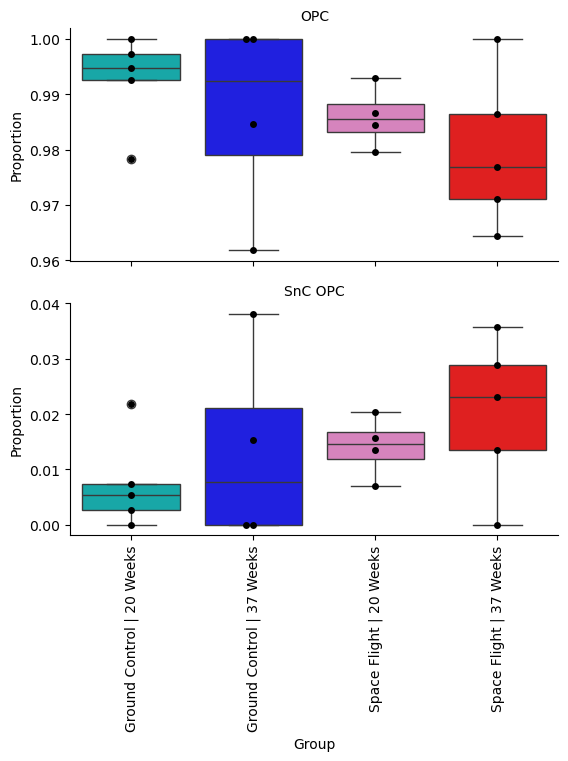

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [46:40<00:00,  4.29it/s, 1023 steps of size 2.22e-1


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ OPC                                                                     │
│ Formula                               │ Group                                                                   │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 81.0%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ OPC                               33.349       33.349  33.349  0.000     199.333                                │
│ SnC OPC                            2.026        2.026   2.026  0.000       0.000                                │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                             Final Parameter  Expected Sample  log2-fold change                  │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks OPC             0.000          199.333              0.000                      │
│                                  SnC OPC         0.000            0.000              0.000                      │
│ GroupT.Space Flight | 20 Weeks   OPC             0.000          199.333              0.000                      │
│                                  SnC OPC        -0.001            0.000             -0.002                      │
│ GroupT.Space Flight | 37 Weeks   OPC             0.000            0.000           -124.658                      │
│                                  SnC OPC       117.730          199.333             45.190                      │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                             HDI 3%  HDI 97%   SD   Inclusion probability                        │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks OPC         0.000   0.000  0.000         0.000                                 │
│                                  SnC OPC       NaN     NaN  0.000         0.000                                 │
│ GroupT.Space Flight | 20 Weeks   OPC         0.000   0.000  0.000         0.000                                 │
│                                  SnC OPC    -0.001  -0.001  0.000         1.000                                 │
│ GroupT.Space Flight | 37 Weeks   OPC         0.000   0.000  0.000         0.000                                 │
│                                  SnC OPC   117.691 117.691  0.000         1.000                                 │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate Group[T.Ground Control | 37 Weeks] Group[T.Space Flight | 20 Weeks] Group[T.Space Flight | 37 Weeks]
Cell Type                                                                                                     
OPC                                                                                                           
SnC OPC                                                                     *                                *






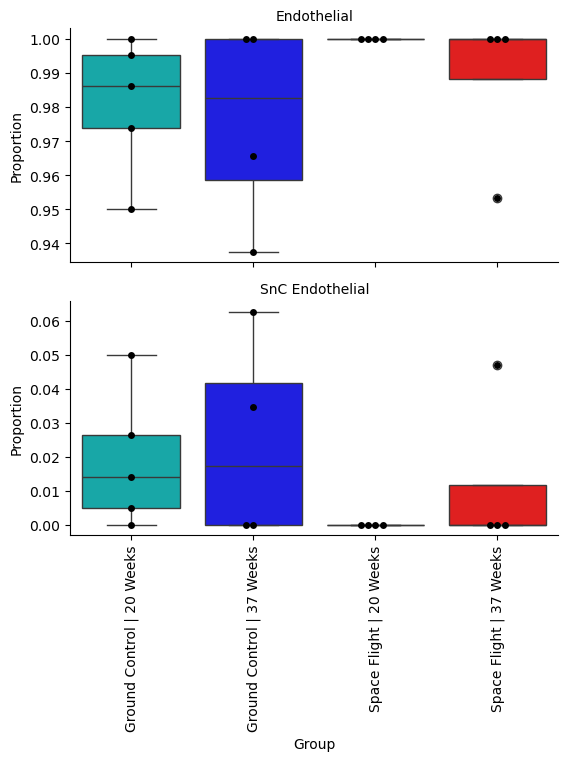

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [48:20<00:00,  4.14it/s, 1023 steps of size 1.56e-1


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 17 samples, 2 cell types                                          │
│ Reference cell type                   │ Endothelial                                                             │
│ Formula                               │ Group                                                                   │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ Spike-and-slab threshold              │ 1.000                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 90.1%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Endothelial                       35.456       35.456  35.456  0.000      51.588                                │
│ SnC Endothelial                    3.752        3.752   3.752  0.000       0.000                                │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                   Final Parameter  Expected Sample  log2-fold change            │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Endothelial           0.000           51.588             0.000                 │
│                                  SnC Endothelial       0.000            0.000             0.000                 │
│ GroupT.Space Flight | 20 Weeks   Endothelial           0.000           51.588             0.000                 │
│                                  SnC Endothelial       0.000            0.000             0.000                 │
│ GroupT.Space Flight | 37 Weeks   Endothelial           0.000            0.000           -26.114                 │
│                                  SnC Endothelial      49.805           51.588            45.739                 │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                   HDI 3%  HDI 97%   SD   Inclusion probability                  │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Endothelial       0.000   0.000  0.000         0.000                           │
│                                  SnC Endothelial     NaN     NaN  0.000         0.000                           │
│ GroupT.Space Flight | 20 Weeks   Endothelial       0.000   0.000  0.000         0.000                           │
│                                  SnC Endothelial     NaN     NaN  0.000         0.000                           │
│ GroupT.Space Flight | 37 Weeks   Endothelial       0.000   0.000  0.000         0.000                           │
│                                  SnC Endothelial  49.805  49.805  0.000         1.000                           │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate       Group[T.Ground Control | 37 Weeks] Group[T.Space Flight | 20 Weeks] Group[T.Space Flight | 37 Weeks]
Cell Type                                                                                                           
Endothelial                                                                                                         
SnC Endothelial                                                                                                    *






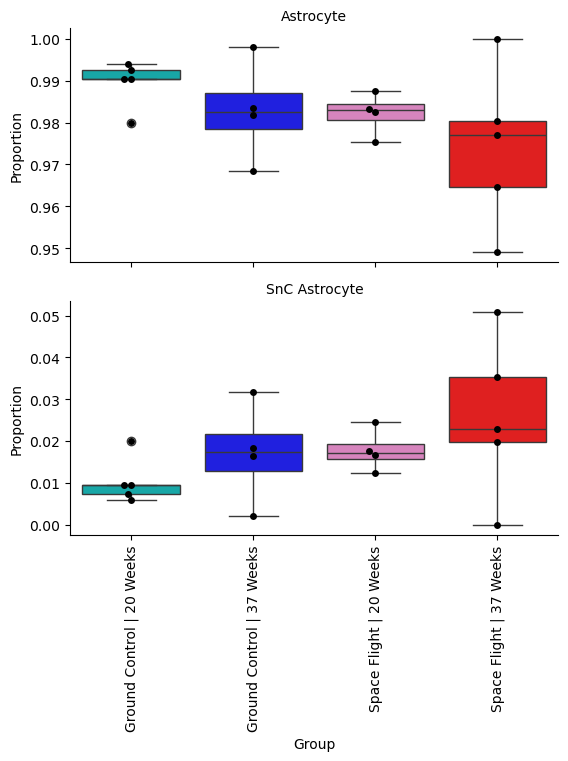

• Zero counts encountered in data! Added a pseudocount of 0.5.


sample: 100%|█| 12000/12000 [04:39<00:00, 42.93it/s, 63 steps of size 4.11e-02.


                                          Compositional Analysis summary                                           
┌───────────────────────────────────────┬─────────────────────────────────────────────────────────────────────────┐
│ Name                                  │ Value                                                                   │
├───────────────────────────────────────┼─────────────────────────────────────────────────────────────────────────┤
│ Data                                  │ Data: 18 samples, 2 cell types                                          │
│ Reference cell type                   │ Astrocyte                                                               │
│ Formula                               │ Group                                                                   │
│ Reference index                       │ 0                                                                       │
│ Spike-and-slab threshold              │ 0.835                                                                   │
│ Spike-and-slab threshold              │ 0.835                                                                   │
│ MCMC Sampling                         │ Sampled 10000 chain states (2000 burnin samples)                        │
│ Acceptance rate                       │ 79.5%                                                                   │
└───────────────────────────────────────┴─────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Intercepts                                                                                                      │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                               Final Parameter  HDI 3%  HDI 97%   SD   Expected Sample                           │
│ Senescent_Cell_Label_by_Type                                                                                    │
│ Astrocyte                         5.890        4.245   7.672   0.972     389.978                                │
│ SnC Astrocyte                     1.724        0.285   3.450   0.904       6.050                                │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects                                                                                                         │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                 Final Parameter  Expected Sample  log2-fold change              │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Astrocyte          0.000           389.978             0.000                   │
│                                  SnC Astrocyte      0.000             6.050             0.000                   │
│ GroupT.Space Flight | 20 Weeks   Astrocyte          0.000           389.978             0.000                   │
│                                  SnC Astrocyte      0.000             6.050             0.000                   │
│ GroupT.Space Flight | 37 Weeks   Astrocyte          0.000           384.531            -0.020                   │
│                                  SnC Astrocyte      0.656            11.497             0.926                   │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘

┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│ Effects Extended                                                                                                │
├─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                 HDI 3%  HDI 97%   SD   Inclusion probability                    │
│ Covariate                        Cell Type                                                                      │
│ GroupT.Ground Control | 37 Weeks Astrocyte       0.000  0.000   0.000         0.000                             │
│                                  SnC Astrocyte  -0.493  0.575   0.163         0.363                             │
│ GroupT.Space Flight | 20 Weeks   Astrocyte       0.000  0.000   0.000         0.000                             │
│                                  SnC Astrocyte  -0.342  0.699   0.198         0.433                             │
│ GroupT.Space Flight | 37 Weeks   Astrocyte       0.000  0.000   0.000         0.000                             │
│                                  SnC Astrocyte  -0.014  1.212   0.394         0.835                             │
└─────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘



==================================================   Credible Effects   ==================================================

 Covariate     Group[T.Ground Control | 37 Weeks] Group[T.Space Flight | 20 Weeks] Group[T.Space Flight | 37 Weeks]
Cell Type                                                                                                         
Astrocyte                                                                                                         
SnC Astrocyte                                                                                                    *






In [429]:
print(f"\n\n{'=' * 80}\nBy Cell Type (by Group)\n{'=' * 80}\n\n")
for x in self.rna.obs[col_celltype].unique():
    r_s = 1618
    if "annotation_scanvi" in col_celltype:
        r_s = 32145 if x in ["Neuron"] else 16 if x in [
            "Microglia", "OPC"] else r_s
    out = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        "Senescent_Cell_Label_by_Type", col_batch, col_sample=col_sample,
        formula=None, key_modality="coda", full_hmc=False,
        palette=palette[col_batch], seed=r_s,
        num_samples=10000, num_warmup=2000,
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.2,
        level_order=[keys[col_batch]["key_control"]] + keys[
            col_batch]["key_treatment"])
    f_sccoda_out = f"outputs/sccoda_results_{col_celltype}_{x}.pkl"
    if overwrite is True or os.path.exists(f_sccoda_out) is False:
        with open(f_sccoda_out, "wb") as f:
            pickle.dump(out[0], f)
        # out[1].write_h5mu(f"outputs/sccoda_data_{col_celltype}_{x}.h5mu")
    plt.show()
    del out

# Reload
# out_ctc_ct = {}
# for x in self.rna.obs[col_celltype].unique():
#     with open(f"outputs/sccoda_results_{col_celltype}_{x}.pkl", "rb") as f:
#         tmp = pickle.load(f)
#     out_ctc_ct[x] = [tmp, mudata.read(
#         f"outputs/sccoda_data_{col_celltype}_{x}.h5mu")]
#     del tmp

##### Lower SnC Threshold

In [ ]:
%time

chp = f"Senescent_Cell_Label_by_Type_{use_metric}_{p_h}"  # column name
print("Cross-Tabs of Cell Counts in SnC Classifications "
      f"with Top {percentile}% Threshold versus Top {p_h}%")
print(self.rna.obs[["Senescent_Cell_Label_by_Type", chp]].value_counts(
    ).sort_index(), "\n\n")  # cross-tabs of higher vs. lower SnC threshold
# print(self.rna.obs[["Senescent_Cell_Label_by_Type", chp, col_batch]].groupby(
#     col_batch).value_counts().unstack(0).replace(0, np.nan).dropna(
#         how="all", axis=0).astype(int).sort_index())  # cross-tabs by group
for x in self.rna.obs[col_celltype].unique():
    r_s = 1618
    if "annotation_scanvi" in col_celltype and x == "Endothelial":
        r_s = 0
    out = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        chp, col_condition, col_sample=col_sample,
        formula=None, key_modality="coda", full_hmc=False,
        palette=palette[col_condition], seed=r_s,
        num_samples=10000, num_warmup=2000,
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.2,
        level_order=[keys[col_condition]["key_control"], keys[
            col_condition]["key_treatment"]])
    f_sccoda = f"outputs/sccoda_results_{col_celltype}_{x}_sfgc_{p_h}pct.pkl"
    if overwrite is True or os.path.exists(f_sccoda) is False:
        with open(f_sccoda, "wb") as f:
            pickle.dump(out[0], f)
        out[1].write_h5mu(
            f"outputs/sccoda_data_{col_celltype}_{x}_sfgc_{p_h}pct.h5mu")
    plt.show()
    del out

## Differential Gene Expression

Mainly using `edgeR`

### Pseudo-Bulk & Examine Covariates

In [ ]:
pdata = scflow.tl.create_pseudobulk(
    self.rna, [i for i in [col_sample, col_condition, col_age] if i],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pdata.layers["counts"] = pdata.X.copy()
sc.pp.normalize_total(pdata, target_sum=1e6)
sc.pp.log1p(pdata)
sc.pp.pca(pdata)
sc.pl.pca(pdata, color=pdata.obs, ncols=1, size=300)

### Overall DEGs by Groups

#### Age

**In older spaceflight mice compared to younger spaceflight mice**
* 9630013a20Rik (CNS myelination and neural tissue regeneration) is downregulated.
* mt-Td is upregulated.

In [ ]:
%matplotlib inline

# Overall
print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
out_edgr_age = scflow.ax.run_deg_edgr(
    self.rna, col_age, col_covariate=None, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title="Age DEGs: Overall Sample\n\n")

# Ground Control Subset
print(f"\n\n{'=' * 80}\nGround Control Subset\n{'=' * 80}\n\n")
out_edgr_age_gc = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_condition] == keys[
        col_condition]["key_control"]],
    col_age, col_covariate=None, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title="Age DEGs: Just Ground Control\n\n")

# Space Flight Subset
print(f"\n\n{'=' * 80}\nSpace Flight Subset\n{'=' * 80}\n\n")
out_edgr_age_sf = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_condition] == keys[
        col_condition]["key_treatment"]],
    col_age, col_covariate=None, formula=None, **keys[col_age],
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype,
    col_sample=col_sample, fig_title="Age DEGs: Just Space Flight\n\n")

#### Condition

```
out_edgr_con_o[0][(out_edgr_con_o[0].adj_p_value < 0.01) & (
    out_edgr_con_o[0].abs_log_fc > 0.5)].sort_values(
        "abs_log_fc", ascending=False)
```

Among the older mice, *Mir6236* was differentially highly expressed in aged spaceflight mice compared to ground control mice (LFC=1.95, adjusted p=2.61e-13 in the overall sample; LFC=2.11, adjusted p=0.000015 in the aged subset). Suppression of this gene has been linked to neuronal morphogenesis (https://pubs.acs.org/doi/abs/10.1021/acsabm.0c01389) and therefore may represent a candidate intervention target. 

*Il31ra*, which has been linked to neuroinflammation (https://advanced.onlinelibrary.wiley.com/doi/pdfdirect/10.1002/advs.202409086), was also more highly expressed in spaceflight mice compared to ground control mice (LFC=1.52, adjusted p<0.001 in the overall sample; LFC=1.53, adjusted p<0.001 in the aged subset).

*UBA52*, also more highly expressed in spaceflight mice (LFC=1.43, adjusted p<0.001 in the overall sample; LFC=1.45, adjusted p<0.001 in the aged subset), may serve a neuroprotective role: It has been shown underexpressed in PD (https://www.mdpi.com/2073-4409/11/23/3770) and plays a role in neuroautophagy (https://www.tandfonline.com/doi/pdf/10.1080/15548627.2024.2395727). Likewise, *Pomp*, a gene associated with oxidative stress resistance and protein clearance [CITATION] was also more highly expressed in spaceflight mice. In contrast to past observations of downregulation of *Uqcr11* in Alheimer's (https://www.benthamdirect.com/content/journals/car/10.2174/1567205014666170505095921), that gene was differentially highly expressed in spaceflight mice (LFC=1.23 aged subset; LFC=1.44 overall; p<0.001); however, *Cmss1*, which has been associated with Alzheimer's in APOE4 mice (https://pmc.ncbi.nlm.nih.gov/articles/PMC8064208/), was also more highly expressed in spaceflight mice.

Genes involved in oxidative phosphorylation and the electron transport chain, including *Atp5e*, *Ndufa12*, and *Uqcr11* were also more highly expressed in spaceflight mice. *Uqcr11* has shown an anti-apoptotic and oxidative stress alleviation role in mice (https://www.mdpi.com/2073-4425/16/5/526).

*Tpt1* and *Rn7sk* were also upregulated in spaceflight mice. *Tpt1*, which is associated with cancer progression, anti-apoptosis, and cell stress response, has been shown to have a potentially bi-directional relationship with cell cycle control gene and canonical senescence marker *TP53* (https://www.tandfonline.com/doi/pdf/10.4161/cc.25404). *Rn7sk* is associated with cellular senescence (https://onlinelibrary.wiley.com/doi/abs/10.1002/jcp.28119) and Alzheimer's (https://www.nature.com/articles/s41598-024-82490-9.pdf).

---

*Pvalb* overall sample (LFC=1.61, p=1.25e-11)

*Trim17*

*Cck*

*Pam16*

---

*Mitochondrial/electron transport chain genes whose upregulation has been linked to Parkinson's disease (https://pmc.ncbi.nlm.nih.gov/articles/PMC10259399/pdf/AMS-19-3-131629.pdf) and/or adaptive responses to neurodegeneration in Alheimer's mouse models (https://journals.sagepub.com/doi/abs/10.1177/13872877251314847), including *mt-Atp6*, *mt-Co1*, *mt-Cytb* *mt-Nd2*, and *mt-Nd5*, *mt-Nd6...pregulation of *mt-Rnr1*, which also showed higher expression in spaceflight aged mice, has been seen in response to ionizing radiation, possibly reflecting increased mitochonrial biogenesis as an adaptive stress response (https://pmc.ncbi.nlm.nih.gov/articles/PMC5555881)** 

In [ ]:
# Overall
print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
out_edgr_con = scflow.ax.run_deg_edgr(
    self.rna, col_condition, col_covariate=None, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title=f"{col_condition} DEGs (Overall Sample)\n\n")
out_edgr_con_df = out_edgr_con[0][out_edgr_con[
    0].adj_p_value < 0.001].sort_values("abs_log_fc", ascending=False)
goe = out_edgr_con_df.variable[:10].to_list()
print(out_edgr_con_df.iloc[:min(100, out_edgr_con_df.shape[0])], "\n\n", goe)
plt.show()

# Just Old
print(f"\n\n{'=' * 80}\nAged Subset\n{'=' * 80}\n\n")
out_edgr_con_o = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]],
    col_condition, col_covariate=None, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title=f"{col_condition} DEGs (Just Aged)\n\n")
plt.show()
out_edgr_con_o_df = out_edgr_con_o[0][out_edgr_con_o[
    0].adj_p_value < 0.001].sort_values("abs_log_fc", ascending=False)
goes = out_edgr_con_o_df.variable[:10].to_list()
print(out_edgr_con_o_df, "\n\n", goes)
_ = self.plot(
    kind=["violin", "matrix"], col_celltype=col_batch, layer="log1p",
    violin=dict(col_wrap=5, hspace=0.25, rotation=45, figsize=(20, 20)),
    matrix=dict(standard_scale="var"), genes=goes)
out_edgr_old_sf_v_gc = out_edgr_con_o_df[0][(
    out_edgr_con_o_df[0].abs_log_fc > 1) & (
        out_edgr_con_o_df[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
out_edgr_old_sf_v_gc = out_edgr_old_sf_v_gc.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True).rename_axis([col_condition, "variable"])
out_edgr_con_compare = out_edgr_con_o_df.set_index("variable")[[
    "log_fc", "adj_p_value"]].join(out_edgr_con_df.set_index("variable")[[
        "log_fc", "adj_p_value"]], how="inner", lsuffix="_Aged_Subset",
                                   rsuffix="_Overall_Sample")
out_edgr_con_compare

#### Age x Condition

Spaceflight effect (main analysis), can visualize at different ages

*Chchd2* (related to oxidative phosphorylation, cell migration, apoptosis inhibition, COX regulation, stress adaptation, Parkinson's, Lewy Body diseases, and cancer) was more highly expressed in spaceflight mice (and demonstrated a bigger young versus old difference in spaceflight mice).
Spaceflight mice also showed higher expression of several ribosomal proteins (*Rps16*, *Rpl31*, *Rpl17*, *Rpl9*, *Rpl15*, *Rps15a*, *Rpl19*, *Rps7*, *Rps23*, *Rpl37*, *Rps3a1*, *Rpl29*, *Rps15*, *Rps14*).

*Ndufa4* was also more highly expressed (implicated in cancer and mitochondrial dysfunction, part of the cytochrome c oxidase complex which drives oxidative phosphorylation, adaptation to hypoxia via downregulation of oxygen consumption and suppression of mitochondrial ROS production https://www.cell.com/cell-metabolism/fulltext/S1550-4131(11)00394-9?mobileUi=0) in spaceflight mice, as were other genes involved in ATP production/the electron transport chain and oxidative phosophorylation, including *Cox7a2*, *Uqcr11*, *Ndufa12*, *Ndufa4*, *Ndufc1*, *Atp5o-1*, *Atp5e*, and *Uqcrh* (which additionally has been implicated in tumor suppression https://aacrjournals.org/cancerres/article/80/16_Supplement/4795/643367).


In [ ]:
# With Single Label for Age x Condition
print(f"\n\n{'=' * 80}\nGroup (Single Factor)\n{'=' * 80}\n\n")
out_edgr_groups = scflow.ax.run_deg_edgr(
    self.rna, col_batch, col_covariate=None, formula=None,
    **keys[col_batch], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_groups[0].variable[:25]))
plt.show()
# _ = self.plot(kind="violin", col_celltype=col_batch,
#               genes=list(out_edgr_groups[0].variable[:25]), layer="scaled",
#               violin=dict(col_wrap=4, hspace=1, rotation=45))
out_edgr_batches = out_edgr_groups[0][(out_edgr_groups[0].abs_log_fc > 1) & (
    out_edgr_groups[0].adj_p_value < 0.001)].sort_values(
        "adj_p_value", ascending=True)
out_edgr_batches_top = out_edgr_batches.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True).rename_axis([col_condition, "variable"])

# With Contrasts (Age & Condition = Separate Factors)
print(f"\n\n{'=' * 80}\nAge * Condition (2-Factor Contrast)\n{'=' * 80}\n\n")
out_edgr_contrasts = scflow.ax.run_deg_edgr(
    self.rna, col_condition, col_covariate=col_age, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=24,
    col_celltype=col_celltype, col_sample=col_sample)
_ = self.plot(
    kind=["violin", "matrix"], col_celltype=col_batch,
    genes=out_edgr_contrasts[0][out_edgr_contrasts[
        0].adj_p_value < 0.001].sort_values(
            "abs_log_fc", ascending=False).variable[:10], layer="log1p",
    violin=dict(col_wrap=5, hspace=0.25, rotation=45, figsize=(20, 20)),
    matrix=dict(standard_scale="var"))

# Condition x Age
# Vulnerability of mice who were older at launch to spaceflight stress
out_edgr_contrasts_age = scflow.ax.run_deg_edgr(
    self.rna, col_age, col_covariate=col_condition, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=24,
    col_celltype=col_celltype, col_sample=col_sample)

#### Senescence Gene Contrasts Results

In [ ]:
# Genes
sen_genes_in_contrasts = list(set(genes).intersection(
    out_edgr_contrasts[0].variable.unique()))  # senescence genes in contrasts
out_edgr_snc = out_edgr_contrasts[0].set_index(
    "variable").loc[sen_genes_in_contrasts]  # contrast results for snc genes
res_snc_contrast = out_edgr_snc[out_edgr_snc.adj_p_value < 0.01]  # p < 0.01
sig_contrast_genes = list(res_snc_contrast.index.values)  # significant genes

# Plots By Groups; Axis by Cell Types
kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)))
_ = self.plot(kind=["matrix", "dot"], genes=sig_contrast_genes,
              standard_scale="obs", col_celltype=col_celltype,
              by_group=col_batch, **kws)

# Plots By Cell Types; Axis by Groups
# kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)),
#            violin=dict(figsize=(30, 20), col_wrap=4, xlabel=None,
#                        rotation=45, hspace=1, top=0.95))
kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)))
_ = self.plot(kind=["matrix", "dot"], genes=sig_contrast_genes,
              standard_scale="obs", col_celltype=col_batch,
              by_group=col_celltype, **kws)

# Results
print(f"\n{'=' * 80}\nSignificant Senescence Gene Contrasts\n{'=' * 80}\n")
print(sig_contrast_genes)
res_snc_contrast

### Snc versus Not (Group=Covariate)

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


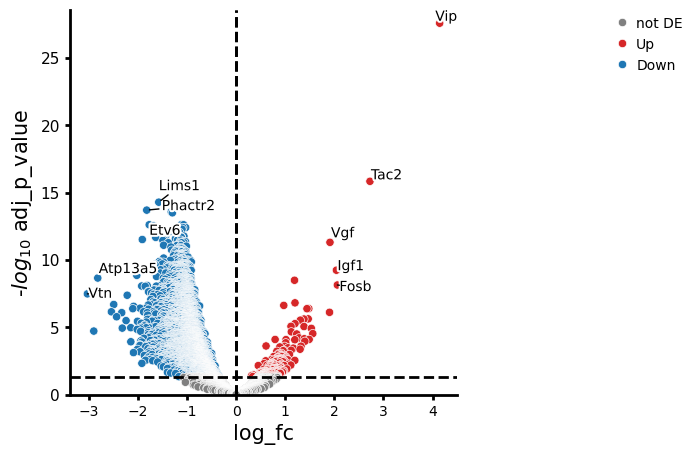

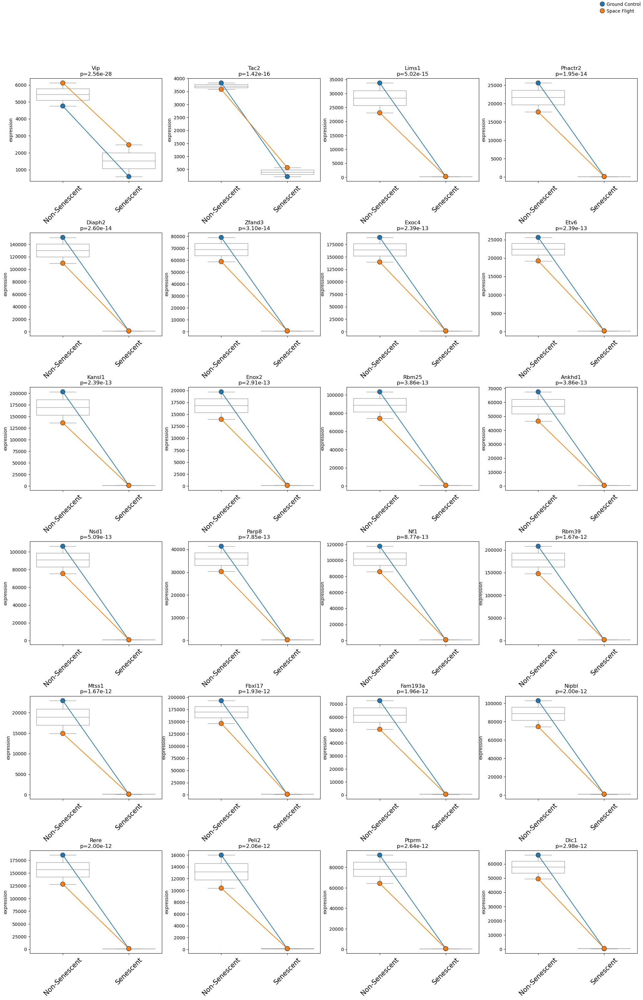

In [254]:
# Group = Covariate
out_edgr_contrasts_snc = scflow.ax.run_deg_edgr(
    self.rna, "Senescent_Cell_Label",
    # col_covariate=col_batch,
    col_covariate=col_condition,
    formula=None,
    key_treatment="Senescent", key_control="Non-Senescent",
    log2fc_thresh=0, n_top_vars=24, xlabel_rotation=45,
    hspace=0.5, wspace=0.2, top=0.92, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)

### SnC versus Not SnC (Group=Subset)



Ground Control (Aged)


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


Spaceflight (Aged)


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


,log_fc,adj_p_value
Condition,Ground Control | 37 Weeks,Ground Control | 37 Weeks
variable,,
Vip,3.587305,0.000148


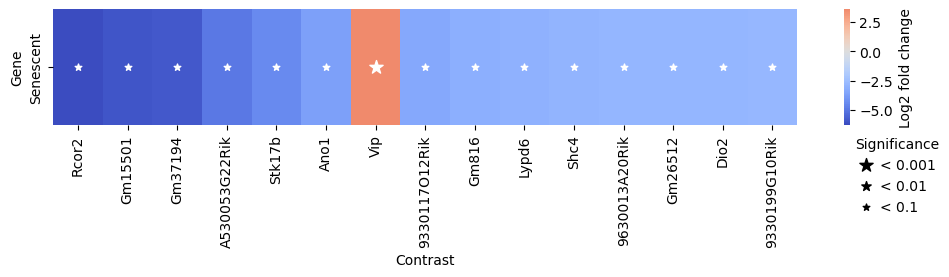

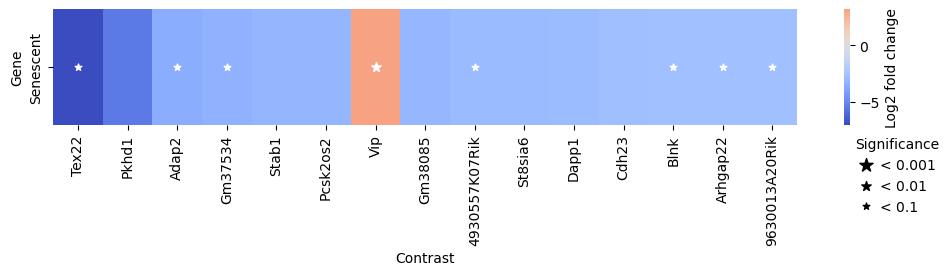

In [246]:
# Aged Subset
subset_old = self.rna.obs[col_age] == keys[col_age]["key_treatment"]

# Old Ground Control SnCs
print(f"\n\n{'=' * 80}\nGround Control (Aged)\n{'=' * 80}\n\n")
subset_gc = self.rna.obs[col_condition] == keys[
    col_condition]["key_control"]
out_edgr_contrasts_snc_gc = scflow.ax.run_deg_edgr(
    self.rna[subset_gc & subset_old], "Senescent_Cell_Label",
    key_treatment="Senescent", top=0.92,
    key_control="Non-Senescent", log2fc_thresh=0, n_top_vars=24,
    xlabel_rotation=45, hspace=0.5, wspace=0.2, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)
if len(self.rna[subset_gc & subset_old].obs[col_batch].unique()) > 1:
    raise ValueError("Check subsetting")
key_1 = self.rna[subset_gc & subset_old].obs[col_batch].unique()[0]

# Old Spaceflight SnCs
print(f"\n\n{'=' * 80}\nSpaceflight (Aged)\n{'=' * 80}\n\n")
subset_sf = self.rna.obs[col_condition] == keys[
    col_condition]["key_treatment"]
out_edgr_contrasts_snc_sf = scflow.ax.run_deg_edgr(
    self.rna[subset_sf & subset_old], "Senescent_Cell_Label",
    key_treatment="Senescent", key_control="Non-Senescent",
    log2fc_thresh=0, n_top_vars=24, xlabel_rotation=45,
    hspace=0.5, wspace=0.2, top=0.92, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)
if len(self.rna[subset_sf & subset_old].obs[col_batch].unique()) > 1:
    raise ValueError("Check subsetting")
key_2 = self.rna[subset_sf & subset_old].obs[col_batch].unique()[0]

# Compare
res_snc_gc = out_edgr_contrasts_snc_gc[0][out_edgr_contrasts_snc_gc[
    0].adj_p_value < 0.001].sort_values("adj_p_value").set_index("variable")
res_snc_sf = out_edgr_contrasts_snc_sf[0][out_edgr_contrasts_snc_sf[
    0].adj_p_value < 0.001].sort_values("adj_p_value").set_index("variable")
res_snc_grps = pd.concat([
    res_snc_gc, res_snc_sf], keys=[key_1, key_2], names=[col_condition])
res_snc_grps = res_snc_grps[res_snc_grps.abs_log_fc >= 1]
# top_tx_g_snc = res_snc_grps.loc[keys[col_condition][
#     "key_treatment"]].sort_values("abs_log_fc", ascending=False).index
# print(res_snc_grps.unstack(0).replace(np.nan, "")[[
#     "log_fc", "adj_p_value"]].loc[top_tx_g_snc])
# just_sf = res_snc_grps.loc[keys[col_condition][
#     "key_treatment"]].index.difference(res_snc_grps.loc[keys[
#         col_condition]["key_control"]].index)
# just_gc = res_snc_grps.loc[keys[col_condition][
#     "key_control"]].index.difference(res_snc_grps.loc[keys[
#         col_condition]["key_treatment"]].index)
# print(res_snc_grps.loc[:, just_gc, :].sort_values(
#     "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]], "\n\n")
# res_snc_grps.loc[:, just_sf, :].sort_values(
#     "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]]
res_snc_grps.unstack(0).replace(np.nan, "")[["log_fc", "adj_p_value"]]

### Group DEGs (SnC=Covariate)



Age = 20 Weeks


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
0 [-0.5712967   0.26558211]
1 [-0.90810554  0.11944424]
• Performing pseudobulk for paired samples


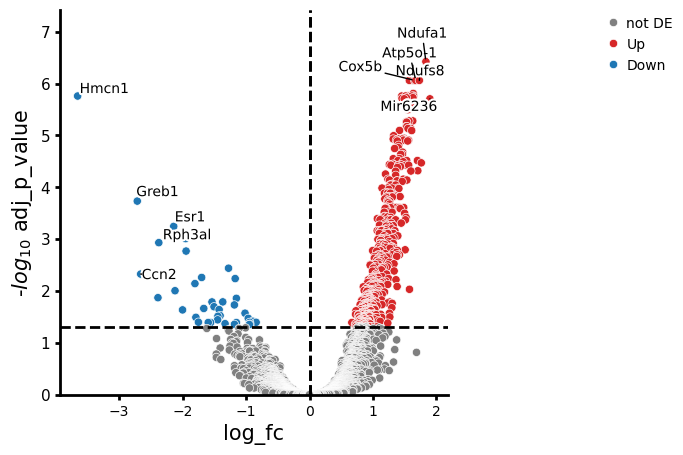

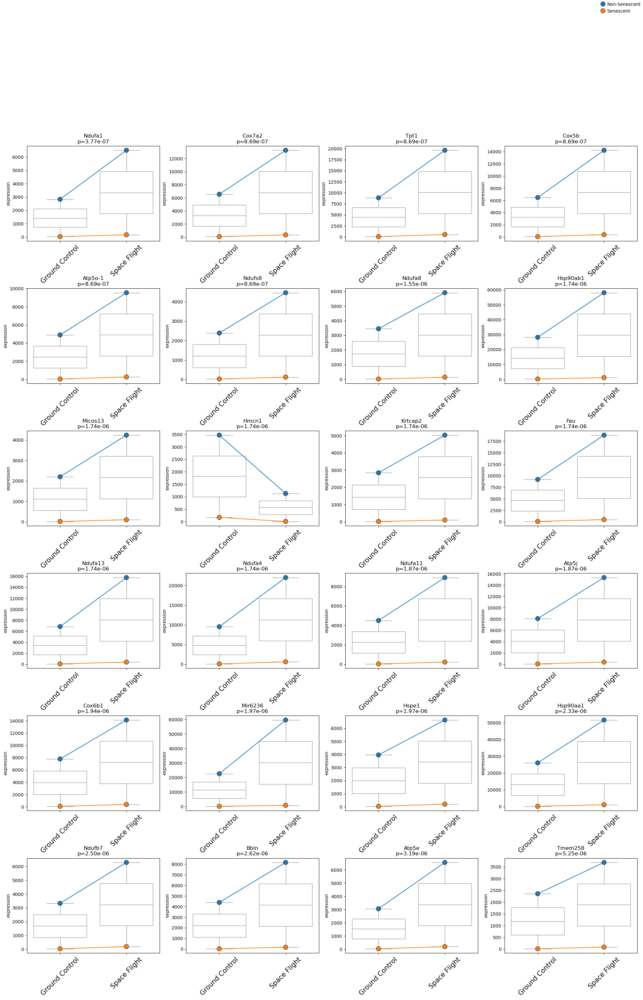



Age = 37 Weeks


• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


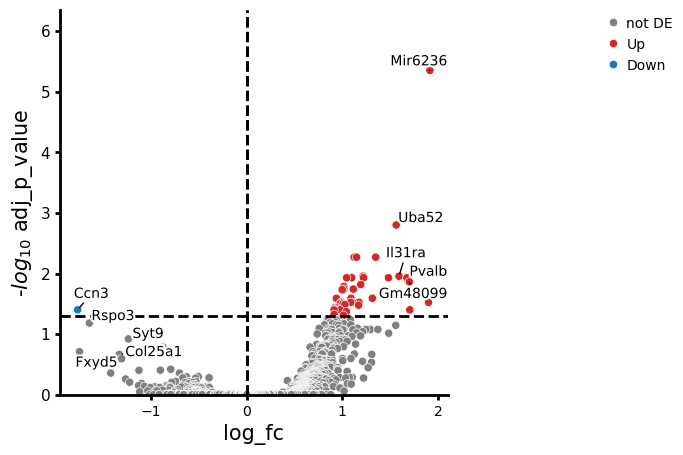

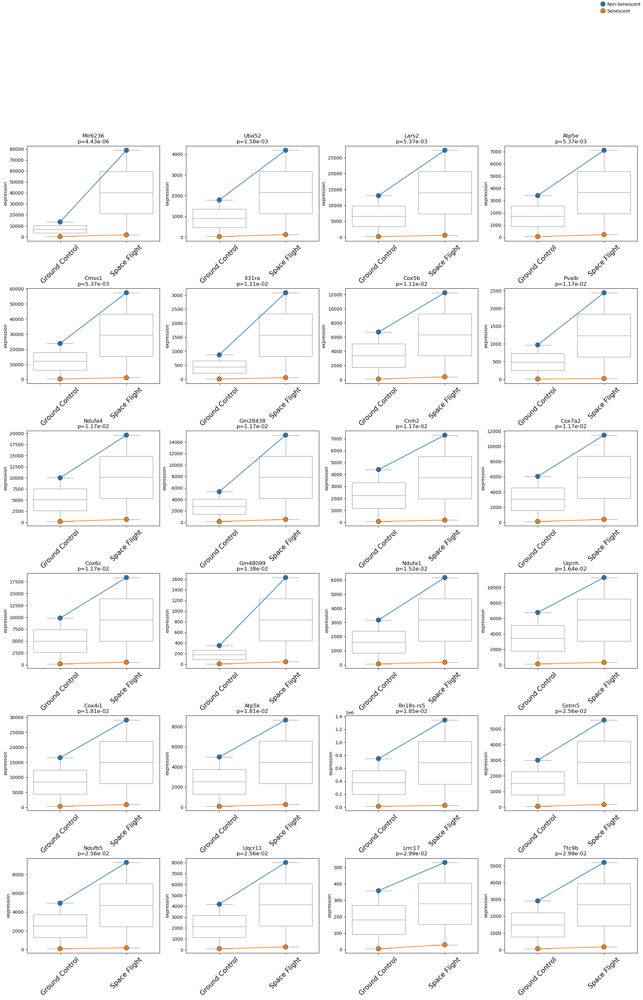

In [245]:
out_edgr_contrasts_snc_cov = {}
for a in self.rna.obs[col_age].unique():
    print(f"\n\n{'=' * 80}\nAge = {a}\n{'=' * 80}\n\n")
    out_edgr_contrasts_snc_cov[a] = scflow.ax.run_deg_edgr(
        self.rna[self.rna.obs[col_age] == a], col_condition,
        col_covariate="Senescent_Cell_Label",
        **keys[col_condition], log2fc_thresh=0, n_top_vars=24,
        xlabel_rotation=45, hspace=0.5, wspace=0.2, top=0.85,
        legend_loc="upper right", col_celltype=col_celltype,
        col_sample=col_sample)
    plt.show()

### Group DEGs (SnC=Subset)

##### All Groups SnCs

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
['Cemip', 'Vcan', 'Itih3', 'Aars2', 'Gm42617', 'Esr1', 'Vtn', 'Gm44005', 'Gm2a', 'Adam12', 'Gm10076', 'Igfbp2', 'Gm16226', 'Rcor2', 'Ctsz', 'Tsen2', 'Crhbp', 'Mamdc2', 'AU023762', 'Tspear', 'Tmem258', 'Chst9', 'Spcs1', 'Gm47826', 'Asap2']


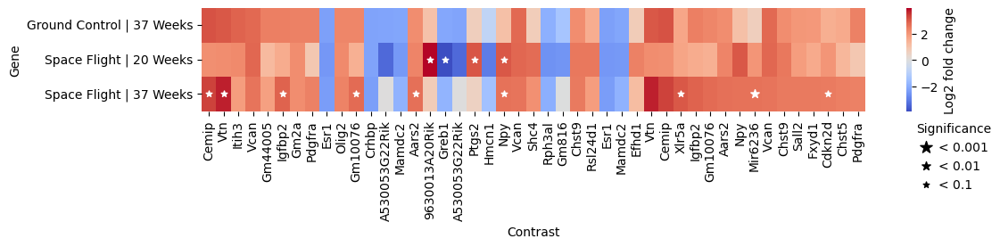

In [248]:
out_edgr_groups_snc = scflow.ax.run_deg_edgr(
    self.rna[(self.rna.obs["Senescent_Cell_Label"] == "Senescent")],
    col_batch, **keys[col_batch], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_groups_snc[0].variable[:25]))
out_edgr_batches_snc = out_edgr_groups_snc[0][(
    out_edgr_groups_snc[0].abs_log_fc > 1) & (
        out_edgr_groups_snc[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
# out_edgr_batches_snc_top = out_edgr_batches_snc.groupby("contrast").apply(
#     lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
#         :20]).set_index("variable", append=True).reset_index(
#             1, drop=True).rename_axis([col_condition, "variable"])
plt.show()

##### Just Aged SnCs

In [ ]:
out_edgr_contrasts_sncto, snc_degs_by_condition_age_ct = {}, {}
thresh_p_c, thresh_lfcabs_c = 0.05, 0.5  # thresholds
subs_old = self.rna.obs[col_age] == keys[col_age]["key_treatment"]
subs_sf = self.rna.obs[col_condition] == keys[col_condition]["key_treatment"]
# subs_ac = (self.rna.obs["Senescent_Cell_Label"] == "Senescent") & (
#     subs_old | subs_sf)
subs_ac = (self.rna.obs["Senescent_Cell_Label"] == "Senescent") & (subs_old)
out_edgr_contrasts_sncto["Overall"] = scflow.ax.run_deg_edgr(
        self.rna[subs_ac], col_condition,
        # col_covariate=col_age,
        **keys[col_condition],
        log2fc_thresh=0, n_top_vars=24,
        legend_loc="upper center", fig_title=f"Overall",
        wspace=0.25, bottom=0.3, hspace=1 if len(x) > 10 else 0.4, top=0.95,
        kws_xticks=dict(fontsize=10, rotation=45 if len(x) > 10 else None),
        col_celltype=col_celltype, col_sample=col_sample)
plt.show()
tmp = out_edgr_contrasts_sncto["Overall"][0]
tmp = tmp[(tmp.adj_p_value < thresh_p_c) & (
    tmp.abs_log_fc >= thresh_lfcabs_c)]  # filter by p & lfc
snc_degs_by_condition_age_ct["Overall"] = list(
    tmp.sort_values("adj_p_value", ascending=True).variable)
for x in self.rna.obs[col_celltype].unique():
    print(x)
    out_edgr_contrasts_sncto[x] = scflow.ax.run_deg_edgr(
        self.rna[(subs_ac) & (self.rna.obs[col_celltype] == x)],
        col_condition,
        # col_covariate=col_age,
        **keys[col_condition],
        log2fc_thresh=0, n_top_vars=24,
        legend_loc="upper center", fig_title=f"Senescent {x}",
        wspace=0.25, bottom=0.3, hspace=1 if len(x) > 10 else 0.4, top=0.95,
        kws_xticks=dict(fontsize=10, rotation=45 if len(x) > 10 else None),
        col_celltype=col_celltype, col_sample=col_sample)
    plt.show()
    tmp = out_edgr_contrasts_sncto[x][0]
    tmp = tmp[(tmp.adj_p_value < thresh_p_c) & (
        tmp.abs_log_fc >= thresh_lfcabs_c)]  # filter by p & lfc
    snc_degs_by_condition_age_ct[x] = list(tmp.sort_values(
            "adj_p_value", ascending=True).variable)
    del tmp
out_edgr_contrasts_snc_all_top = pd.concat([out_edgr_contrasts_sncto[x][
    0].set_index("variable").loc[snc_degs_by_condition_age_ct[
        x]] for x in out_edgr_contrasts_sncto], keys=out_edgr_contrasts_sncto,
                                           names=[col_celltype])
out_edgr_contrasts_snc_all = pd.concat([
    out_edgr_contrasts_sncto[x][0].set_index("variable")
    for x in out_edgr_contrasts_sncto], keys=out_edgr_contrasts_sncto,
                                       names=[col_celltype])
out_edgr_contrasts_snc_all_top

### More Specific Contrasts (`pyDESeq2`)

#### Group

In [ ]:
# pdata =  scflow.tl.create_pseudobulk(
#     self.rna, [col_sample, col_condition, col_age],
#     col_celltype, layer="counts", mode="sum")
# design = f"~{col_condition} + {col_age} + {col_condition} * {col_age}"
# # edgr = pt.tl.EdgeR(pdata, design=design)
# pds2 = pt.tl.PyDESeq2(adata=pdata, design=design)
# pds2.fit()
# key_control, key_treatment = [keys[col_condition][k] for k in [
#     "key_control", "key_treatment"]]
# key_control_cov, key_treatment_cov = [keys[col_age][k] for k in [
#     "key_control", "key_treatment"]]
# sf_old = {col_condition: key_treatment, col_age: key_treatment_cov}
# sf_yng = {col_condition: key_treatment, col_age: key_control_cov}
# gc_old = {col_condition: key_control, col_age: key_treatment_cov}
# gc_yng = {col_condition: key_control, col_age: key_control_cov}

# # Spaceflight-Specific Age DEGs
# spaceflight_specfic_age_degs = (pds2.cond(**sf_old) - pds2.cond(
#     **sf_yng)) - (pds2.cond(**gc_old) - pds2.cond(**gc_yng))
# interaction_res_df = pds2.test_contrasts(spaceflight_specfic_age_degs)
# pds2.plot_volcano(interaction_res_df, log2fc_thresh=0)

# # Age-Specific Spaceflight DEGs
# age_specfic_sf_degs = (pds2.cond(**sf_old) - pds2.cond(**gc_old)) - (
#     pds2.cond(**sf_yng) - pds2.cond(**gc_yng))
# interaction_res_df2 = pds2.test_contrasts(age_specfic_sf_degs)
# pds2.plot_volcano(interaction_res_df2, log2fc_thresh=0)

# # Old vs. Young Spaceflight
# age_sf_ix = pds2.cond(**sf_old) - pds2.cond(**sf_yng)
# interaction_res_df3 = pds2.test_contrasts(age_sf_ix)
# pds2.plot_volcano(interaction_res_df3, log2fc_thresh=0)

# # Old vs. Young GC
# age_gc_ix = pds2.cond(**gc_old) - pds2.cond(**gc_yng)
# interaction_res_df4 = pds2.test_contrasts(age_gc_ix)
# pds2.plot_volcano(interaction_res_df4, log2fc_thresh=0)

# # SF vs. GC Old
# cond_old_ix = pds2.cond(**sf_old) - pds2.cond(**gc_old)
# interaction_res_df5 = pds2.test_contrasts(cond_old_ix)
# pds2.plot_volcano(interaction_res_df5, log2fc_thresh=0)

# # SF vs. GC Young
# cond_yng_ix = pds2.cond(**sf_yng) - pds2.cond(**gc_yng)
# interaction_res_df6 = pds2.test_contrasts(cond_yng_ix)
# pds2.plot_volcano(interaction_res_df6, log2fc_thresh=0)

# # Compare
# thresh_lfc, thresh_p = 1, 0.001
# sf_deg_res_df_old = interaction_res_df5[(
#     interaction_res_df5.adj_p_value < thresh_p) & (
#         interaction_res_df5.log_fc.abs() >= thresh_lfc)].set_index(
#             "variable")
# sf_deg_res_df_yng = interaction_res_df6[(
#     interaction_res_df6.adj_p_value < thresh_p) & (
#         interaction_res_df6.log_fc.abs() >= thresh_lfc)].set_index(
#             "variable")
# sf_deg_res = pd.concat([sf_deg_res_df_old, sf_deg_res_df_yng],
#                        keys=["Old", "Young"], names=["Age Group"])
# sf_deg_res.loc[:, "log_fc_abs"] = sf_deg_res.log_fc.abs()
# sf_deg_res = sf_deg_res.sort_values("log_fc_abs", ascending=False)[[
#     "log_fc", "adj_p_value"]].unstack(0)
# print("SF DEGs in Both Young & Old: ", sf_deg_res.dropna().index.values)
# print("\n\nSF DEGs in Just Young", list(sf_deg_res_df_yng.index.difference(
#     sf_deg_res_df_old.index)), "\n\n")
# print("SF DEGs in Just Old", list(sf_deg_res_df_old.index.difference(
#     sf_deg_res_df_yng.index)), "\n\n")
# sf_deg_res.replace(np.nan, "")

# # Marker Set Overlap
# print("Both: ", marker_gene_sets.apply(
#     lambda i: set(sf_deg_res.dropna().index).intersection(set(i))).apply(
#         lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")
# print("Young: ", marker_gene_sets.apply(
#     lambda i: sf_deg_res_df_yng.index.difference(
#         sf_deg_res_df_old.index).intersection(set(i))).apply(
#         lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")
# print("Old: ", marker_gene_sets.apply(
#     lambda i: sf_deg_res_df_old.index.difference(
#         sf_deg_res_df_yng.index).intersection(set(i))).apply(
#         lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")

#### SnCs

##### Old

In [ ]:
# Setup
design = (f"~{col_condition} + Senescent_Cell_Label + "
          f"{col_condition} * Senescent_Cell_Label")
pdata2 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, "Senescent_Cell_Label"],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pds2_snc_old = pt.tl.PyDESeq2(adata=pdata2, design=design)
pds2_snc_old.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_treatment_cov}
sf_ns = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_control_cov}
gc_snc = {col_condition: key_control,
          "Senescent_Cell_Label": key_treatment_cov}
gc_ns = {col_condition: key_control, "Senescent_Cell_Label": key_control_cov}

# SnC DEGs
res_df_snc = pds2_snc_old.test_contrasts(pds2_snc_old.contrast(
    column="Senescent_Cell_Label", baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc[res_df_snc.adj_p_value < 0.001].head(10))
pds2_snc_old.plot_volcano(res_df_snc, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs = (pds2_snc_old.cond(
    **sf_sc) - pds2_snc_old.cond(**sf_ns)) - (
        pds2_snc_old.cond(**gc_snc) - pds2_snc_old.cond(**gc_ns))
interaction_res_df_snc_sf = pds2_snc_old.test_contrasts(
    spaceflight_specfic_snc_degs)
print(interaction_res_df_snc_sf[
    interaction_res_df_snc_sf.adj_p_value < 0.001].head(10))
pds2_snc_old.plot_volcano(interaction_res_df_snc_sf, log2fc_thresh=0)

##### Young

In [ ]:
# Setup
design = (f"~{col_condition} + Senescent_Cell_Label + "
          f"{col_condition} * Senescent_Cell_Label")
pdata2 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, "Senescent_Cell_Label"],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pds2_snc_yng = pt.tl.PyDESeq2(adata=pdata2, design=design)
pds2_snc_yng.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_treatment_cov}
sf_ns = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_control_cov}
gc_snc = {col_condition: key_control,
          "Senescent_Cell_Label": key_treatment_cov}
gc_ns = {col_condition: key_control, "Senescent_Cell_Label": key_control_cov}

# SnC DEGs
res_df_snc = pds2_snc_yng.test_contrasts(pds2_snc_yng.contrast(
    column="Senescent_Cell_Label", baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc[res_df_snc.adj_p_value < 0.001].head(10))
pds2_snc_yng.plot_volcano(res_df_snc, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs = (pds2_snc_yng.cond(
    **sf_sc) - pds2_snc_yng.cond(**sf_ns)) - (
        pds2_snc_yng.cond(**gc_snc) - pds2_snc_yng.cond(**gc_ns))
interaction_res_df_snc_sf = pds2_snc_yng.test_contrasts(
    spaceflight_specfic_snc_degs)
pds2_snc_yng.plot_volcano(interaction_res_df_snc_sf, log2fc_thresh=0)

#### SnCs (More Permissive Threshold)

In [ ]:
# Compare Less & More Permissive Thresholds
print("Less & More Permissive SnC Threshold: ", self.rna.obs[[
    "Senescent_Cell_Label", f"Senescent_Cell_Label_{use_metric}_{p_h}"
    ]].value_counts())
sen_lab = f"Senescent_Cell_Label_{use_metric}_{p_h}"

# Setup
design = (f"~{col_condition} + {sen_lab} + "
          f"{col_condition} * {sen_lab}")
pdata2_3 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, sen_lab],
    col_celltype, layer="counts", mode="sum")
pds2_snc_old_3 = pt.tl.PyDESeq2(adata=pdata2_3, design=design)
pds2_snc_old_3.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment, sen_lab: key_treatment_cov}
sf_ns = {col_condition: key_treatment, sen_lab: key_control_cov}
gc_snc = {col_condition: key_control, sen_lab: key_treatment_cov}
gc_ns = {col_condition: key_control, sen_lab: key_control_cov}

# SnC DEGs
res_df_snc_3 = pds2_snc_old_3.test_contrasts(pds2_snc_old_3.contrast(
    column=sen_lab, baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc_3[res_df_snc_3.adj_p_value < 0.001].head(10))
pds2_snc_old_3.plot_volcano(res_df_snc_3, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs_3 = (pds2_snc_old_3.cond(
    **sf_sc) - pds2_snc_old_3.cond(**sf_ns)) - (
        pds2_snc_old_3.cond(**gc_snc) - pds2_snc_old_3.cond(**gc_ns))
interaction_res_df_snc_sf_3 = pds2_snc_old_3.test_contrasts(
    spaceflight_specfic_snc_degs_3)
pds2_snc_old_3.plot_volcano(interaction_res_df_snc_sf_3, log2fc_thresh=0)

# SnC GEX Profiles

## Pathway Analysis

In [ ]:
names = gp.get_library_name()
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              "MSigDB_Hallmark_2020",  # "DGIdb_Drug_Targets_2024",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reimport pdb;actome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
gene_sets = dict(zip(["up", "down"], [[
    f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
        f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
    for i in ["up", "down"]]))


def fx_replace_string(string):
    """Make short version of pathway terms."""
    string = re.sub("aging:([0-9]+)", "aging", re.sub(
        "([0-9]+) months v ([0-9]+) mo(nths)?", "\\1 v \\2 mo.", re.sub(
            "SRP[0-9]+ ", "", re.sub("GSE[0-9]+ ", "", string))))
    string = re.sub(".*.xlsx.", "", re.sub(
        ".*Supplementary Data ..", "", re.sub(
            "PMID([0-9])+", "", re.sub("([0-9]+) years v ([0-9]+) years",
                                       "\\1 v \\2 yrs.", string))))
    string = re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
        ".*.XLSX", "", re.sub(
            ".*Supplementary Table [0-9]+[-]?", "", string))))
    return string

### Endrichr

In [ ]:
out_pathway_snc_edgr_contrasts = scflow.ax.run_enrichr(
    out_edgr_contrasts_snc_all_top, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string, title="Overall")

### SnC vs. Not

In [ ]:
# res_dc_ulm = scflow.ax.run_decoupler_ulm(
#         self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
#         # "Senescent_Cell_Label_by_Type",
#         # "Senescent_Cell_Label",
#         col_condition, col_condition="Senescent_Cell_Label_by_Type",
#         species=species, resource="hallmark",
#         top=0.95, hspace=1, wspace=0.5, figsize=(15, 10))

#### Pathway Set = Progeny

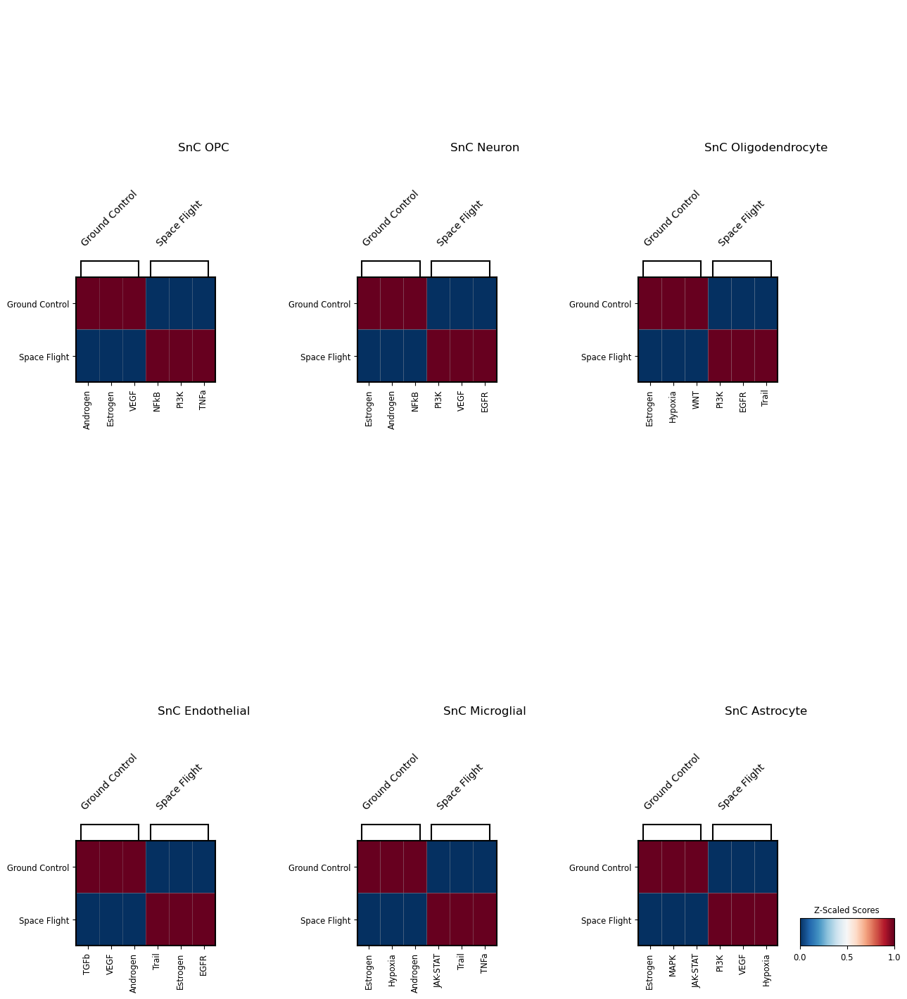

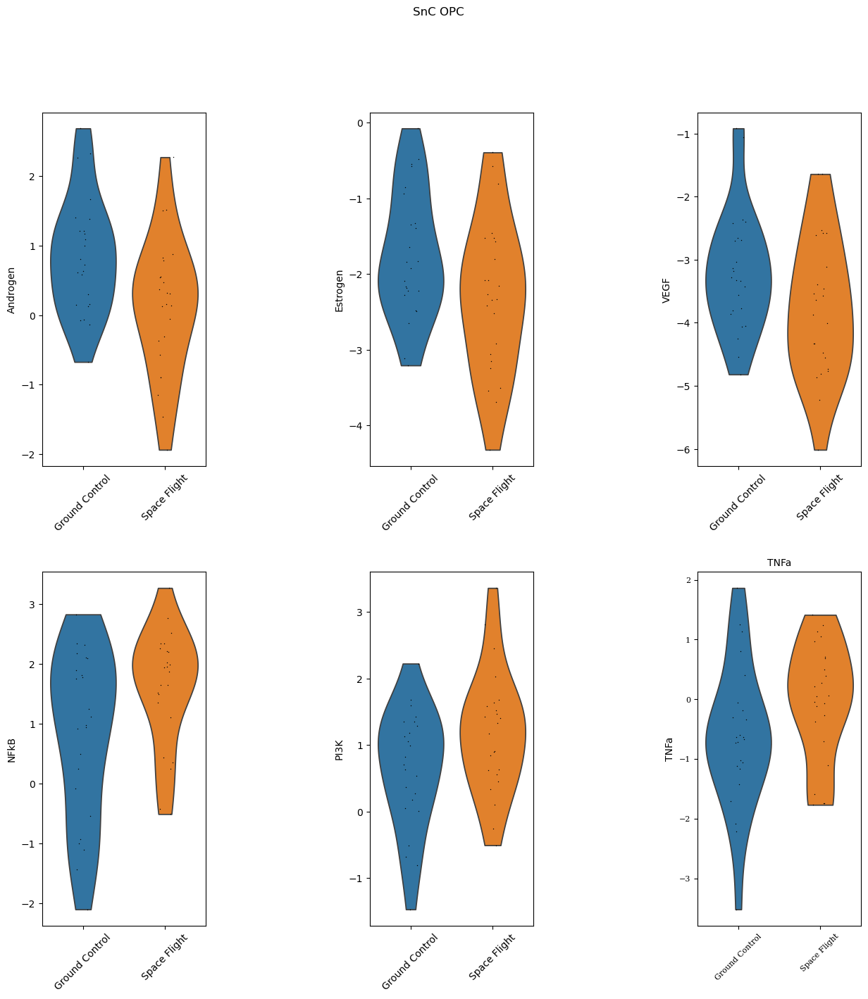

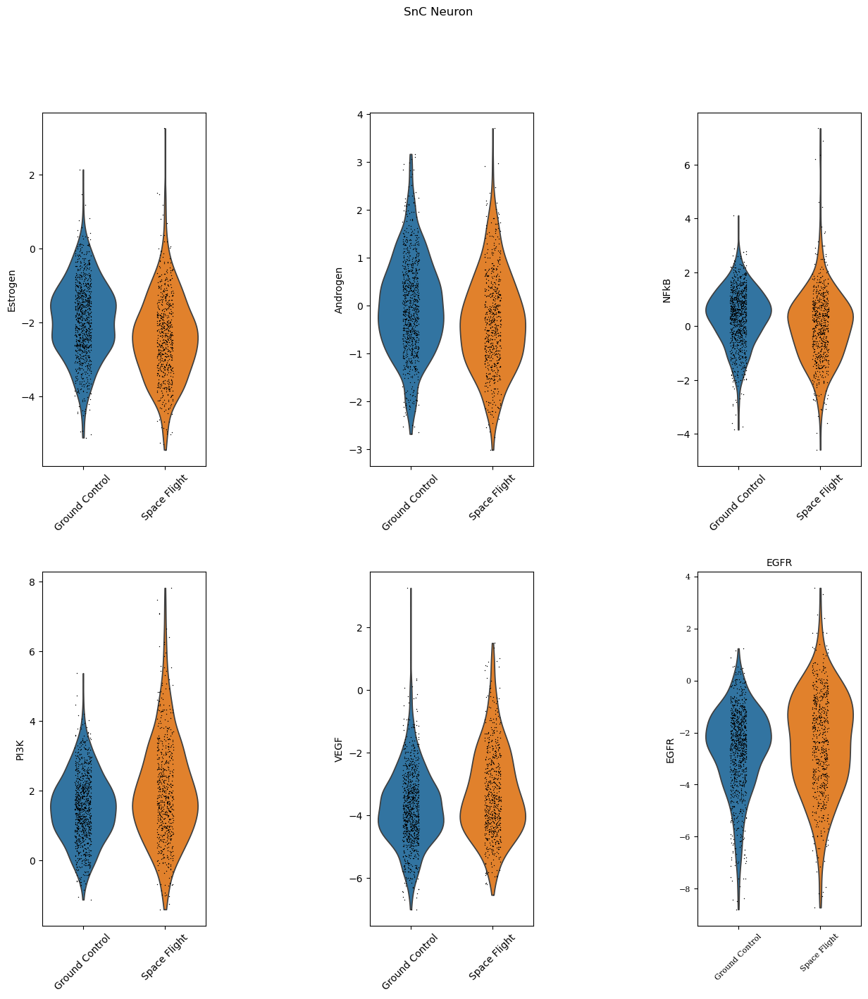

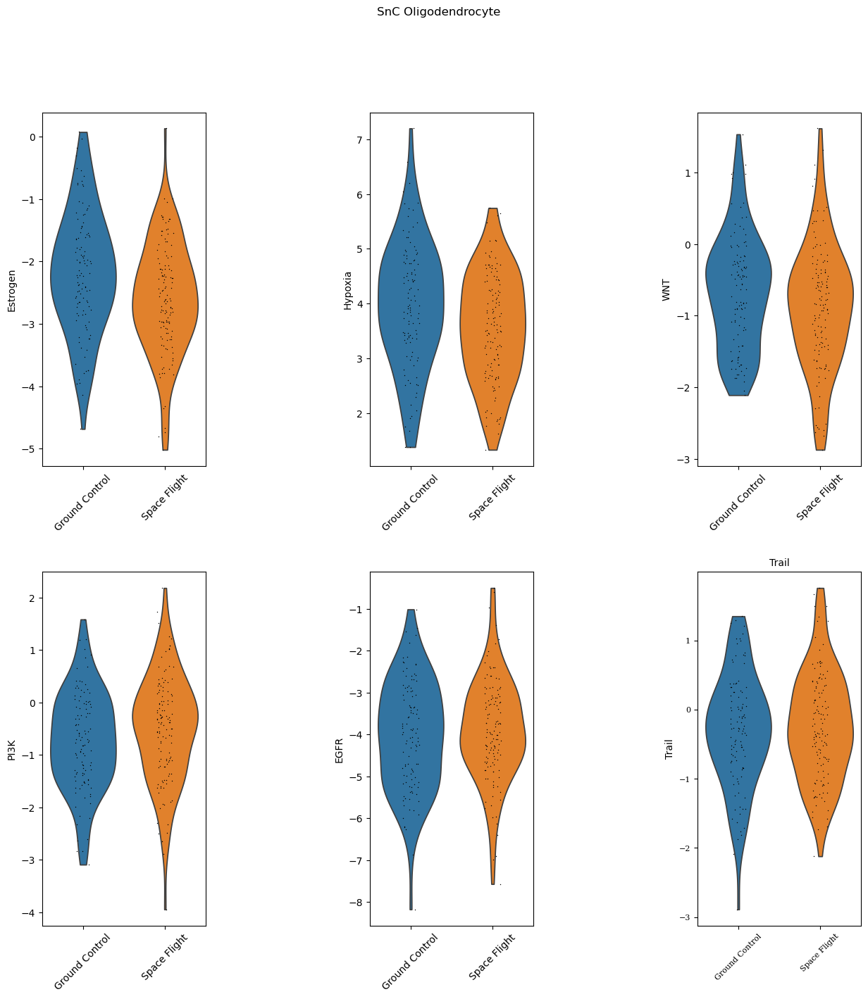

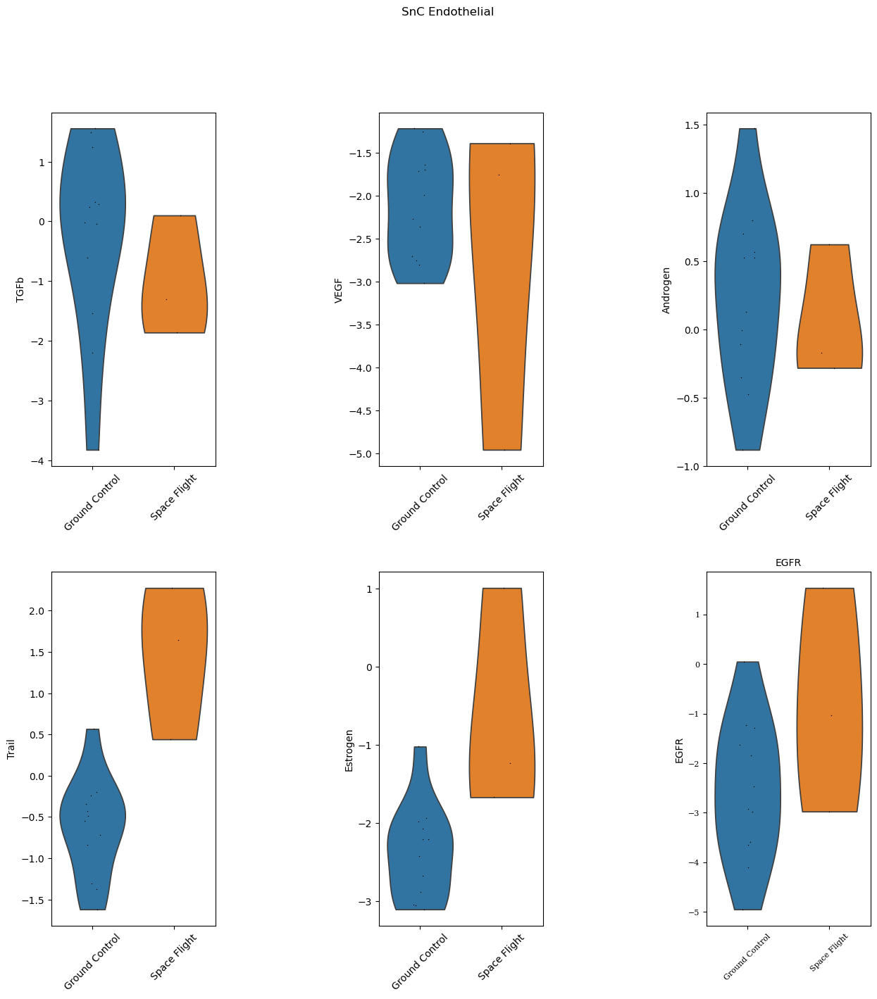

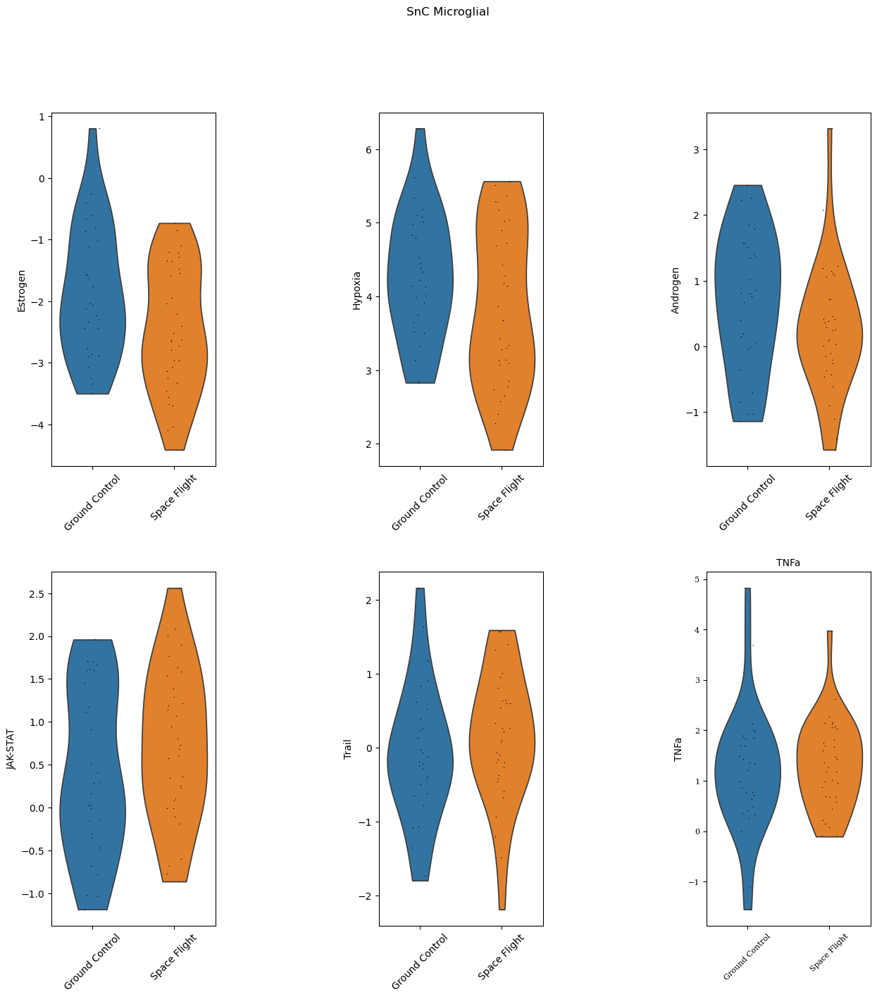

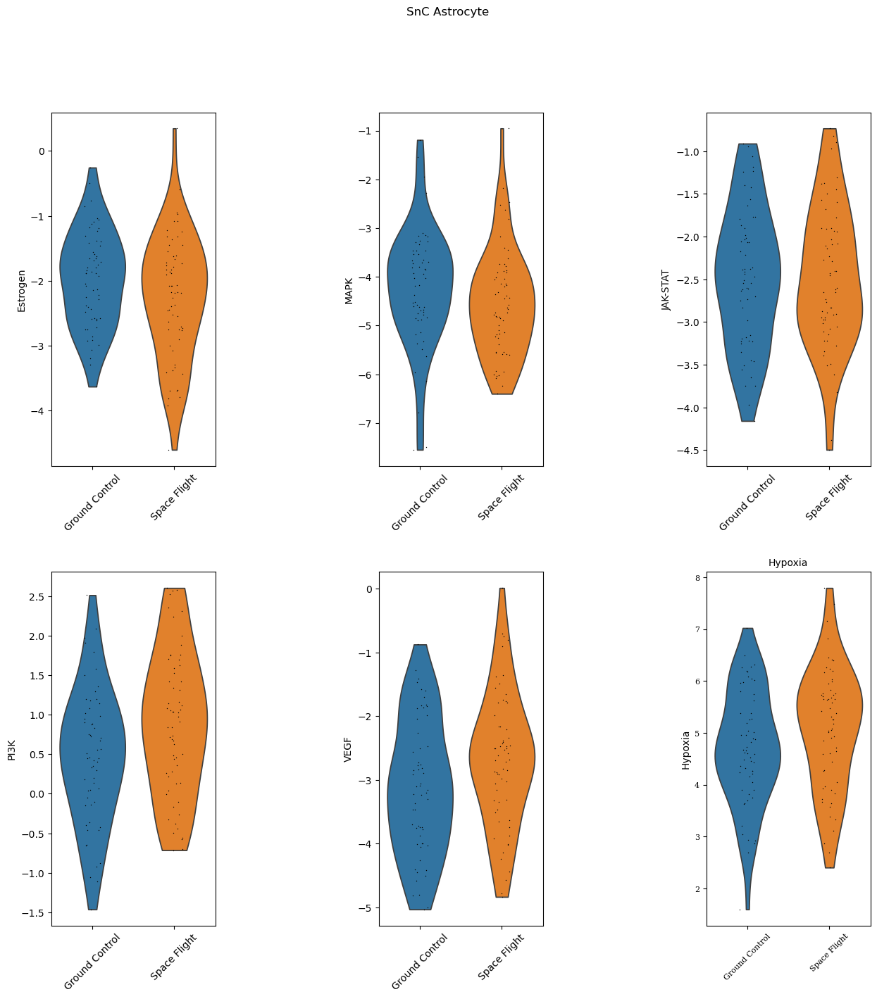

SnC OPC              Ground Control       [Androgen, Estrogen, VEGF]
                     Space Flight                 [NFkB, PI3K, TNFa]
SnC Neuron           Ground Control       [Estrogen, Androgen, NFkB]
                     Space Flight                 [PI3K, VEGF, EGFR]
SnC Oligodendrocyte  Ground Control         [Estrogen, Hypoxia, WNT]
                     Space Flight                [PI3K, EGFR, Trail]
SnC Endothelial      Ground Control           [TGFb, VEGF, Androgen]
                     Space Flight            [Trail, Estrogen, EGFR]
SnC Microglial       Ground Control    [Estrogen, Hypoxia, Androgen]
                     Space Flight            [JAK-STAT, Trail, TNFa]
SnC Astrocyte        Ground Control       [Estrogen, MAPK, JAK-STAT]
                     Space Flight              [PI3K, VEGF, Hypoxia]
dtype: object


reference      stat  meanchange          pval          padj
annotation_scanvi_collapsed Condition      name                                                                
SnC Neuron                  Ground Control Estrogen      rest  9.500359    0.482193  6.141583e-21  8.598216e-20
                                           Androgen      rest  7.283937    0.341144  4.741372e-13  1.659480e-12
                                           NFkB          rest  5.826446    0.328417  6.703352e-09  1.876939e-08
                                           MAPK          rest  5.476003    0.360809  4.954974e-08  1.156161e-07
                                           JAK-STAT      rest  3.427728    0.188864  6.223002e-04  1.244600e-03
                            Space Flight   PI3K          rest  6.765508    0.479925  2.158089e-11  1.510663e-10
                                           VEGF          rest  6.238393    0.465892  6.091033e-10  2.842482e-09
                                           EGFR          rest  2.727422    0.276192  6.475309e-03  1.133179e-02
SnC Oligodendrocyte         Ground Control Estrogen      rest  3.334559    0.414669  1.005425e-03  1.407595e-02
                                           Hypoxia       rest  2.820404    0.404899  5.249221e-03  3.674455e-02

In [17]:
res_dc_ulm = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_condition, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="progeny",
        hspace=0.5, wspace=0.1, top=1, figsize=(15, 15))
res_dc_ulm_scores = pd.concat([res_dc_ulm[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm[0]],
                              keys=res_dc_ulm[0], names=[col_celltype])
res_dc_ulm_pathways = pd.concat([pd.Series(res_dc_ulm[0][x][2])
                                 for x in res_dc_ulm[0]], keys=res_dc_ulm[0])
print(res_dc_ulm_pathways)
res_dc_ulm_scores[res_dc_ulm_scores.padj < 0.05]

#### Pathway Set = Hallmark

##### Cell Type Comparisons (Separately by Condition)

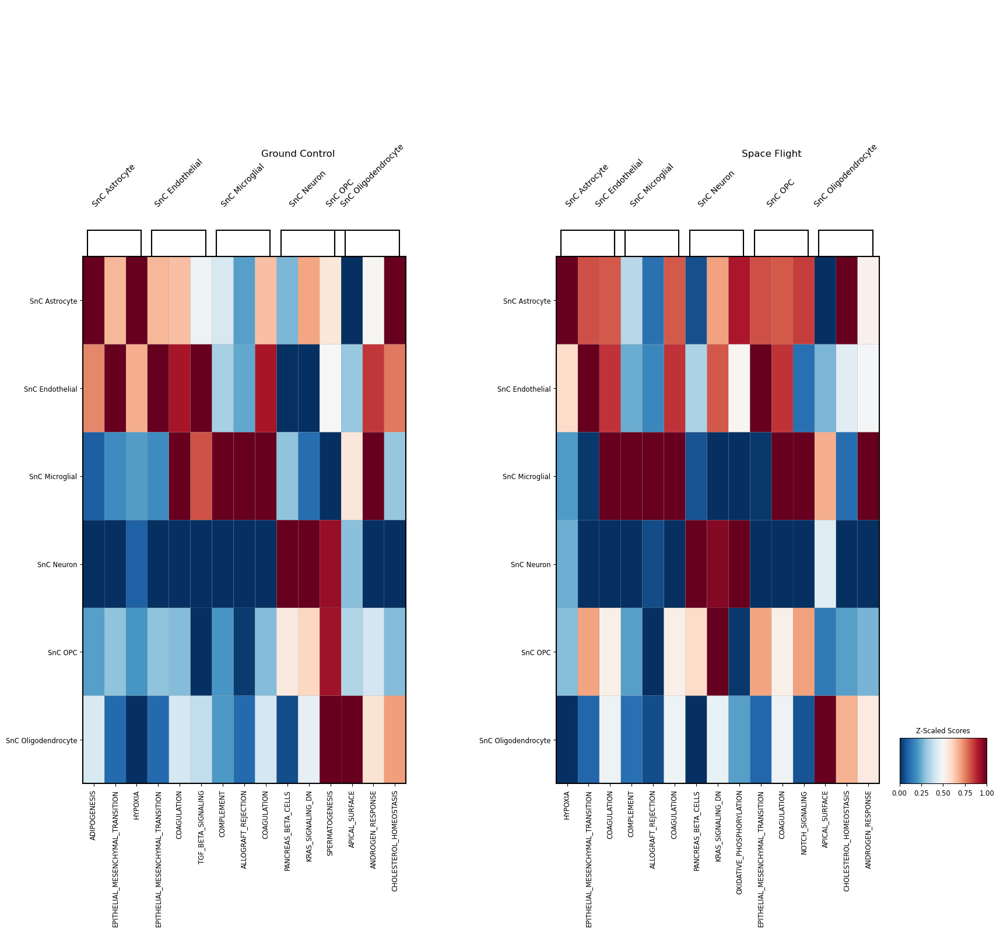

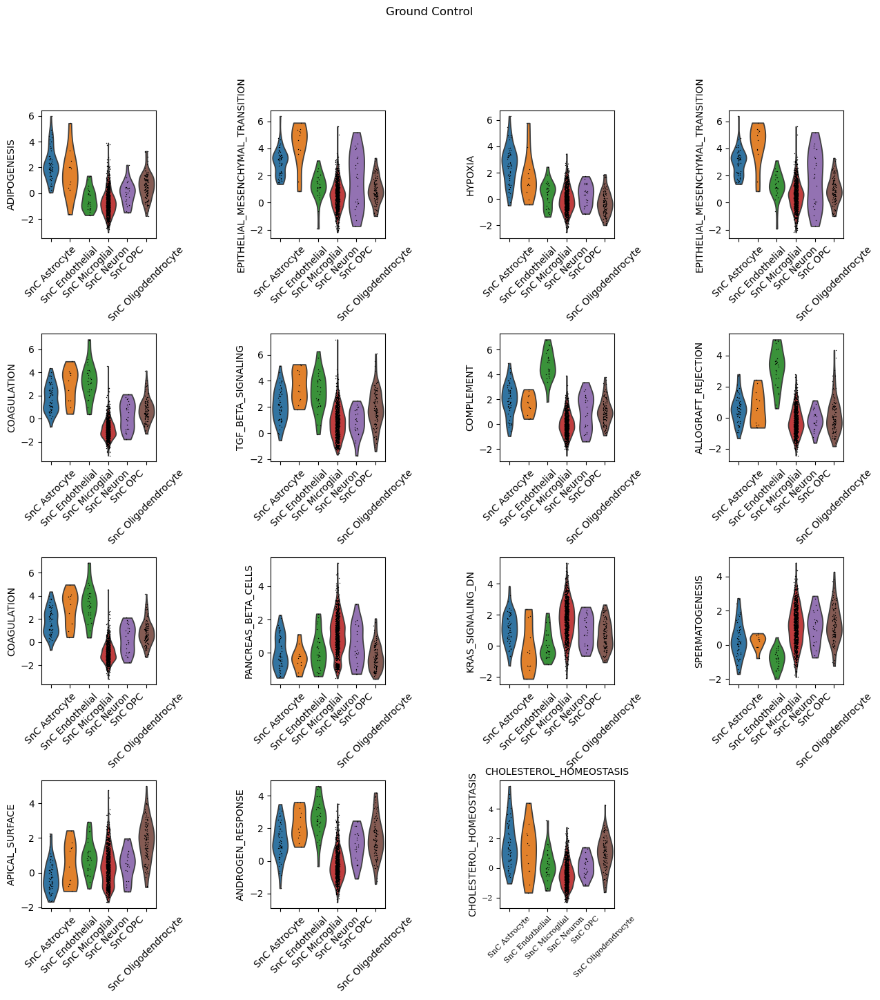

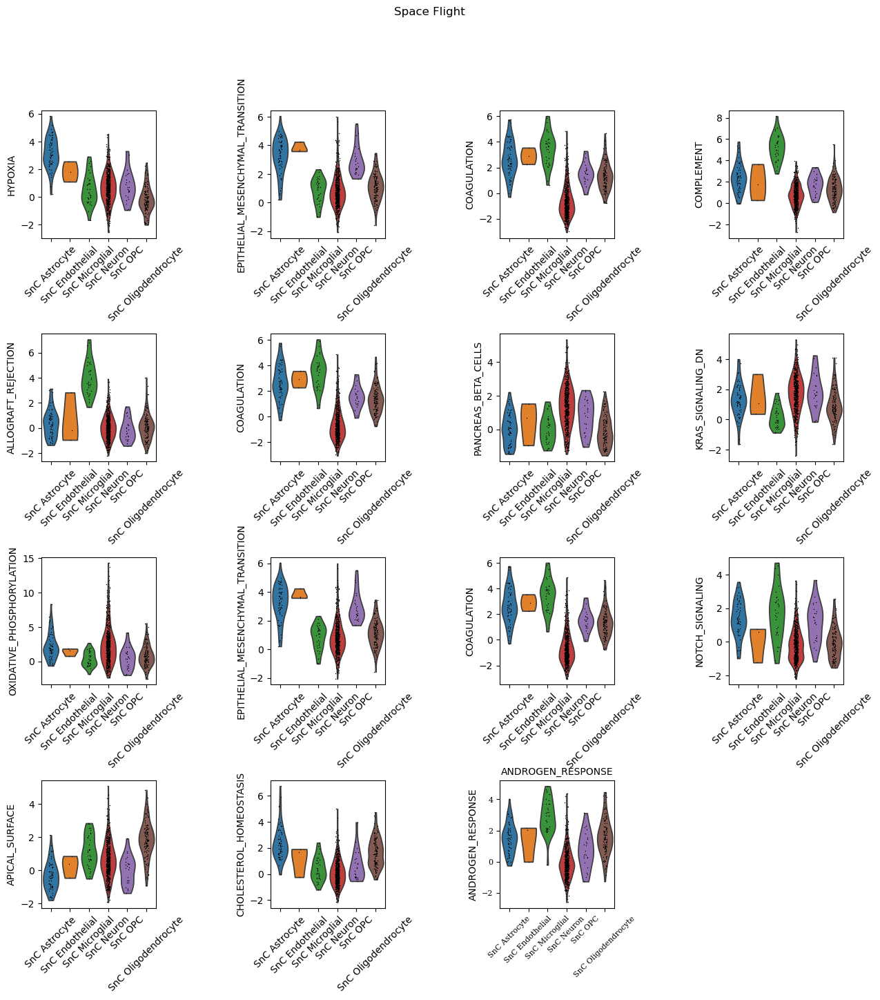

reference       stat  meanchange           pval           padj
Condition      Condition           name                                                                                            
Ground Control SnC Neuron          PANCREAS_BETA_CELLS                    rest  23.400789    1.129777  5.475465e-106  2.105948e-105
                                   KRAS_SIGNALING_DN                      rest  19.020813    0.990081   8.497482e-74   2.023210e-73
                                   SPERMATOGENESIS                        rest   7.701411    0.409910   2.159876e-14   2.571280e-14
                                   UV_RESPONSE_DN                         rest   7.640953    0.584277   3.433554e-14   3.992505e-14
                                   PI3K_AKT_MTOR_SIGNALING                rest   3.610673    0.194966   3.135468e-04   3.335605e-04
               SnC Oligodendrocyte APICAL_SURFACE                         rest   9.892470    1.479950   3.049694e-19   1.524847e-17
                                   ANDROGEN_RESPONSE                      rest   9.168459    1.453181   3.794833e-17   9.487084e-16
                                   CHOLESTEROL_HOMEOSTASIS                rest   8.785988    1.258689   4.675116e-16   4.789480e-15
                                   COAGULATION                            rest   8.707741    1.390880   1.046430e-15   8.720249e-15
                                   APOPTOSIS                              rest   8.605074    1.120052   1.530624e-15   1.093303e-14
                                   IL6_JAK_STAT3_SIGNALING                rest   7.754440    0.914553   3.361989e-13   2.101243e-12
                                   REACTIVE_OXYGEN_SPECIES_PATHWAY        rest   7.726158    0.886569   4.010254e-13   2.227919e-12
                                   TNFA_SIGNALING_VIA_NFKB                rest   7.708425    0.982116   6.659325e-13   3.207918e-12
                                   MTORC1_SIGNALING                       rest   7.658347    1.077580   7.057420e-13   3.207918e-12
                                   P53_PATHWAY                            rest   7.350477    0.886080   4.119304e-12   1.584348e-11
                                   HEME_METABOLISM                        rest   7.324455    1.066887   4.776292e-12   1.705819e-11
                                   IL2_STAT5_SIGNALING                    rest   7.219940    1.058607   8.782415e-12   2.927472e-11
                                   FATTY_ACID_METABOLISM                  rest   6.941139    0.863201   4.627470e-11   1.446084e-10
                                   ADIPOGENESIS                           rest   6.867394    1.035158   7.393617e-11   2.174593e-10
                                   DNA_REPAIR                             rest   6.833583    0.695743   8.277979e-11   2.299439e-10
                                   INTERFERON_GAMMA_RESPONSE              rest   6.723690    0.893302   1.530685e-10   4.028119e-10
                                   XENOBIOTIC_METABOLISM                  rest   6.673706    0.853150   2.061652e-10   5.154130e-10
                                   ESTROGEN_RESPONSE_LATE                 rest   5.694959    0.734036   4.037235e-08   9.175534e-08
                                   UV_RESPONSE_UP                         rest   5.630740    0.701102   5.591934e-08   1.215638e-07
                                   INFLAMMATORY_RESPONSE                  rest   5.622835    0.784142   6.019592e-08   1.254082e-07
                                   ESTROGEN_RESPONSE_EARLY                rest   5.562736    0.685233   8.119736e-08   1.623947e-07
                                   TGF_BETA_SIGNALING                     rest   4.868522    0.892406   2.164943e-06   4.163353e-06
                                   COMPLEMENT                             rest   4.703802    0.737490   4.706872e-06   8.716430e-06
                                   E2F_TARGETS                            rest   4.151010    0.440538   4.759

In [34]:
res_dc_ulm_hm_sfct = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        "Senescent_Cell_Label_by_Type", col_condition=col_condition,
        species=species, resource="hallmark", title_position=0.8,
        hspace=0.5, wspace=0.1, top=1, figsize=(20, 15))
res_dc_ulm_hm_sfct_scores = pd.concat([res_dc_ulm_hm_sfct[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm_hm_sfct[0]],
                              keys=res_dc_ulm_hm_sfct[0],
                              names=[col_condition])
res_dc_ulm_hm_sfct_scores[res_dc_ulm_hm_sfct_scores.padj < 0.01]

##### SF vs. GC

{'Ground Control': ['UNFOLDED_PROTEIN_RESPONSE'], 'Space Flight': ['COAGULATION', 'ADIPOGENESIS', 'APICAL_JUNCTION', 'MYOGENESIS', 'OXIDATIVE_PHOSPHORYLATION', 'TNFA_SIGNALING_VIA_NFKB', 'INFLAMMATORY_RESPONSE', 'KRAS_SIGNALING_DN', 'EPITHELIAL_MESENCHYMAL_TRANSITION']}
{'Ground Control': ['BILE_ACID_METABOLISM'], 'Space Flight': ['OXIDATIVE_PHOSPHORYLATION', 'ADIPOGENESIS', 'MYC_TARGETS_V1', 'MTORC1_SIGNALING', 'UV_RESPONSE_UP', 'FATTY_ACID_METABOLISM', 'GLYCOLYSIS', 'COMPLEMENT', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'APOPTOSIS']}
{'Space Flight': ['OXIDATIVE_PHOSPHORYLATION', 'ADIPOGENESIS', 'MTORC1_SIGNALING', 'MYC_TARGETS_V1', 'CHOLESTEROL_HOMEOSTASIS', 'XENOBIOTIC_METABOLISM', 'FATTY_ACID_METABOLISM', 'COAGULATION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'PEROXISOME']}
{'Space Flight': ['OXIDATIVE_PHOSPHORYLATION']}
{'Space Flight': ['OXIDATIVE_PHOSPHORYLATION', 'COAGULATION', 'ADIPOGENESIS', 'CHOLESTEROL_HOMEOSTASIS', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'G2M_CHECKPOINT', 'MYC_TARGETS_V1

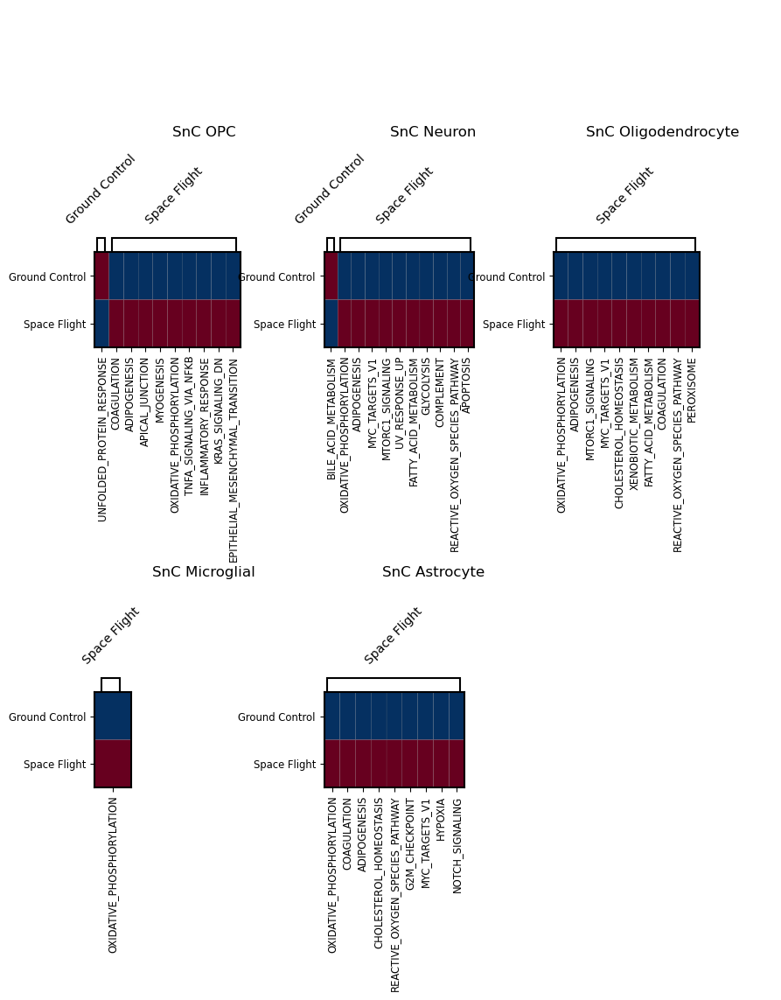

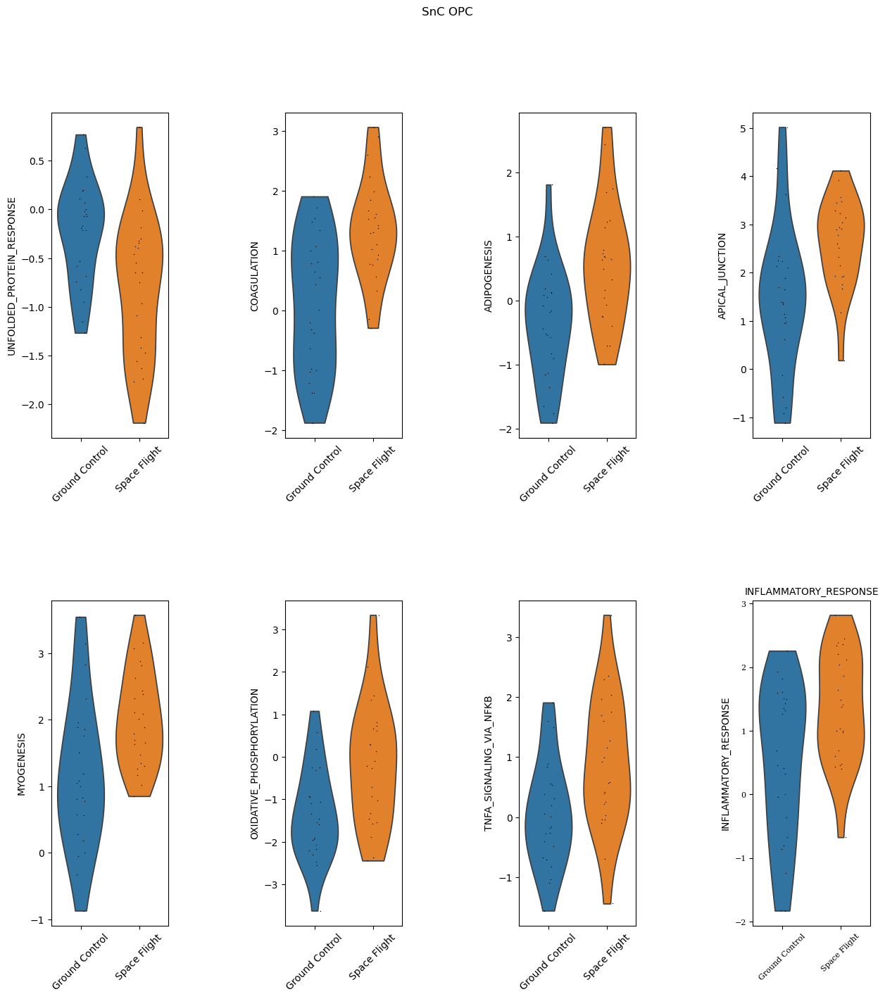

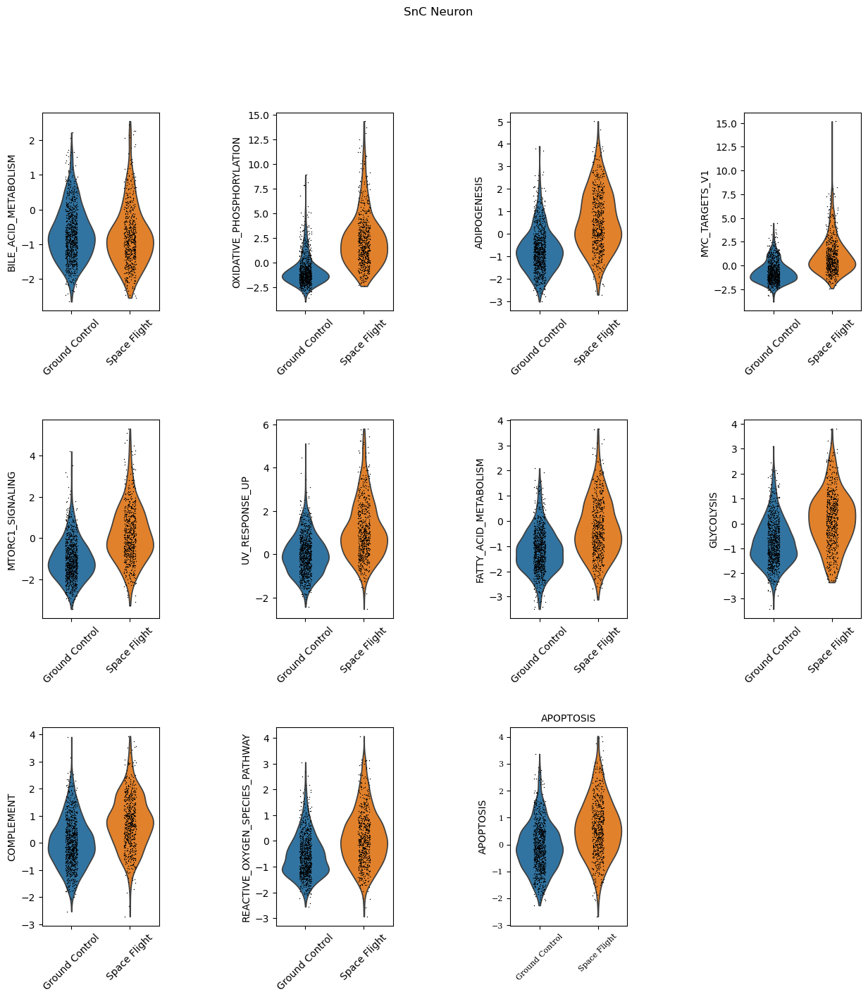

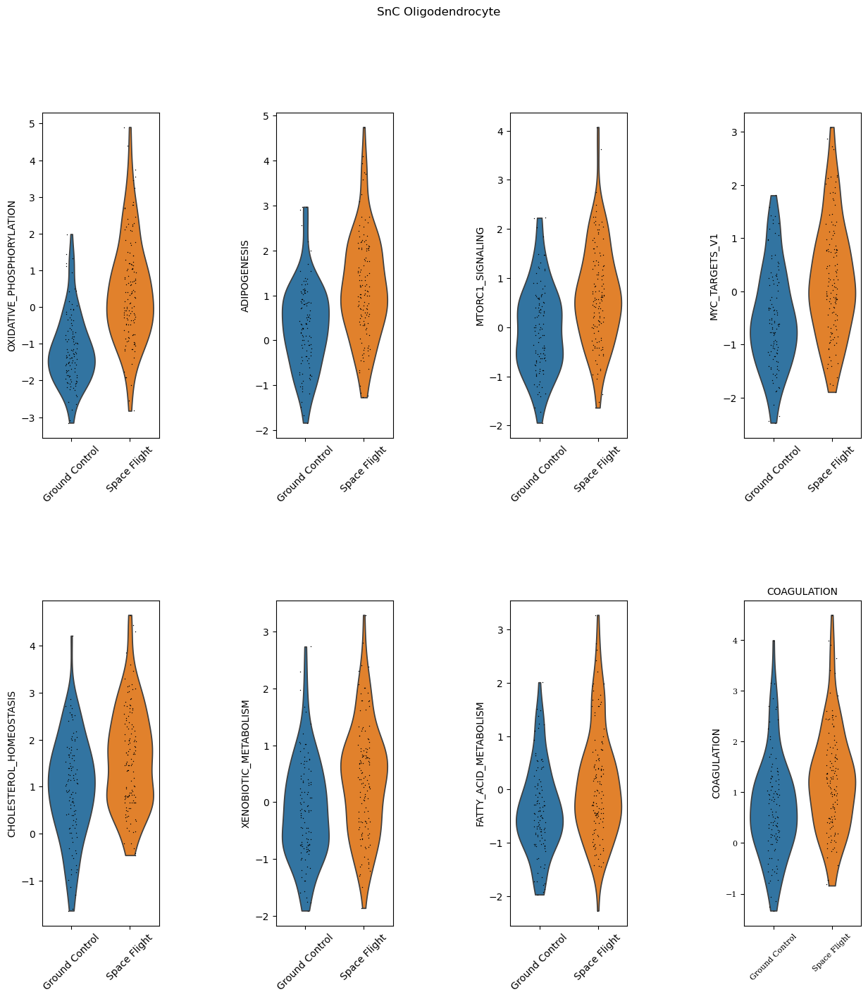



No significant contrasts for SnC Endothelial


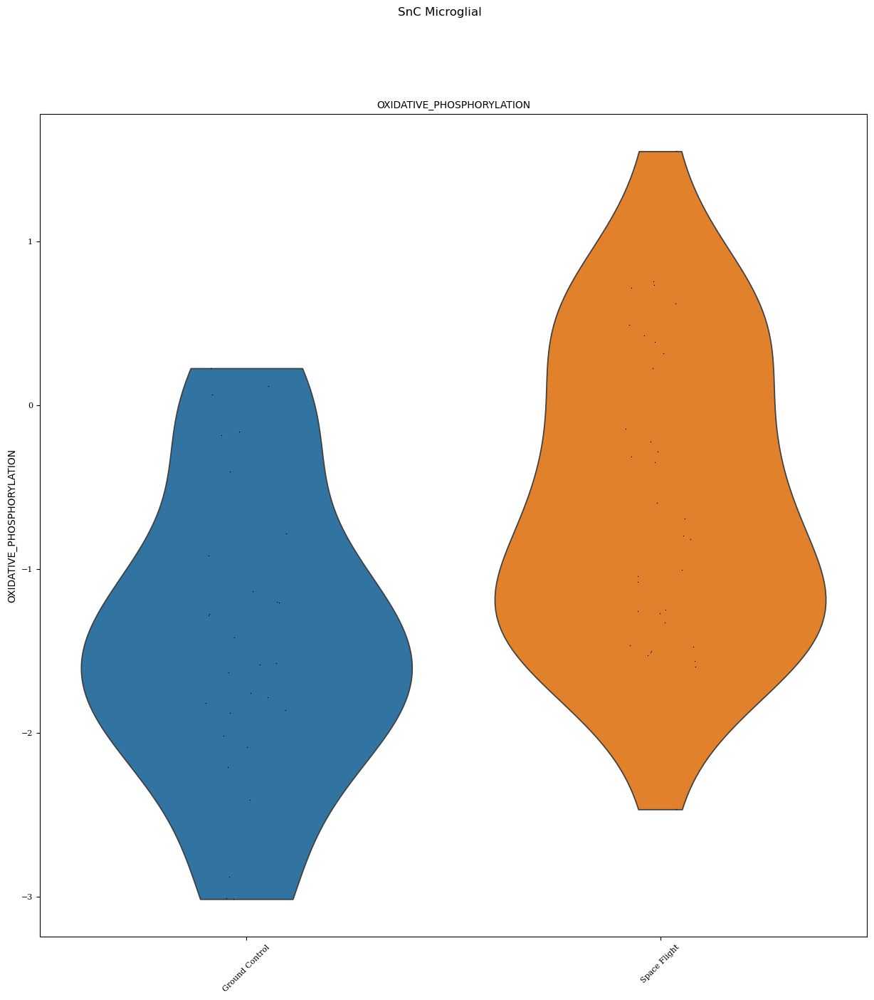

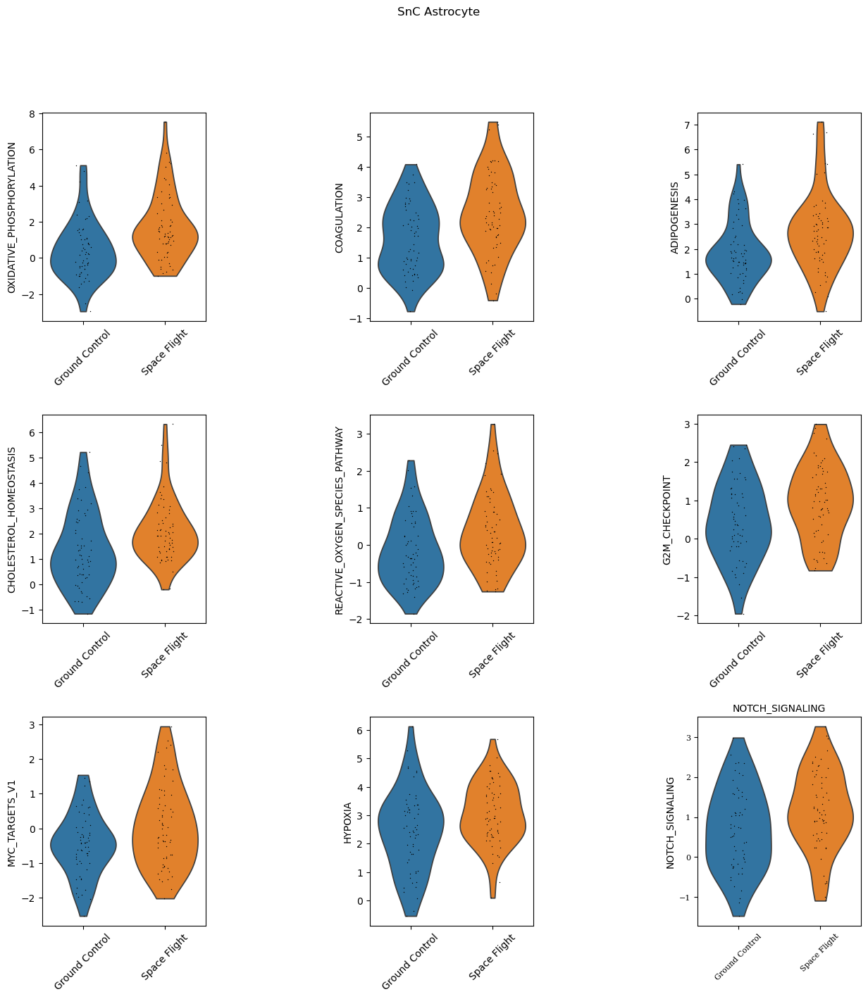

reference       stat  meanchange           pval           padj
annotation_scanvi_collapsed Condition      name                                                                                            
SnC OPC                     Ground Control UNFOLDED_PROTEIN_RESPONSE              rest   3.148356    0.573193   3.024018e-03   2.520015e-02
                            Space Flight   COAGULATION                            rest   4.250807    1.224458   1.137765e-04   5.688826e-03
                                           ADIPOGENESIS                           rest   3.642291    0.960716   6.879389e-04   1.719847e-02
                                           APICAL_JUNCTION                        rest   3.270742    1.186918   2.297720e-03   2.520015e-02
                                           MYOGENESIS                             rest   3.192599    0.861542   2.743790e-03   2.520015e-02
                                           OXIDATIVE_PHOSPHORYLATION              rest   3.166107    1.168319   2.837315e-03   2.520015e-02
                                           TNFA_SIGNALING_VIA_NFKB                rest   2.968633    0.852557   4.833602e-03   3.452573e-02
                                           INFLAMMATORY_RESPONSE                  rest   2.863359    0.876734   6.539631e-03   4.087270e-02
                                           KRAS_SIGNALING_DN                      rest   2.723633    0.883038   9.217372e-03   4.762634e-02
                                           EPITHELIAL_MESENCHYMAL_TRANSITION      rest   2.748511    1.207515   9.525267e-03   4.762634e-02
SnC Neuron                  Ground Control BILE_ACID_METABOLISM                   rest   2.184045    0.083742   2.908369e-02   3.462344e-02
                            Space Flight   OXIDATIVE_PHOSPHORYLATION              rest  24.867264    3.164509  3.803166e-106  1.901583e-104
                                           ADIPOGENESIS                           rest  19.737703    1.304684   6.612366e-75   1.653092e-73
                                           MYC_TARGETS_V1                         rest  18.769672    1.695644   9.097074e-68   1.516179e-66
                                           MTORC1_SIGNALING                       rest  18.158076    1.227961   5.942483e-65   7.428103e-64
                                           UV_RESPONSE_UP                         rest  17.160545    1.131422   9.721386e-59   9.721386e-58
                                           FATTY_ACID_METABOLISM                  rest  15.305557    0.881125   2.710785e-48   2.258987e-47
                                           GLYCOLYSIS                             rest  15.228719    0.891421   5.308639e-48   3.791885e-47
                                           COMPLEMENT                             rest  14.015157    0.755307   1.541680e-41   9.635502e-41
                                           REACTIVE_OXYGEN_SPECIES_PATHWAY        rest  12.728494    0.695763   7.303302e-35   4.057390e-34
                                           APOPTOSIS                              rest  12.638808    0.710934   1.770230e-34   8.851151e-34
                                           HYPOXIA                                rest  12.450656    0.718272   1.394905e-33   6.340479e-33
                                           ESTROGEN_RESPONSE_LATE                 rest  11.585392    0.618636   1.518012e-29   6.325051e-29
                                           MYOGENESIS                             rest  11.301750    0.694388   2.917710e-28   1.122196e-27
                                           UNFOLDED_PROTEIN_RESPONSE              rest   9.987212    0.547767   1.220594e-22   4.359265e-22
                                           CHOLESTEROL_HOMEOSTASIS                rest   9.915220    0.524105   2.416493e-22   8.054975e-22
                                           PI3K_AKT_MTOR_SIGNALING                rest   9.878976    0.642550   3.331014e-22   1.040942e-21
                 

In [93]:
res_dc_ulm_hm_sf = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_condition, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="hallmark", title_position=0.6,
        hspace=0.3, wspace=0.05, top=1, figsize=(10, 10), top_n=10)
res_dc_ulm_hm_sf_scores = pd.concat([res_dc_ulm_hm_sf[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm_hm_sf[0]],
                              keys=res_dc_ulm_hm_sf[0], names=[col_celltype])
res_dc_ulm_hm_sf_scores[res_dc_ulm_hm_sf_scores.padj < 0.05]

##### Batches

{'Space Flight | 37 Weeks': ['TNFA_SIGNALING_VIA_NFKB']}
{'Ground Control | 20 Weeks': ['PROTEIN_SECRETION', 'G2M_CHECKPOINT', 'MITOTIC_SPINDLE'], 'Ground Control | 37 Weeks': ['KRAS_SIGNALING_DN', 'BILE_ACID_METABOLISM', 'INTERFERON_GAMMA_RESPONSE'], 'Space Flight | 20 Weeks': ['OXIDATIVE_PHOSPHORYLATION', 'MYC_TARGETS_V1', 'PROTEIN_SECRETION'], 'Space Flight | 37 Weeks': ['OXIDATIVE_PHOSPHORYLATION', 'ADIPOGENESIS', 'FATTY_ACID_METABOLISM']}
{'Space Flight | 20 Weeks': ['OXIDATIVE_PHOSPHORYLATION'], 'Space Flight | 37 Weeks': ['OXIDATIVE_PHOSPHORYLATION', 'ADIPOGENESIS']}


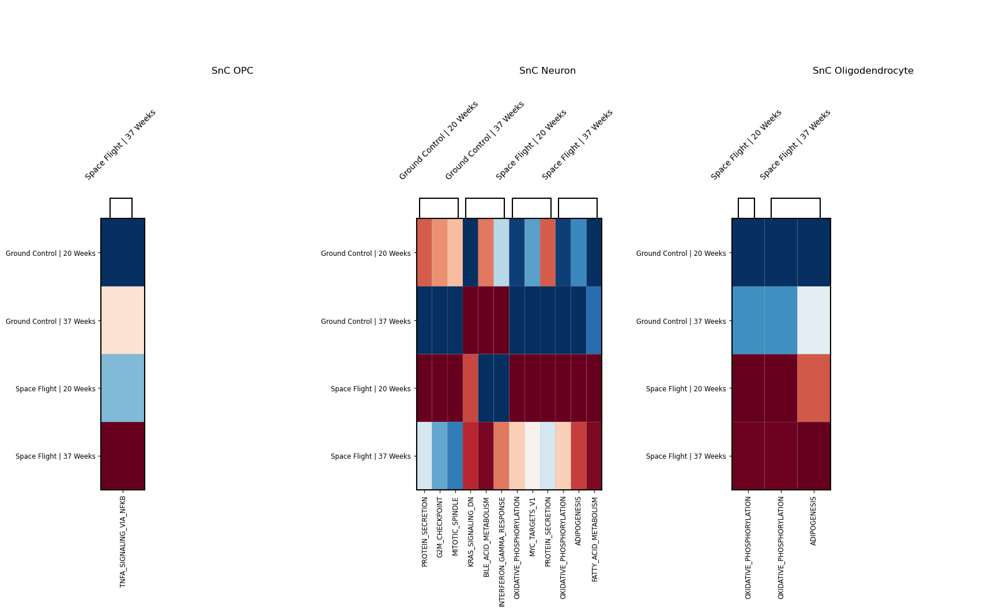

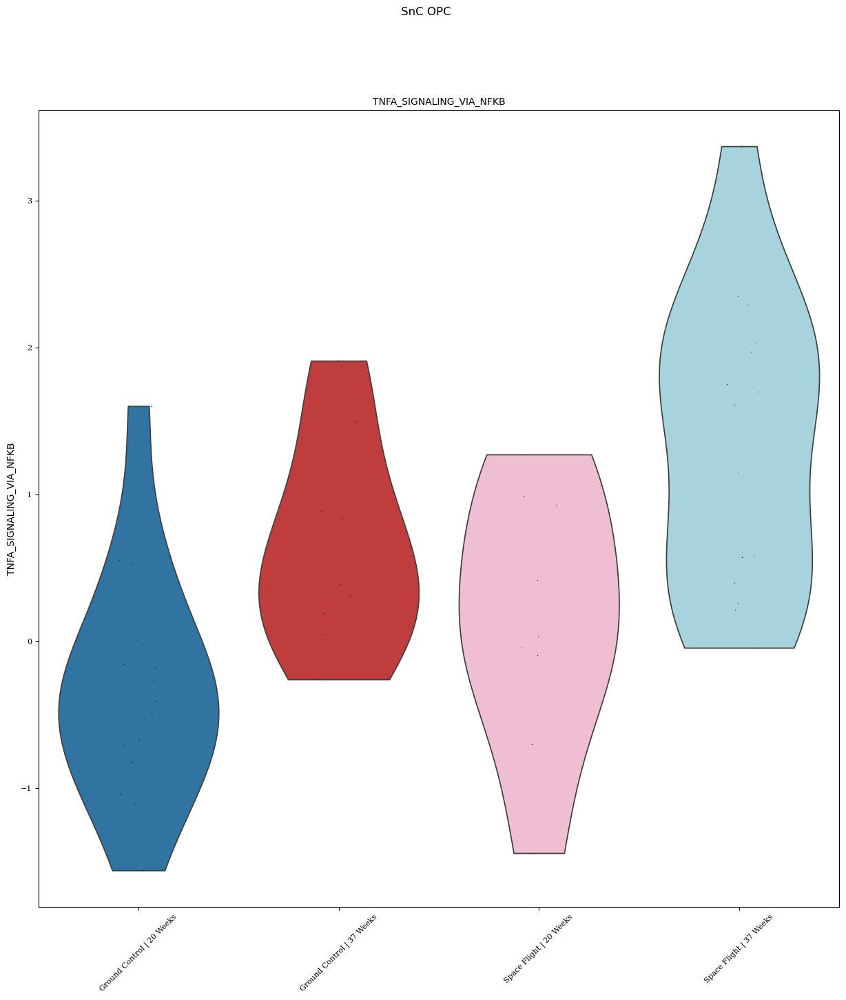

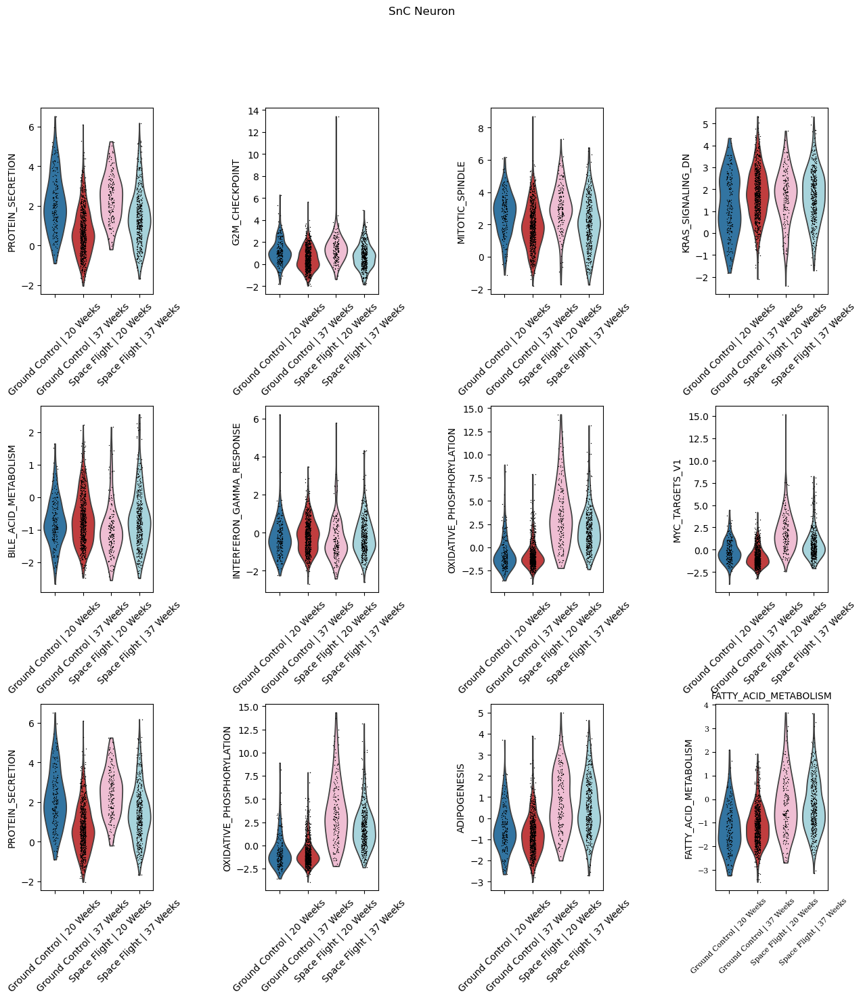

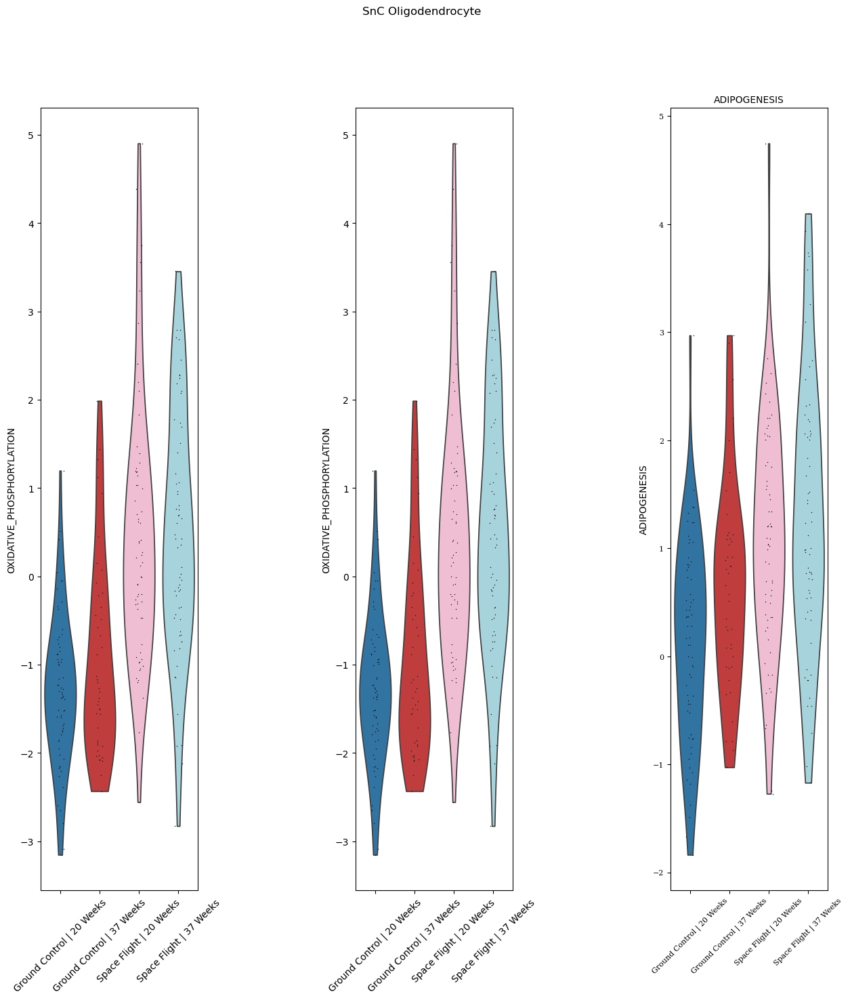



No significant contrasts for SnC Endothelial


No significant contrasts for SnC Microglial


No significant contrasts for SnC Astrocyte


reference       stat  meanchange          pval          padj
annotation_scanvi_collapsed Group                     name                                                                                          
SnC OPC                     Space Flight | 37 Weeks   TNFA_SIGNALING_VIA_NFKB                rest   3.754482    1.273201  8.266856e-04  4.133428e-02
SnC Neuron                  Ground Control | 20 Weeks PROTEIN_SECRETION                      rest   6.472875    0.932834  2.910390e-10  1.455195e-08
                                                      G2M_CHECKPOINT                         rest   3.891587    0.452939  1.172001e-04  4.852290e-04
                                                      MITOTIC_SPINDLE                        rest   3.873712    0.550420  1.261595e-04  4.852290e-04
                                                      TGF_BETA_SIGNALING                     rest   2.836990    0.348973  4.794746e-03  1.498358e-02
                            Ground Control | 37 Weeks KRAS_SIGNALING_DN                      rest   3.039969    0.188574  2.407457e-03  3.343691e-03
                                                      BILE_ACID_METABOLISM                   rest   2.228688    0.094523  2.598349e-02  3.331216e-02
                                                      INTERFERON_GAMMA_RESPONSE              rest   2.202881    0.107185  2.775833e-02  3.469791e-02
                                                      MYC_TARGETS_V2                         rest   2.115635    0.072937  3.454924e-02  4.213322e-02
                                                      INFLAMMATORY_RESPONSE                  rest   2.095757    0.110729  3.627171e-02  4.318060e-02
                            Space Flight | 37 Weeks   OXIDATIVE_PHOSPHORYLATION              rest  12.246355    1.989026  5.870664e-32  2.935332e-30
                                                      ADIPOGENESIS                           rest  11.975246    1.000101  1.000593e-30  2.501483e-29
                                                      FATTY_ACID_METABOLISM                  rest  10.292439    0.726128  1.550404e-23  2.584007e-22
                                                      MTORC1_SIGNALING                       rest  10.199082    0.860541  3.575097e-23  4.468871e-22
                                                      UV_RESPONSE_UP                         rest   9.623177    0.788707  6.482266e-21  5.863405e-20
                                                      REACTIVE_OXYGEN_SPECIES_PATHWAY        rest   9.621523    0.645537  7.036086e-21  5.863405e-20
                                                      XENOBIOTIC_METABOLISM                  rest   9.353396    0.611140  7.843579e-20  5.602556e-19
                                                      GLYCOLYSIS                             rest   9.089868    0.659955  6.405898e-19  4.003687e-18
                                                      CHOLESTEROL_HOMEOSTASIS                rest   8.240775    0.526701  6.220957e-16  3.456087e-15
                                                      COMPLEMENT                             rest   8.220938    0.548312  7.127213e-16  3.563606e-15
                                                      HYPOXIA                                rest   8.150851    0.569495  1.224075e-15  5.563977e-15
                                                      ESTROGEN_RESPONSE_LATE                 rest   8.094540    0.529814  1.903155e-15  7.929815e-15
                                                      MYC_TARGETS_V1                         rest   7.870721    0.889245  1.021675e-14  3.929521e-14
                                                      APOPTOSIS                              rest   7.054785    0.487697  3.491587e-12  1.246995e-11
                                                      P53_PATHWAY                            rest   6.792879    0.430278  2.033893e-11  6.779643e-11
                                                      COAGULATION

In [ ]:

res_dc_ulm_hm = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_batch, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="hallmark", p_threshold=0.05,
        # brackets=False,
        title_position=0.85,
        hspace=0.2, wspace=0.2, figsize=(20, 10), sharey=True)
res_dc_ulm_hm_scores = pd.concat([res_dc_ulm_hm[0][x][1].set_index(
    "group").rename_axis(col_batch).set_index(
        "name", append=True) for x in res_dc_ulm_hm[0]],
                                 keys=res_dc_ulm_hm[0], names=[col_celltype])
# res_dc_ulm_hm_scores[res_dc_ulm_hm_scores.padj < 0.05].loc[
#     "SnC Neuron", [group_order[2], group_order[3]], :]["stat"].loc[
#         "SnC Neuron"].unstack(0)
res_dc_ulm_hm_scores[res_dc_ulm_hm_scores.padj < 0.05]

### Individual Cell Scores

In [ ]:
res_aucell = scflow.ax.run_decoupler_aucell(
    self.rna, col_covariates=["Senescent_Cell_Label_by_Type", col_condition],
    resource="progeny", species=species, inplace=True)
_ = self.plot(genes=list(self.rna.obsm["score_aucell"].columns),
              subset=self.rna.obs["Senescent_Cell"],
              col_celltype=col_condition, kind="violin",
              by_group="Senescent_Cell_Label_by_Type", figsize=(15, 15))

#### DEGs (`find_markers`) by Group

In [ ]:
out_pathway_snc_degs = scflow.ax.run_enrichr(
    df_snc_markers_top, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string, title="Overall")
out_pathway_snc_degs_gc = scflow.ax.run_enrichr(
    df_snc_markers_top_gc, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string,
    title=keys[col_condition]["key_control"])
out_pathway_snc_degs_sf = scflow.ax.run_enrichr(
    df_snc_markers_top_sf, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string,
    title=keys[col_condition]["key_treatment"])
# out_pathway_snc_degs[1].drop("All", level=0)

#### Edger Contrasts (Pseudo-Bulk)

In [ ]:
# GSEA
print("\n\nGSEA Enrichment Analysis\n\n")
out_pathway_snc_degs = scflow.ax.run_enrichr(
    out_edgr_contrasts_snc_all_top, col_grouping=col_celltype,
    gene_sets=gene_sets, fx_replace_string=fx_replace_string)

# ToppGene
print("\n\nToppGene Enrichment Analysis\n\n")
mks_ctrsts_snc = dict(out_edgr_contrasts_snc_all_top.reset_index(
    1).variable.groupby(col_celltype).apply(lambda x: list(x)))  # SnC DEGs
results_toppgene_degs = scflow.pp.annotate_by_toppgene(
    mks_ctrsts_snc, species=species, min_genes=1,
    categories=["Pathway", "PubMed"])
results_toppgene_degs = results_toppgene_degs.join(pd.Series(
    mks_ctrsts_snc).to_frame("DEGs").rename_axis("Gene Set"))
results_toppgene_degs = results_toppgene_degs.groupby("Gene Set").apply(
    lambda x: x.sort_values("PValue", ascending=True), include_groups=False)
pthwys = dict(results_toppgene_degs.groupby("Gene Set").apply(
    lambda x: [i.capitalize() for i in x.Name.unique()]))
print("\n\n".join([f"{k}: {pthwys[k]}" for k in pthwys]))
results_toppgene_degs[["Name", "Symbols", "GenesInTerm", "GenesInQuery",
                       "GenesInTermInQuery", "PValue"]].reset_index(
                           2, drop=True)

## Plot

In [ ]:
# Top 10 Senescence Genes or All?
ggg = top_genes
# ggg = genes

# Mask for High Senescence Subset & Helper Variable for Figure Dimensions
subset = self.rna.obs["Senescent_Cell"].isin([1, True])
num_cts = len(self.rna[subset].obs[col_celltype].unique())

# Plot SnC Markers Overlap with Marker Sets
sc.pl.violin(self.rna[subset], set(genes).intersection(
    marker_gene_sets.explode().unique()),
             groupby=col_batch, rotation=90)  # plot overlap w/ SnC markers

# Plot Most Highly-Expressed Genes in Each Senescent Cell Type
_ = self.plot(kind=["matrix", "heat"], genes=top_genes,
              col_celltype=col_celltype, layer="log1p",
              subset=subset, dendrogram=True, swap_axes=False, heat=dict(
                  dendrogram=False), standard_scale="var",
              figsize=(len(top_genes) / 1.5, num_cts * 1.5))

# Grouped by Top Cell Types
_ = self.plot(kind=["matrix", "heat"], genes=top_genes_dict,
              standard_scale="obs", col_celltype=col_celltype,
              layer="log1p", swap_axes=False, figsize=(len(ggg), num_cts),
              subset=subset, dendrogram=True)

# Write Object

In [185]:
# Send Email with Output When Done
if email is not None and html_out is not None:
    os.system(f"jupyter nbconvert --to html {cur_file}")
    os.system(f"echo 'yay' | mutt -s 'JOB DONE' -a {html_out} -- {email}")

if overwrite is True or os.path.exists() is False:
    self.rna.write_h5ad(file_path_new)
else:
    print(f"\n\n\n{'=' * 120}\nOVERWRITE IS FALSE..."
          f"NOT WRITING OBJECT!!!\n{'=' * 120}\n\n\n")

[NbConvertApp] Converting notebook /home/easlinger/AWG/ADBR/Brain_AWG/Senescence/analyze_senescence_celltype_specific_threshold.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 65 image(s).
[NbConvertApp] Writing 8121647 bytes to /home/easlinger/AWG/ADBR/Brain_AWG/Senescence/analyze_senescence_celltype_specific_threshold.html
Authenticating (PLAIN)...
Closing connection to imap.gmail.com...


# SCRATCH

In [ ]:
# %%R

# MAST

# find_de_MAST_RE <- function(adata_, formula){
#     # create a MAST object
#     sca <- SceToSingleCellAssay(adata_, class="SingleCellAssay")
#     print("Dimensions before subsetting:")
#     print(dim(sca))
#     print("")
#     # keep genes that are expressed in more than 10% of all cells
#     sca <- sca[freq(sca) > 0.1,]
#     print("Dimensions after subsetting:")
#     print(dim(sca), "\n")
#     cdr2 <- colSums(assay(sca) > 0)
#     colData(sca)$ngeneson <- scale(cdr2)
#     # store the columns that we are interested in as factors
#     label <- factor(colData(sca)$label)
#     # set the reference level
#     label <- relevel(label,"ctrl")
#     colData(sca)$label <- label
#     celltype <- factor(colData(sca)$cell_type)
#     colData(sca)$celltype <- celltype
#     # same for donors (which we need to model random effects)
#     replicate <- factor(colData(sca)$replicate)
#     colData(sca)$replicate <- replicate
#     # create a group per condition-celltype combination
#     colData(sca)$group <- paste0(colData(
#         adata_)$label, ".", colData(adata_)$cell_type)
#     colData(sca)$group <- factor(colData(sca)$group)
#     # define and fit the model
#     zlmCond <- zlm(formula=formula,
#                    sca=sca,
#                    method="glmer",
#                    ebayes=F,
#                    strictConvergence=F,
#                    fitArgsD=list(nAGQ = 0)) # to speed up calculations
#     # perform likelihood-ratio test for the condition
#     summaryCond <- summary(zlmCond, doLRT="groupstim.CD14_Monocytes")
#     # get the table with log-fold changes and p-values
#     summaryDt <- summaryCond$datatable
#     return(summaryDt)
# }

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

Term Short                                                                                                Genes  Adjusted P-value  Combined Score  \
annotation_scanvi_collapsed Direction                                                                                                                                                                                                                                                    
SnC Astrocyte               down      3505                                                              Nucleotide-Excision Repair (GO:0006289)                                                                                XAB2;KAT5;PNKP;GTF2H4      2.212686e-02      203.799823   
                                      3503                                                              Nucleotide-Excision Repair (GO:0006289)                                                                                XAB2;KAT5;PNKP;GTF2H4      2.874915e-02      187.699089   
                                      3504                                                                              DNA Repair (GO:0006281)                                                               KAT5;PNKP;RBBP8;SPRTN;PMS2;LIG3;GTF2H4      3.276930e-02       56.461269   
                                      3502  Genes Down-Regulated In Non-Induced PC12 Cells Vs Induced Q74 PC12 Cells Both Treated With Vehic...  PECR;LRRC24;ZFAND2A;MTMR14;TBC1D9;LIG3;TMEM130;TTC38;DHODH;GGA2;RNF135;ASTE1;ZFP84;MLX;SLC26A11;...      3.738010e-02       38.508102   
SnC Endothelial             down      3248                                        Genes Down-Regulated In Astrocytes Of HD Patients Vs Control   ACTR2;DENND1B;GPM6A;PLEKHG1;HIBADH;SGIP1;THOC1;ARMC8;ATP1B2;TMEM260;FNBP1L;EPS8;GRM3;INPP4B;CACN...      1.363857e-10      316.839728   
                                      3249                                                   Genes Down-Regulated In Mural Cells Of R6/2 Vs WT                                        GRM3;INPP4B;CACNB2;TBC1D1;PDZD2;TRPC3;GRM7;SGIP1;ATP13A5;KCTD1      2.148205e-10     1325.668293   
                                      3250                           Genes Changed In Foxp2/Olfm3-expressing Neurons Of HD Patients Vs Control   DENND1B;GPM6A;HIBADH;FAM13B;LIN7A;TMEM260;FNBP1L;ADAMTS10;EPS8;PDZD2;GRM7;ERBB4;MAPK1;LRRFIP2;JA...      1.008529e-09      210.531290   
                                      3251                                                    Genes Changed In iSPNs Of HD Patients Vs Control   DENND1B;GPM6A;HIBADH;TMEM260;FNBP1L;CHD1;RAP1B;GRM3;AKAP10;PDZD2;GRM7;ERBB4;MAPK1;LRRFIP2;GPRASP...      2.462749e-09      191.040174   
                                      3252                                             Genes Down-Regulated In iSPNs Of HD Patients Vs Control   DENND1B;GPM6A;HIBADH;TMEM260;FNBP1L;CHD1;RAP1B;GRM3;AKAP10;PDZD2;GRM7;ERBB4;MAPK1;LRRFIP2;GPRASP...      5.754201e-09      176.278160   
                                      3253                                                          Genes Changed In Mural Cells Of R6/2 Vs WT                                  GRM3;INPP4B;CACNB2;TBC1D1;GPM6A;PDZD2;TRPC3;GRM7;SGIP1;ATP13A5;KCTD1      7.738752e-09      540.643181   
                                      3254                                               Genes Changed In Astrocytes Of HD Patients Vs Control   DENND1B;GPM6A;HIBADH;TMEM260;FNBP1L;EPS8;GRM3;AKAP10;GRM7;ERBB4;LRRFIP2;PRKACB;KLHDC10;ACTR2;PLE...      7.738752e-09      181.070175   
                                      3255                   Genes Down-Regulated In Sst/Npy-expressing Interneurons Of HD Patients Vs Control   DENND1B;GPM6A;HIBADH;FAM13B;LIN7A;TMEM260;FNBP1L;CHD1;EPS8;GRM3;PDZD2;GRM7;MAPK1;LRRFIP2;GPRASP1...      3.489985e-08      141.202939   
                                      3256                                                    Genes Changed In dSPNs Of HD Patients Vs Control   DENND1B;HIBADH;LIN7A;TMEM260;FNBP1L;GRM3

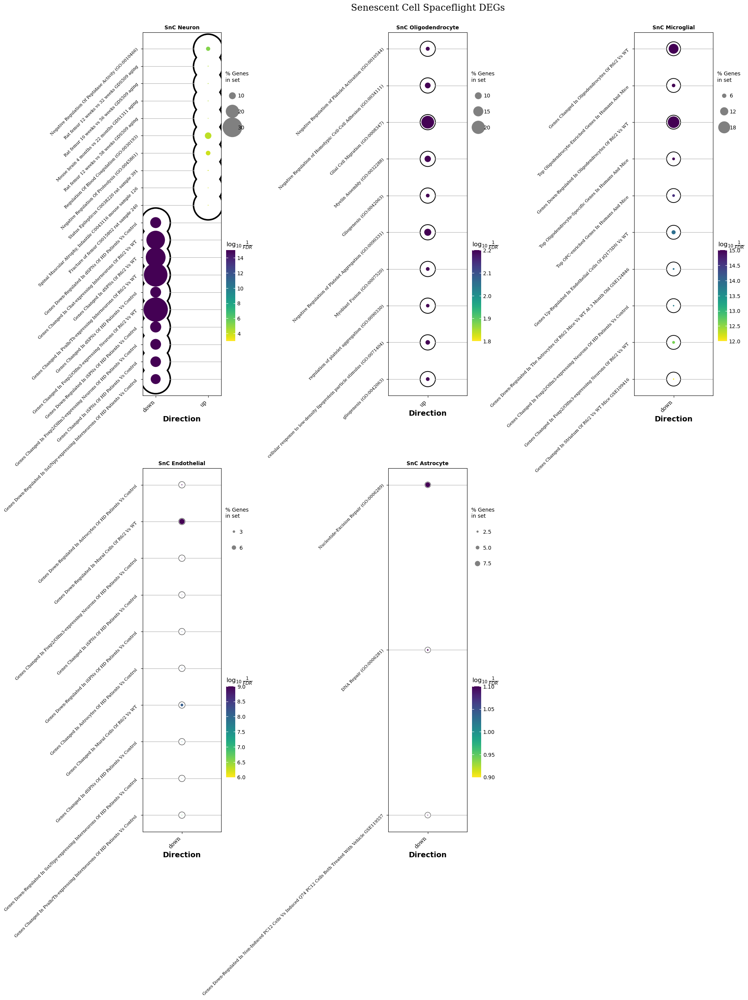

In [300]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()
df_degs = df_snc_markers.drop("All").reset_index(0, drop=True)
df_degs = df_degs[df_degs.pvals_adj < 1e-25]

factor_name = col_celltype
# factor_name = col_condition

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
gene_sets = dict(zip(["up", "down"], [[
    f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
        f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
    for i in ["up", "down"]]))
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

Term Short                                                                                                Genes  Adjusted P-value  Combined Score                             Gene_set  Odds Ratio  \
annotation_scanvi_collapsed Direction                                                                                                                                                                                                                                                          
Ground Control | 20 Weeks   up        1            Spinal Muscular Atrophy C0026847 mouse sample 235  CHRM2;DPP10;GRIA1;GALNT13;ATP8A2;DOCK3;LUZP2;AKAP6;CDH8;ELAVL2;RIMS1;GRIN2A;DPP6;LRRTM3;SPOCK1;T...      1.993044e-23      617.208151    Disease_Perturbations_from_GEO_up   10.543217   
                                      8                               GTEx Brain 20-29 vs 60-69 Down  EPHA5;GABRB2;GABBR2;RBFOX1;PTPRR;GPR26;KCNH7;GALNT17;KCNIP4;SLC4A10;UNC5D;ADCY1;GRIN2B;TRHDE;PPM...      1.841687e-09      187.429853           GTEx_Aging_Signatures_2021    7.318691   
                                      28                                             Neuronal System  GRIA1;GABRB2;NLGN1;CAMK2A;ADCY1;PPM1E;GRM1;RIMS1;GRIN2A;LRRTM3;LRRTM4;EPB41L3;DLGAP2;GRIA3;KCNH1...      1.162652e-08      131.058894               Reactome_Pathways_2024    5.395368   
                                      29                    Protein-protein Interactions at Synapses                     GRIA1;NLGN1;GRIN2A;LRRTM3;LRRTM4;IL1RAPL1;EPB41L3;DLGAP2;GRIN2B;APBA2;GRM1;GRIA3      7.070352e-07      226.423571               Reactome_Pathways_2024   11.617386   
                                      100  Modulation Of Chemical Synaptic Transmission (GO:0050804)                  GRIA1;NLGN1;CLSTN2;GRID1;CAMK2A;GRM1;RIMS1;GRM7;NRG3;GRM8;TMEM108;DLGAP2;DGKI;GRIA3      1.975362e-06      190.915446           GO_Biological_Process_2023    9.505557   
                                      131  Modulation of Chemical Synaptic Transmission (GO:0050804)                       GRIA1;NLGN1;CLSTN2;GRID1;CAMK2A;GRM1;RIMS1;GRM7;NRG3;GRM8;TMEM108;DLGAP2;GRIA3      9.456118e-06      170.055561           GO_Biological_Process_2025    9.218515   
                                      30                                   Neurexins and Neuroligins                                          NLGN1;GRIN2A;LRRTM3;LRRTM4;EPB41L3;DLGAP2;GRIN2B;APBA2;GRM1      1.209699e-05      221.935552               Reactome_Pathways_2024   13.661806   
                                      72                 chemical synaptic transmission (GO:0007268)  CHRM2;GRIA1;GABBR2;GABRB2;NLGN1;GABRA5;GRID1;HTR4;GRIN2B;CDH8;GRM1;RIMS1;GRIN2A;CACNB4;GRM7;KCNQ...      1.442806e-05       95.466865           GO_Biological_Process_2021    5.247455   
                                      73   modulation of chemical synaptic transmission (GO:0050804)                              RIMS1;NLGN1;CLSTN2;GRM7;NRG3;GRID1;GRM8;CAMK2A;TMEM108;DLGAP2;DGKI;GRM1      1.707230e-05      154.797857           GO_Biological_Process_2021    9.092552   
                                      74          regulation of cation channel activity (GO:2001257)                                  GRIA1;NLGN1;GRIN2A;CACNB4;FGF14;LRRC7;CAMK2A;DMD;GRIN2B;FGF12;GRIA3      1.707230e-05      174.955544           GO_Biological_Process_2021   10.336443   
Space Flight | 20 Weeks     up        191                                       rheumatoid arthritis                                                                                                  MIF      1.292602e-02      380.838180                         OMIM_Disease   87.578947   
Space Flight | 37 Weeks     up        162          Spinal Muscular Atrophy C0026847 mouse sample 235  SLC24A2;DOCK3;AKAP6;NALCN;NKAIN2;GRIN2A;SPOCK1;NRCAM;CTNNA2;NCAM2;LRRC4C;EDIL3;GPR158;DYNC1I1;PP...      1.971613e-12      195.549059    Disease_Perturbations_from_GEO_up    5.821291   
                                      163                 

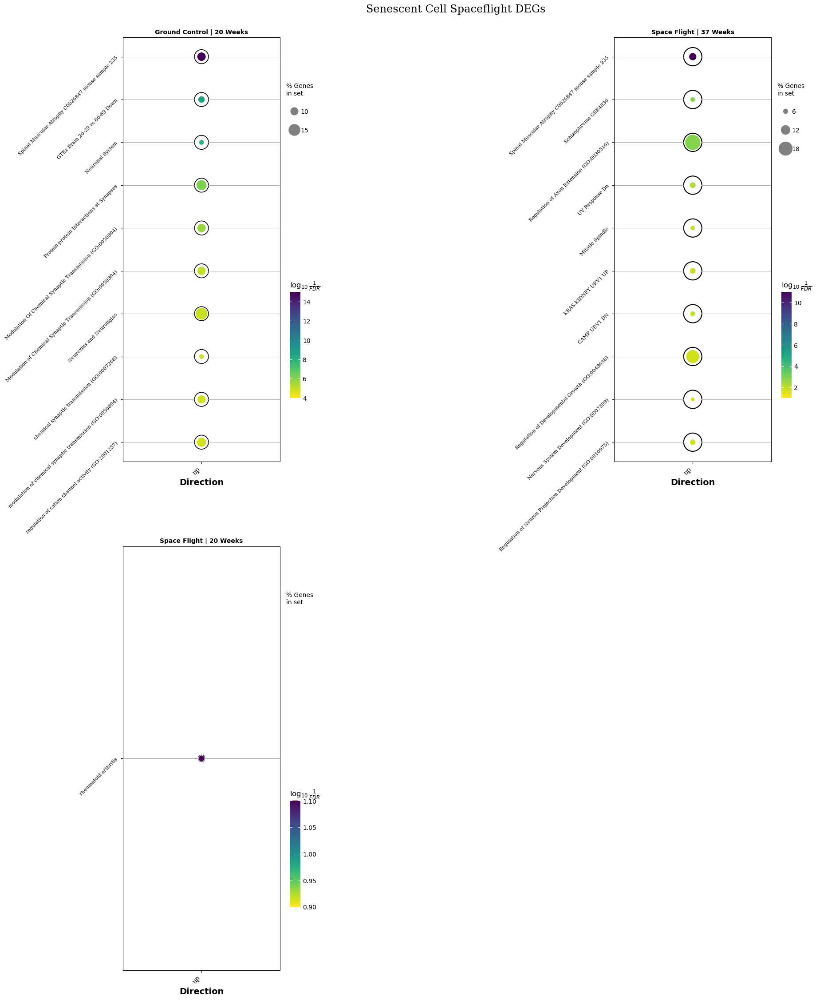

In [325]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

# factor_name = col_celltype
# factor_name = col_condition
factor_name = col_batch

df_degs = res_rank_genes.loc[:, "Overall", :]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              "Reactome_Pathways_2024",
              # "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

In [ ]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition

iii = 2
df_degs = res_rank_genes_top.loc[self.rna.obs[col_batch].unique()[iii]]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
print(self.rna.obs[col_batch].unique()[iii])

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

In [ ]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition

iii = 1
df_degs = res_rank_genes_top.loc[self.rna.obs[col_batch].unique()[iii]]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
print(self.rna.obs[col_batch].unique()[iii])

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))


Term Short                                                                                                Genes  Adjusted P-value  Combined Score                             Gene_set  Odds Ratio  \
annotation_scanvi_collapsed Direction                                                                                                                                                                                                                                                   
Ground Control              up        6    Mitochondrial Translation Initiation R-HSA-5368286  MTFMT;MRPS16;MRPS14;MRPL19;MRPS31;MRPS10;MRPL17;MRPL14;MRPL58;MRPS30;MTIF3;MRPL57;MRPL10;MRPL54;...      5.027872e-09      153.489620                        Reactome_2022    5.880377   
                                      7               Mitochondrial Translation R-HSA-5368287  MTFMT;MRPS16;MRPS14;MRPL19;MRPS31;MRPS10;MRPL17;MRPL14;MRPL58;MRPS30;MTIF3;MRPL57;MRPL10;MRPL54;...      5.027872e-09      141.931308                        Reactome_2022    5.529529   
                                      8   Mitochondrial Translation Termination R-HSA-5419276  MRPS16;MRPS14;MRPL19;MRPS31;MRPS10;MRPL17;MRPL14;MRPL58;MRPS30;MRPL57;MRPL10;MRPL54;MRPL55;MRPL4...      1.264662e-08      135.767523                        Reactome_2022    5.577953   
                                      19           Mitochondrial Gene Expression (GO:0140053)  MRPS16;FASTKD2;MRPS14;MRPL19;MRPS31;MRPL17;MRPS10;MRPL14;MRPL58;MRPS30;MRPL57;MRPL10;MRPL54;MRPL...      5.014934e-08      124.642724           GO_Biological_Process_2025    4.987540   
                                      9    Mitochondrial Translation Elongation R-HSA-5389840  MRPS16;MRPS14;MRPL19;MRPS31;MRPS10;MRPL17;MRPL14;MRPL58;MRPS30;MRPL57;MRPL10;MRPL54;MRPL55;MRPL4...      5.245910e-08      119.646848                        Reactome_2022    5.287160   
                                      10               mitochondrial translation (GO:0032543)  MRPS16;FASTKD2;MRPS14;MRPL19;MRPS31;MRPL17;MRPS10;MRPL14;MRPL58;MRPS30;MTIF3;MRPL57;MRPL10;MRPL5...      5.262355e-08      121.223739           GO_Biological_Process_2021    4.842374   
                                      20               Mitochondrial Translation (GO:0032543)  MRPS16;FASTKD2;MRPS14;MRPL19;MRPS31;MRPS10;MRPL17;MRPL14;MRPL58;MRPS30;MTIF3;MRPL57;MRPL10;MRPL5...      9.567462e-08      118.087214           GO_Biological_Process_2025    4.992753   
                                      3                             Mitochondrial Translation  MTFMT;MRPS16;MRPS14;MRPL19;MRPS31;MRPL17;MRPS10;MRPL14;MRPL58;MRPS30;MTIF3;MRPL57;MRPL10;MRPL54;...      1.073927e-07      108.176191               Reactome_Pathways_2024    4.761526   
                                      2                  Mitochondrial Translation Initiation  MTFMT;MRPS16;MRPS14;MRPL19;MRPS31;MRPS10;MRPL17;MRPL14;MRPL58;MRPS30;MTIF3;MRPL57;MRPL10;MRPL54;...      1.073927e-07      114.814084               Reactome_Pathways_2024    4.995829   
                                      16           Mitochondrial Gene Expression (GO:0140053)  MRPS16;FASTKD2;MRPS14;MRPL19;MRPS31;MRPL17;MRPS10;MRPL14;MRPL58;MRPS30;MRPL57;MRPL10;MRPL54;MRPL...      1.269586e-07      114.755739           GO_Biological_Process_2023    4.769897   
Space Flight                up        22                         Huntington's Disease GSE3621  TMEM185A;DCTN2;RAB1B;ILK;BCL10;COMMD8;ING3;SHARPIN;ACADM;ZSWIM7;SPTSSA;SLC37A3;GABPA;PHYH;CBX4;S...      2.376437e-02       20.029889  Disease_Signatures_from_GEO_up_2014    2.303505   

                                          Old Adjusted P-value  Old P-value Overlap       P-value  level_2  
annotation_scanvi_collapsed Direction                                                                       
Ground Control              up        6                      0            0   31/82  4.613652e-12     3340  
                                      7                      0            0   32/88  7.121632e-12     

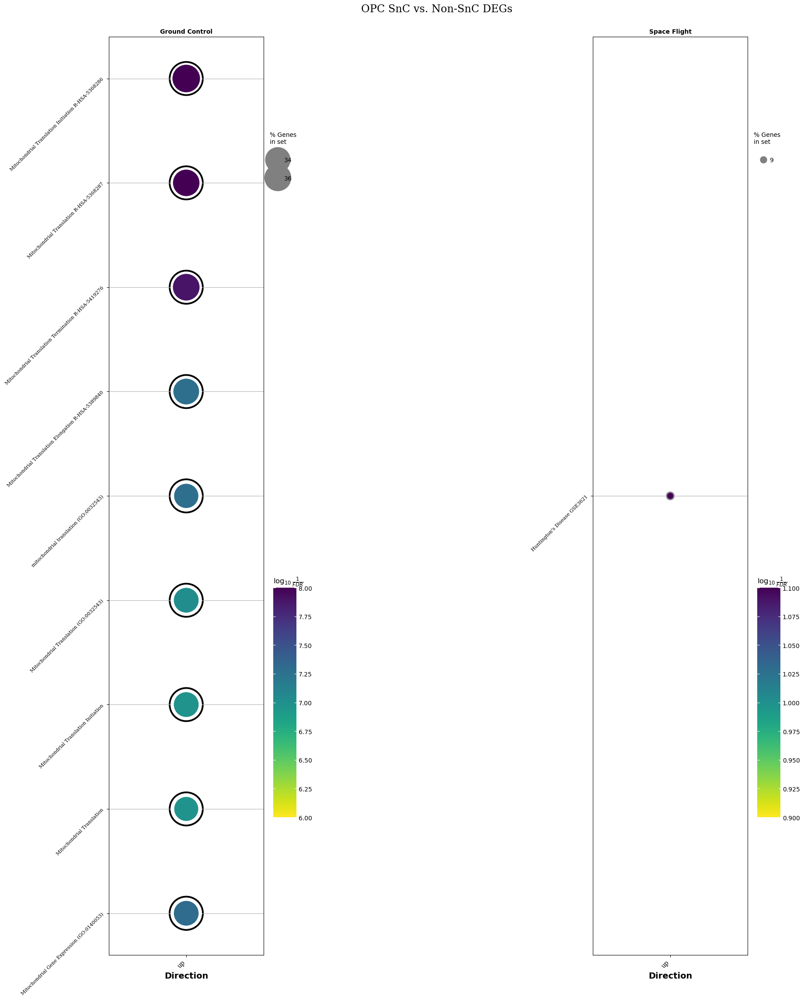

In [329]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

# factor_name = col_celltype
factor_name = col_condition
# factor_name = col_batch

c_t = "OPC"

df_degs = res_rank_genes.loc[:, c_t, :]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures",
              # "OMIM_Disease",
              "Reactome_Pathways_2024",
              "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle(f"{c_t} SnC vs. Non-SnC DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

Term Short                                                                                                Genes  Adjusted P-value  Combined Score                             Gene_set  Odds Ratio  \
annotation_scanvi_collapsed Direction                                                                                                                                                                                                                                                          
Astrocyte                   up        469                    Nucleotide-Excision Repair (GO:0006289)                                                         KAT5;PNKP;ERCC1;RPA3;ERCC2;MRPL36;XPC;GTF2H4      8.663651e-03      112.411712           GO_Biological_Process_2023    9.385057   
                                      464                                                 DNA Repair                                               TAF1C;TAF13;GTF2B;ERCC1;RPA3;ERCC2;ELOA;XPC;TAF6;NELFE      1.308552e-02       31.888348                 MSigDB_Hallmark_2020    4.026424   
                                      467                   Transcription Of HIV Genome R-HSA-167172                                                       CTDP1;TAF13;GTF2B;ERCC2;ELOA;TAF6;GTF2H4;NELFE      2.153893e-02       76.796735                        Reactome_2022    7.380064   
                                      465                            Transcription of the HIV Genome                                                       CTDP1;TAF13;GTF2B;ERCC2;ELOA;TAF6;GTF2H4;NELFE      2.564029e-02       72.850357               Reactome_Pathways_2024    7.145047   
                                      468    RNA Polymerase II Pre-transcription Events R-HSA-674695                                                       CTDP1;TAF13;GTF2B;ERCC2;ELOA;TAF6;GTF2H4;NELFE      3.151196e-02       58.318054                        Reactome_2022    6.249042   
                                      466                 RNA Polymerase II Pre-transcription Events                                                       CTDP1;TAF13;GTF2B;ERCC2;ELOA;TAF6;GTF2H4;NELFE      3.322208e-02       56.970240               Reactome_Pathways_2024    6.163124   
Endothelial                 up        547                       Hypertension C0020538 rat sample 209  EIF4A2;SLC12A2;ZFAND6;PTPRM;NR1D2;IGF1R;GRM3;PCM1;BCLAF1;MAT2A;CTSL;CSDE1;CANX;KLF9;SRSF2;CPE;MFGE8      5.002101e-09      275.515188    Disease_Perturbations_from_GEO_up   10.700433   
                                      548         Type 1 diabetes mellitus C0011854 mouse sample 204  EIF4A2;NCKAP1;CLIC4;H3F3B;UBE2B;LRBA;ATP5A1;CUL1;FNDC3A;CLU;RTN4;EIF1;LAPTM4A;CTSL;CSDE1;ETNK1;S...      4.267796e-07      119.837241    Disease_Perturbations_from_GEO_up    5.814947   
                                      549           Huntington's disease DOID-12858 mouse sample 702  SPAG9;H3F3B;FUS;ATP5A1;TRAPPC8;ATP5H;UBE2D2A;FBXO11;EIF1;ATP5B;MYL6;LAPTM4A;CTSL;OXCT1;CSDE1;GNB...      1.021872e-06      123.178076    Disease_Perturbations_from_GEO_up    6.372413   
                                      470              Mouse hippocampus 9 months vs 20 months aging  YWHAE;EIF4A2;H3F3B;FUS;NR1D2;TRAPPC8;ATP5H;UBE2D2A;CLU;RTN4;EIF1;HSP90B1;ATP5B;LAPTM4A;MAT2A;OXC...      1.481137e-06       98.394758      Aging_Perturbations_from_GEO_up    5.223509   
                                      471           Mouse retina 3 months vs 16 months GDS2654 aging  SLC12A2;H3F3B;LRBA;ZFAND6;ATP5A1;CLU;RTN4;EIF1;IGF1R;LAPTM4A;TEF;ETNK1;TRA2B;NPTN;CPE;HNRNPH3;SP...      1.481137e-06      102.389893      Aging_Perturbations_from_GEO_up    5.595719   
                                      550               Neurofibromatosis DOID-8712 mouse sample 667  SLC12A2;MEF2A;EIF4A2;NCKAP1;H3F3B;ATP5A1;UBE2D3;RTN4;HSP90B1;IGF1R;ARHGAP21;CSDE1;TRA2B;KLF9;NPT...      1.887453e-06      104.021332    Disease_Perturbations_from_GEO_up    5.644553   
                                      677                 

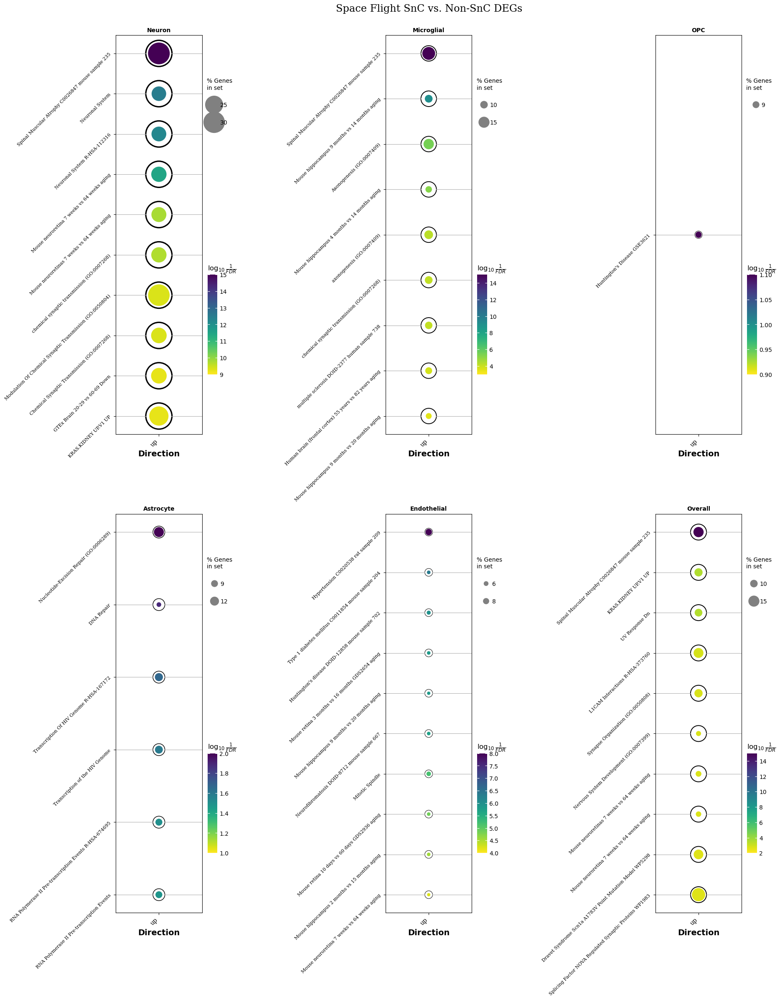

In [331]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition
# factor_name = col_batch

c_t = "Space Flight"

df_degs = res_rank_genes.loc[c_t]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures",
              # "OMIM_Disease",
              "Reactome_Pathways_2024",
              "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle(f"{c_t} SnC vs. Non-SnC DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

Term Short                                                                                                Genes  Adjusted P-value  Combined Score                             Gene_set  Odds Ratio  \
annotation_scanvi_collapsed Direction                                                                                                                                                                                                                                                                 
Endothelial                 up        962          Dravet Syndrome Scn1a A1783V Point Mutation Model WP5298                                  GRM3;GRIN2A;CACNB4;STX16;CAMK2A;EPB41L3;SLC1A2;PCDH19;SLC38A3;FGF13      7.687208e-04       80.004449              WikiPathways_2024_Mouse    6.765851   
                                      953                           Neurexins And Neuroligins R-HSA-6794361                                    NLGN1;GRIN2A;SYT1;LRRTM4;EPB41L1;EPB41L3;NRXN3;DLGAP1;LIN7A;LIN7C      7.805778e-04      125.285908                        Reactome_2022    8.932043   
                                      939                                         Neurexins and Neuroligins                                    NLGN1;GRIN2A;SYT1;LRRTM4;EPB41L1;EPB41L3;NRXN3;DLGAP1;LIN7A;LIN7C      8.494047e-04      125.285908               Reactome_Pathways_2024    8.932043   
                                      954            Protein-protein Interactions At Synapses R-HSA-6794362                            NLGN1;GRIN2A;PPFIBP2;SYT1;LRRTM4;EPB41L1;EPB41L3;NRXN3;DLGAP1;LIN7A;LIN7C      3.519495e-03       70.975239                        Reactome_2022    6.000926   
                                      940                          Protein-protein Interactions at Synapses                            NLGN1;GRIN2A;PPFIBP2;SYT1;LRRTM4;EPB41L1;EPB41L3;NRXN3;DLGAP1;LIN7A;LIN7C      3.829824e-03       70.975239               Reactome_Pathways_2024    6.000926   
                                      932                                           Osteoarthritis GSE16464  PHLPP2;TCERG1;TMEM87A;PIGU;SAR1A;IREB2;LIN7C;ZFX;RAB11A;ARCN1;SNX25;RAB12;HIVEP1;GNB4;MAPK1;UBAP...      4.881892e-03       31.079034  Disease_Signatures_from_GEO_up_2014    3.028005   
                                      931                         Down syndrome DOID-14250 mouse sample 529  SEC23A;TRAM1;SEMA3C;PARN;STK4;SNX27;PPME1;SNX25;POGZ;SLC16A6;PGGT1B;RIOK1;ME2;GPRASP1;MTPAP;CCDC...      5.359510e-03       31.601474    Disease_Perturbations_from_GEO_up    2.647092   
                                      942   Paradoxical Activation of RAF Signaling by Kinase Inactive BRAF                                                             RAP1B;CAMK2A;ARAF;MAPK1;KRAS;JAK2;CAMK2G      1.253189e-02       72.175804               Reactome_Pathways_2024    7.687141   
                                      945                               Signaling Downstream of RAS Mutants                                                             RAP1B;CAMK2A;ARAF;MAPK1;KRAS;JAK2;CAMK2G      1.253189e-02       72.175804               Reactome_Pathways_2024    7.687141   
                                      941                                         Signaling by RAF1 Mutants                                                             RAP1B;CAMK2A;ARAF;MAPK1;KRAS;JAK2;CAMK2G      1.253189e-02       86.017243               Reactome_Pathways_2024    8.593274   
Microglial                  up        893                 Spinal Muscular Atrophy C0026847 mouse sample 235  GABRB1;RAB3A;MYT1L;RASGRF2;FAIM2;GRIK2;SLC6A1;CDH8;LRRTM3;NRCAM;CHGB;SCN1A;PPFIA2;EPHA5;GRID2;GP...      3.916741e-09       83.032727    Disease_Perturbations_from_GEO_up    3.182815   
                                      889           Human brain (frontal cortex) 55 years vs 82 years aging  DOCK5;MEGF10;HHIP;CSRP1;CFL2;ENPP2;PDE8A;ELOVL1;GPR37;PLLP;OPALIN;VEZF1;SOX10;ERMN;GPRC5B;FOLH1;...      1.049337e-08       78.752213      Aging_Perturba

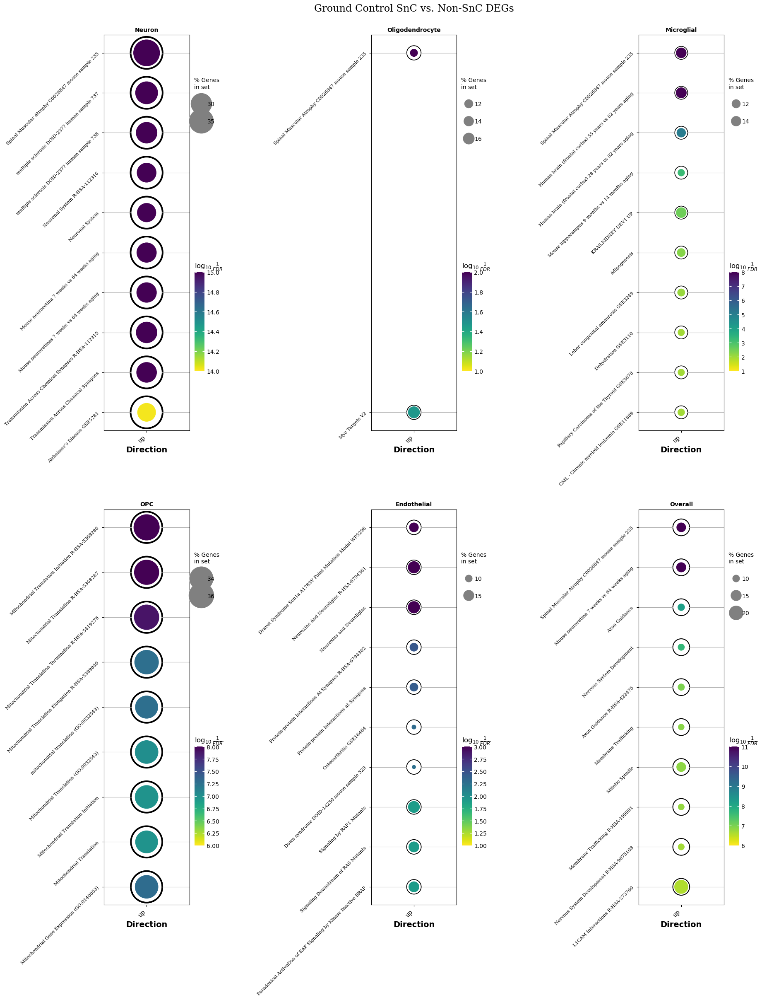

In [332]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition
# factor_name = col_batch

c_t = "Ground Control"

df_degs = res_rank_genes.loc[c_t]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures",
              # "OMIM_Disease",
              "Reactome_Pathways_2024",
              "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle(f"{c_t} SnC vs. Non-SnC DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]